# Cartographie thermique — ExtraTrees vs Gaussian Process : trajectoire × chauffage × régime

Ce notebook reprend le même pipeline que `NOTEBOOK_THERMIQUE_MODELE_UNIFIE_CasA_v3` (lecture des CSV, diagnostic stationnaire/instationnaire, features géométriques et CVC, encodage trajectoire × chauffage en *features* ) mais **limite le comparatif à deux modèles** :

- **ExtraTrees** (interprétation spatiale via features géométrie + voisins IDW, ou séquentielle pour l'instationnaire).
- **Gaussian Process** spatial dédié (position × chauffage, entraîné sur coordonnées réelles), avec estimation d'incertitude (écart-type prédictif).

**Nouveauté (régime stationnaire) :** en plus du régime stationnaire brut, on ajoute une version où le signal de température est rendu **artificiellement non stationnaire** par **ajout d'une tendance temporelle** `Y(t) = X(t) + a·t` (section 12bis), afin de tester si le gain de performance observé en régime instationnaire vient réellement de la non-stationnarité du signal ou d'autre chose (gradient, densité spatiale, information de voisinage, capacité du modèle).

Pour chaque régime, on obtient : un **tableau comparatif** (RMSE, MAE, MAPE, R²), une **visualisation en barres**, une **grille de parité réel vs prédit**, un **test de stabilité multi-seeds**, puis le **modèle le plus performant** est retenu pour reconstruire les cartes thermiques par combinaison trajectoire × chauffage.

## 0 — Installation et imports

In [1]:
!pip install -q scikit-learn pandas numpy matplotlib scipy
print('Librairies installées !')

Librairies installées !


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.interpolate import griddata
from scipy.spatial import cKDTree
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel
from sklearn.metrics import (
    mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
)
import warnings, re, os, glob

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')

print('Imports OK -- comparatif limite a 2 modeles : ExtraTrees, GaussianProcess')

Imports OK -- comparatif limite a 2 modeles : ExtraTrees, GaussianProcess


## 1 — Paramètres de la grille

In [3]:
# PARAMÈTRES DE LA GRILLE
LARGEUR  = 8   # axe X : A–H  (0–7) — 8 poteaux/colonnes
LONGUEUR = 5   # axe Y : 0–4        — 5 rangées en profondeur
HAUTEUR  = 3   # niveaux H1–H3 (axe Z : 0–2) — 3 hauteurs de capteur par poteau
N_CAPTEURS = 120

T_MIN_PHYSIQUE = -50
T_MAX_PHYSIQUE = 200

# --- Espacement RÉEL entre deux capteurs successifs (en mètres) -----------
# Mesuré sur le plan « Thermo-couple distribution » :
ESPACEMENT_X = 1.1   # entre deux poteaux successifs (colonnes i, b, c, ... h)
ESPACEMENT_Y = 1.2   # entre deux rangées successives (profondeur de la salle)
ESPACEMENT_Z = 0.5   # unité de base verticale (utilisée pour bâtir ALTITUDES_Z)

# Altitudes réelles (en mètres) des 3 niveaux de capteur sur chaque poteau
ALTITUDES_Z = [0.5, 1.0, 1.5]   # z=0 -> 0.5 m, z=1 -> 1.0 m, z=2 -> 1.5 m

# Dimensions physiques de la salle déduites de la grille de capteurs (m)
LARGEUR_M  = (LARGEUR  - 1) * ESPACEMENT_X
LONGUEUR_M = (LONGUEUR - 1) * ESPACEMENT_Y
HAUTEUR_M  = ALTITUDES_Z[-1]

# Pas de temps nominal entre deux points successifs de la trajectoire du robot.
# Utilisé (a) en secours si le parsing du temps échoue, (b) comme référence
# pour la feature dt_prev du modèle INSTATIONNAIRE (section 13).
PAS_TEMPOREL_SEQ = 20.0  # secondes

print(f'Grille configurée : {LARGEUR} × {LONGUEUR} × {HAUTEUR} '
      f'({LARGEUR_M:.1f} m × {LONGUEUR_M:.1f} m, jusqu\'à {HAUTEUR_M:.1f} m de haut)')
print(f'Espacement réel   : X={ESPACEMENT_X} m | Y={ESPACEMENT_Y} m | Z={ALTITUDES_Z} m')
print(f'Capteurs utilisés : {N_CAPTEURS}')
print(f'Pas temporel de la trajectoire (référence) : {PAS_TEMPOREL_SEQ:.0f} s')

Grille configurée : 8 × 5 × 3 (7.7 m × 4.8 m, jusqu'à 1.5 m de haut)
Espacement réel   : X=1.1 m | Y=1.2 m | Z=[0.5, 1.0, 1.5] m
Capteurs utilisés : 120
Pas temporel de la trajectoire (référence) : 20 s


## 2 — Équipements CVC (chauffage / climatisation)

Chaque source est définie par sa position `(x, y, z)` et son **type de diffusion**
(`horizontale` : reste concentrée à sa hauteur ; `verticale` : se propage sur toute la hauteur).
Adapte `SOURCES_FROID` / `SOURCES_CHAUD` à ton plan réel.

In [4]:
SOURCES_FROID = []  # ex. bouches de climatisation — vide si aucune
SOURCES_CHAUD = [
    # Heaters situés côté EST (mur x = LARGEUR-1 = colonne h), à mi-hauteur (z=1 -> 1.0 m)
    # d'après le plan « Thermo-couple distribution » (repère 'heaters' côté est).
    {'x': 7, 'y': 2, 'z': 1, 'type_diffusion': 'horizontale'},
    {'x': 7, 'y': 3, 'z': 1, 'type_diffusion': 'horizontale'},
]

POIDS_DIFFUSION = {
    'horizontale': {'xy': 1.0, 'z': 2.5},
    'verticale':   {'xy': 2.5, 'z': 0.3},
}

def dist_min_cvc(x, y, z, sources, espacement_x, espacement_y, altitudes_z,
                  poids_diffusion=POIDS_DIFFUSION):
    """Distance pondérée minimale (en mètres réels) vers la source CVC la plus
    proche + son type de diffusion. Les indices de grille (x, y, z) sont convertis
    en mètres via ESPACEMENT_X / ESPACEMENT_Y / ALTITUDES_Z avant tout calcul,
    car la grille n'est PAS un cube régulier (1.1 m × 1.2 m × altitudes non
    uniformes) : mélanger indices et mètres fausserait les distances."""
    if not sources:
        return 99.0, 'aucune'
    x_m, y_m, z_m = x * espacement_x, y * espacement_y, altitudes_z[int(z)]
    candidats = []
    for s in sources:
        sx, sy, sz = s['x'], s['y'], s.get('z', 0)
        sx_m, sy_m, sz_m = sx * espacement_x, sy * espacement_y, altitudes_z[int(sz)]
        type_d = s.get('type_diffusion', 'horizontale')
        poids = poids_diffusion[type_d]
        d_xy = np.sqrt((x_m - sx_m) ** 2 + (y_m - sy_m) ** 2)
        d_z = abs(z_m - sz_m)
        d = np.sqrt((poids['xy'] * d_xy) ** 2 + (poids['z'] * d_z) ** 2)
        candidats.append((d, type_d))
    return min(candidats, key=lambda t: t[0])

print('Sources CVC configurées :', len(SOURCES_FROID), 'froid /', len(SOURCES_CHAUD), 'chaud')
print(f'Salle : {LARGEUR_M:.1f} m × {LONGUEUR_M:.1f} m × {HAUTEUR_M:.1f} m — '
      f'distances CVC calculées en mètres réels.')

Sources CVC configurées : 0 froid / 2 chaud
Salle : 7.7 m × 4.8 m × 1.5 m — distances CVC calculées en mètres réels.


## 3 — Mapping capteur → position (x, y, z)

In [5]:
def build_sensor_positions(largeur, longueur, hauteur):
    """{numéro_capteur: (x, y, z)} — ordre : Y, puis X, puis Z (adapte si ton export diffère)."""
    pos = {}
    n = 1
    for y in range(longueur):
        for x in range(largeur):
            for z in range(hauteur):
                pos[n] = (x, y, z)
                n += 1
    return pos

capteur_positions = build_sensor_positions(LARGEUR, LONGUEUR, HAUTEUR)
print(f'{len(capteur_positions)} positions capteurs construites')

120 positions capteurs construites


## 4 — Pipeline de lecture / nettoyage / temps (fonction réutilisable)

Cette fonction encapsule les étapes robustes du notebook d'origine (lecture multi-format,
nettoyage physique, parsing du temps, direction aller/retour) pour pouvoir être appelée
**une fois par fichier CSV** (le fichier principal, et un fichier par type de chauffage
supplémentaire à la section 6).

In [6]:
def lire_et_nettoyer_csv(filename, n_capteurs=N_CAPTEURS,
                          t_min_phys=T_MIN_PHYSIQUE, t_max_phys=T_MAX_PHYSIQUE,
                          pas_temporel_secours=PAS_TEMPOREL_SEQ):
    """Lit un CSV brut (export type Row, Time, Temperature1..N) et retourne
    un DataFrame propre avec colonnes temp_cols, 't_sec', 'direction_encode'."""
    df_raw = None
    for sep, dec in [(',', ','), (';', '.'), (',', '.'), (';', ',')]:
        try:
            tmp = pd.read_csv(filename, sep=sep, decimal=dec, dtype=str)
            if tmp.shape[1] > 10:
                df_raw = tmp
                break
        except Exception:
            pass
    if df_raw is None:
        raise ValueError(f'Impossible de lire {filename} — vérifiez le format.')

    # Detection robuste des lignes corrompues : la colonne 'Row' (1ere colonne)
    # doit etre un entier valide. Certains exports CSV perdent ce numero sur la
    # toute premiere ligne de donnees, ce qui decale TOUTES les valeurs d'une
    # colonne vers la gauche (un fragment de timestamp tronque atterrit dans
    # 'Row', une temperature atterrit dans 'Time', etc. -- vu sur ThermoCouple.csv,
    # ligne 2 : ':59.296,29.8556,...' au lieu de '1,7:52:59 AM,29.8556,...').
    # L'ancienne detection par regex sur le contenu du champ ne couvrait pas ce
    # cas (commence par ':', pas par un chiffre) -- on verifie directement la
    # validite du numero de ligne, plus robuste que deviner le format casse.
    row_col = df_raw.columns[0]
    row_num = pd.to_numeric(df_raw[row_col], errors='coerce')
    n_avant_corrompu = len(df_raw)
    df_raw = df_raw[row_num.notna()].reset_index(drop=True)
    n_supprimees = n_avant_corrompu - len(df_raw)
    if n_supprimees > 0:
        print(f"  [{filename}] {n_supprimees} ligne(s) corrompue(s) "
              f"(numero de ligne invalide -> colonnes decalees) supprimee(s).")

    df = df_raw.copy()
    temp_cols_all = [c for c in df.columns
                     if re.match(r'Temperature\d+', c, re.I) or re.match(r'Temp\d+', c, re.I)]
    temp_cols = temp_cols_all[:n_capteurs]

    for col in temp_cols:
        df[col] = (df[col].astype(str).str.replace(',', '.', regex=False)
                   .pipe(pd.to_numeric, errors='coerce'))

    time_col = df.columns[1]

    for col in temp_cols:
        mask = (df[col] < t_min_phys) | (df[col] > t_max_phys)
        df.loc[mask, col] = np.nan
    for col in temp_cols:
        p1, p99 = df[col].quantile([0.01, 0.99])
        df[col] = df[col].clip(p1, p99)

    # Parsing du temps
    time_ok = False
    for fmt in ['%I:%M:%S %p', '%H:%M:%S', '%M:%S', '%H:%M:%S.%f', '%H:%M']:
        try:
            parsed = pd.to_datetime(df[time_col].astype(str).str.strip(), format=fmt, errors='coerce')
            if parsed.notna().sum() >= max(1, len(df) * 0.5):
                df['time'] = parsed
                t0 = df['time'].min()
                df['t_sec'] = (df['time'] - t0).dt.total_seconds()
                time_ok = True
                break
        except Exception:
            pass
    if not time_ok:
        df['t_sec'] = np.arange(len(df)) * pas_temporel_secours

    # Direction aller/retour
    if 'Direction' in df.columns or 'direction' in df.columns:
        dir_col = 'Direction' if 'Direction' in df.columns else 'direction'
        df['direction'] = df[dir_col].astype(str).str.upper()
    else:
        df['t_diff']    = df['t_sec'].diff()
        df['is_jump']   = df['t_diff'] < 0
        df['cycle_num'] = df['is_jump'].cumsum()
        df['direction'] = df['cycle_num'].apply(lambda x: 'ALLER' if x % 2 == 0 else 'RETOUR')
    df['direction_encode'] = (df['direction'] == 'RETOUR').astype(int)
    if df['direction_encode'].nunique() <= 1:
        print(f"  [{filename}] attention : 'direction_encode' est constante sur ce fichier "
              f"(pas de colonne Direction dans le CSV, et aucun retour en arriere detecte "
              f"dans t_sec -> une seule session continue) -- cette feature n'apporte aucune "
              f"information sur ce fichier.")

    df['temperature_mean'] = df[temp_cols].mean(axis=1)

    return df, temp_cols

print('Fonction lire_et_nettoyer_csv() prête.')

Fonction lire_et_nettoyer_csv() prête.


## 5 — Chargement du fichier CSV principal

In [7]:
try:
    from google.colab import files
    print('Sélectionnez votre fichier CSV principal (mesure de référence)...')
    uploaded = files.upload()
    FICHIER_PRINCIPAL = list(uploaded.keys())[0]
except ImportError:
    FICHIER_PRINCIPAL = 'mesure_principale.csv'  # <- adapte le chemin si tu n'es pas sur Colab
    print(f'Hors Colab : dépose ton CSV puis mets à jour FICHIER_PRINCIPAL (actuel : {FICHIER_PRINCIPAL})')

df, temp_cols = lire_et_nettoyer_csv(FICHIER_PRINCIPAL)
print(f'Fichier chargé : {FICHIER_PRINCIPAL}')
print(f'Shape : {df.shape}  |  {len(temp_cols)} colonnes de température')
print(f't_sec : {df["t_sec"].min():.0f}s -> {df["t_sec"].max():.0f}s')

Sélectionnez votre fichier CSV principal (mesure de référence)...


Saving ThermoCouple.csv to ThermoCouple.csv
  [ThermoCouple.csv] 2 ligne(s) corrompue(s) (numero de ligne invalide -> colonnes decalees) supprimee(s).
  [ThermoCouple.csv] attention : 'direction_encode' est constante sur ce fichier (pas de colonne Direction dans le CSV, et aucun retour en arriere detecte dans t_sec -> une seule session continue) -- cette feature n'apporte aucune information sur ce fichier.
Fichier chargé : ThermoCouple.csv
Shape : (896, 130)  |  120 colonnes de température
t_sec : 0s -> 17920s


## 6 — Diagnostic stationnaire / instationnaire

**Étape 1** : test global (régression température ~ temps).
**Étape 2** : test par fenêtres glissantes.
**Étape 3** : détection du point de bascule et scission `df_transitoire` / `df_stationnaire`.

In [8]:
def test_stationnarite(t, T, seuil_pente_C_par_h=0.5, seuil_p=0.05, verbose=True):
    t = np.asarray(t, dtype=float); T = np.asarray(T, dtype=float)
    mask = ~np.isnan(t) & ~np.isnan(T)
    t, T = t[mask], T[mask]
    if len(t) < 5:
        return {'verdict': 'INDÉTERMINÉ', 'pente_C_par_h': np.nan, 'r2': np.nan, 'p_value': np.nan}

    pente, ordonnee, r_value, p_value, std_err = stats.linregress(t, T)
    pente_C_par_h = pente * 3600

    if p_value > seuil_p:
        verdict = 'STATIONNAIRE'
    elif abs(pente_C_par_h) <= seuil_pente_C_par_h:
        verdict = 'QUASI-STATIONNAIRE'
    else:
        verdict = 'TRANSITOIRE'

    if verbose:
        print(f'Pente : {pente_C_par_h:+.4f} °C/h | R² : {r_value**2:.4f} | p-value : {p_value:.4g}')
        print(f'>>> VERDICT GLOBAL : {verdict}')
    return {'verdict': verdict, 'pente_C_par_h': pente_C_par_h, 'r2': r_value**2, 'p_value': p_value}


def detecter_phases(df, time_col='t_sec', temp_col='temperature_mean',
                     fenetre_min=30, pas_min=5, seuil_pente_C_par_h=0.5, seuil_p=0.05):
    t_all = df[time_col].values.astype(float)
    T_all = df[temp_col].values.astype(float)
    fenetre_s, pas_s = fenetre_min * 60, pas_min * 60
    t_min, t_max = np.nanmin(t_all), np.nanmax(t_all)

    records, t_debut = [], t_min
    while t_debut + fenetre_s <= t_max:
        t_fin = t_debut + fenetre_s
        m = (t_all >= t_debut) & (t_all < t_fin)
        if m.sum() >= 10:
            res = test_stationnarite(t_all[m], T_all[m], seuil_pente_C_par_h, seuil_p, verbose=False)
            records.append({'t_debut_min': t_debut / 60, 't_fin_min': t_fin / 60, **res})
        t_debut += pas_s

    phases = pd.DataFrame(records)
    print(f'{len(phases)} fenêtres analysées ({fenetre_min} min, pas {pas_min} min)')
    if len(phases):
        print(phases['verdict'].value_counts().to_string())
    return phases


def scinder_stationnaire(df, phases, time_col='t_sec', n_fenetres_stables=3):
    if len(phases) == 0:
        print('Pas assez de données pour détecter des phases -> tout le run est considéré STATIONNAIRE.')
        return df.iloc[0:0].copy(), df.copy(), None

    est_stable = phases['verdict'].isin(['STATIONNAIRE', 'QUASI-STATIONNAIRE'])
    t_bascule_min = None
    for i in range(len(phases) - n_fenetres_stables + 1):
        if est_stable.iloc[i:i + n_fenetres_stables].all():
            t_bascule_min = phases['t_debut_min'].iloc[i]
            break

    if t_bascule_min is None:
        print('Aucune phase stationnaire stable détectée -> tout le run est considéré INSTATIONNAIRE.')
        return df.copy(), df.iloc[0:0].copy(), None

    t_bascule_s = t_bascule_min * 60
    df_transitoire  = df[df[time_col] <  t_bascule_s].copy()
    df_stationnaire = df[df[time_col] >= t_bascule_s].copy()
    print(f'Bascule détectée à t = {t_bascule_min:.1f} min')
    print(f'  INSTATIONNAIRE : {len(df_transitoire):,} lignes')
    print(f'  STATIONNAIRE   : {len(df_stationnaire):,} lignes')
    return df_transitoire, df_stationnaire, t_bascule_min


print('ÉTAPE 1 — Test global')
resultat_global = test_stationnarite(df['t_sec'].values, df['temperature_mean'].values)
print('\nÉTAPE 2 — Fenêtres glissantes')
phases = detecter_phases(df)
print('\nÉTAPE 3 — Scission transitoire / stationnaire')
df_transitoire, df_stationnaire, t_bascule = scinder_stationnaire(df, phases)

ÉTAPE 1 — Test global
Pente : -1.5292 °C/h | R² : 0.5270 | p-value : 1.675e-147
>>> VERDICT GLOBAL : TRANSITOIRE

ÉTAPE 2 — Fenêtres glissantes
54 fenêtres analysées (30 min, pas 5 min)
verdict
TRANSITOIRE           23
QUASI-STATIONNAIRE    23
STATIONNAIRE           8

ÉTAPE 3 — Scission transitoire / stationnaire
Bascule détectée à t = 100.0 min
  INSTATIONNAIRE : 299 lignes
  STATIONNAIRE   : 597 lignes


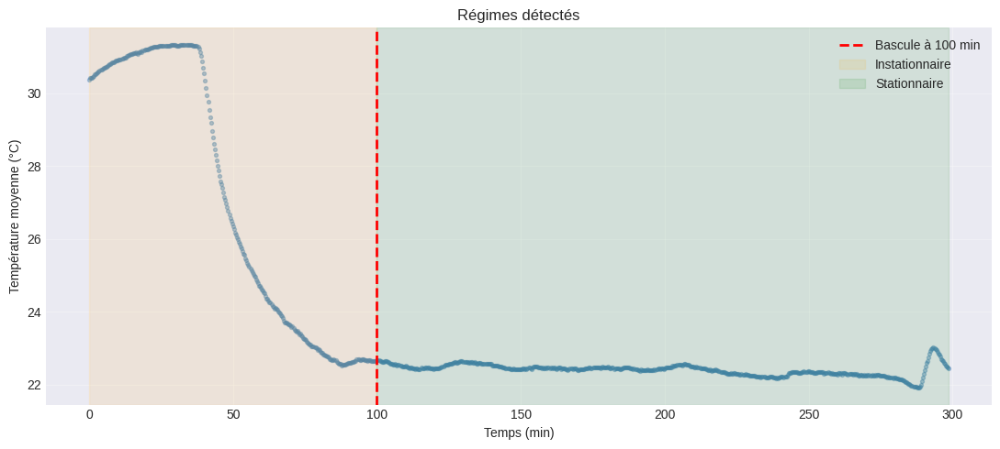

In [9]:
fig, ax = plt.subplots(figsize=(11, 5))
t_min_arr = df['t_sec'].values / 60
ax.scatter(t_min_arr, df['temperature_mean'], s=8, alpha=0.4, color='steelblue')
if t_bascule is not None:
    ax.axvline(t_bascule, color='red', ls='--', lw=2, label=f'Bascule à {t_bascule:.0f} min')
    ax.axvspan(0, t_bascule, color='orange', alpha=0.1, label='Instationnaire')
    ax.axvspan(t_bascule, t_min_arr.max(), color='green', alpha=0.1, label='Stationnaire')
ax.set_xlabel('Temps (min)'); ax.set_ylabel('Température moyenne (°C)')
ax.set_title('Régimes détectés'); ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

## 7 — Construction du format long (1 ligne = 1 capteur × 1 instant), avec `phase`, `trajectory_type`, `heating_type`

C'est le format pivot utilisé pour les deux modèles (stationnaire et instationnaire).

In [10]:
def construire_df_long(df_source, capteur_positions, temp_cols, t_bascule,
                        trajectory_type, heating_type):
    """Reconstruit le format long et ajoute la phase (stationnaire/instationnaire),
    le type de trajectoire et le type de chauffage — ce sont les 3 features
    'catégorielles' du Cas A."""
    records = []
    for _, row in df_source.iterrows():
        t_val   = float(row['t_sec'])
        dir_val = int(row['direction_encode'])
        for i, col in enumerate(temp_cols):
            sensor_num = i + 1
            temp_val = row[col]
            if pd.isna(temp_val):
                continue
            pos = capteur_positions.get(sensor_num)
            if pos is None:
                continue
            x_, y_, z_ = pos
            records.append({
                'sensor_id': sensor_num, 'x': x_, 'y': y_, 'z': z_,
                't_sec': t_val, 'direction_encode': dir_val, 'temperature': float(temp_val),
            })
    dfl = pd.DataFrame(records)
    if len(dfl) == 0:
        return dfl
    if t_bascule is not None:
        dfl['phase'] = np.where(dfl['t_sec'] < t_bascule * 60, 'instationnaire', 'stationnaire')
    else:
        dfl['phase'] = 'stationnaire'
    dfl['trajectory_type'] = trajectory_type
    dfl['heating_type'] = heating_type
    return dfl

HEATING_TYPE_PRINCIPAL = 'mesure_principale'   # renomme si besoin
TRAJECTORY_TYPE_MESUREE = 'Serpentine (mesurée)'

df_long = construire_df_long(df, capteur_positions, temp_cols, t_bascule,
                              TRAJECTORY_TYPE_MESUREE, HEATING_TYPE_PRINCIPAL)
print(f'df_long : {len(df_long):,} lignes')
print(df_long['phase'].value_counts())

df_long : 107,520 lignes
phase
stationnaire      71640
instationnaire    35880
Name: count, dtype: int64


## 8 — Trajectoires de couverture alternatives (simulation)

On simule d'autres façons pour le robot de parcourir la grille, en ne gardant que les
positions `(x, y)` correspondantes dans les données déjà mesurées. Cela donne, en plus de
la trajectoire réellement mesurée, des variantes utilisables comme *feature* `trajectory_type`.

In [11]:
positions_uniques = sorted(set(map(tuple, df_long[['x', 'y']].values.tolist())))
n_positions = len(positions_uniques)
FRACTION_PARTIELLE = 0.4
n_partiel = max(4, int(round(n_positions * FRACTION_PARTIELLE)))

def positions_perimetre(positions, largeur, longueur):
    return [p for p in positions if p[0] in (0, largeur - 1) or p[1] in (0, longueur - 1)]

def positions_zigzag(positions, pas=2):
    xs = sorted(set(p[0] for p in positions))
    cols_gardees = set(xs[::pas])
    return [p for p in positions if p[0] in cols_gardees]

def positions_aleatoire(positions, n, seed=42):
    rng = np.random.RandomState(seed)
    idx = rng.choice(len(positions), size=min(n, len(positions)), replace=False)
    return [positions[i] for i in idx]

def positions_fps(positions, n, seed=42):
    pts = np.array(positions, dtype=float)
    rng = np.random.RandomState(seed)
    chosen_idx = [int(rng.randint(len(pts)))]
    dists = np.linalg.norm(pts - pts[chosen_idx[0]], axis=1)
    while len(chosen_idx) < n:
        next_idx = int(np.argmax(dists))
        chosen_idx.append(next_idx)
        new_d = np.linalg.norm(pts - pts[next_idx], axis=1)
        dists = np.minimum(dists, new_d)
    return [positions[i] for i in chosen_idx]

trajectoires_subset = {
    'Périmètre':       positions_perimetre(positions_uniques, LARGEUR, LONGUEUR),
    'Zigzag diagonal': positions_zigzag(positions_uniques, pas=2),
    'Aléatoire':       positions_aleatoire(positions_uniques, n_partiel),
    'FPS':             positions_fps(positions_uniques, n_partiel),
}
for nom, subset in trajectoires_subset.items():
    print(f'{nom:20s}: {len(subset):3d}/{n_positions} positions ({len(subset)/n_positions*100:.0f}%)')

Périmètre           :  22/40 positions (55%)
Zigzag diagonal     :  20/40 positions (50%)
Aléatoire           :  16/40 positions (40%)
FPS                 :  16/40 positions (40%)


## 9 — Fusion : `df_fusion` (trajectoire × chauffage)

On assemble : la trajectoire mesurée (chauffage principal + chauffages additionnels, couverture 100%)
et les trajectoires partielles simulées (Périmètre, Zigzag, Aléatoire, FPS — appliquées uniquement
au chauffage principal, dont on connaît chaque position mesurée).

In [12]:
morceaux = [df_long]

positions_all = list(zip(df_long['x'].values, df_long['y'].values))
for nom_traj, subset in trajectoires_subset.items():
    subset_set = set(subset)
    mask = np.array([p in subset_set for p in positions_all])
    d = df_long.loc[mask].copy()
    d['trajectory_type'] = nom_traj
    morceaux.append(d)

df_fusion = pd.concat(morceaux, ignore_index=True)
print(f'df_fusion : {len(df_fusion):,} lignes')
print('\ntrajectory_type :'); print(df_fusion['trajectory_type'].value_counts().to_string())
print('\nheating_type :');    print(df_fusion['heating_type'].value_counts().to_string())
print('\nphase :');           print(df_fusion['phase'].value_counts().to_string())

df_fusion : 306,432 lignes

trajectory_type :
trajectory_type
Serpentine (mesurée)    107520
Périmètre                59136
Zigzag diagonal          53760
Aléatoire                43008
FPS                      43008

heating_type :
heating_type
mesure_principale    306432

phase :
phase
stationnaire      204174
instationnaire    102258


## 10 — Features géométriques et CVC (communes aux deux modèles)

In [13]:
cx = (LARGEUR  - 1) / 2 * ESPACEMENT_X
cy = (LONGUEUR - 1) / 2 * ESPACEMENT_Y
cz = (ALTITUDES_Z[0] + ALTITUDES_Z[-1]) / 2

# Positions converties en mètres réels (utilisées pour TOUTES les distances physiques)
df_fusion['x_m'] = df_fusion['x'] * ESPACEMENT_X
df_fusion['y_m'] = df_fusion['y'] * ESPACEMENT_Y
df_fusion['z_m'] = df_fusion['z'].map(lambda z: ALTITUDES_Z[int(z)])

df_fusion['dist_edge_x'] = np.minimum(df_fusion['x_m'], LARGEUR_M  - df_fusion['x_m'])
df_fusion['dist_edge_y'] = np.minimum(df_fusion['y_m'], LONGUEUR_M - df_fusion['y_m'])
df_fusion['dist_edge_z'] = np.minimum(df_fusion['z_m'], HAUTEUR_M  - df_fusion['z_m'])
df_fusion['dist_center'] = np.sqrt(
    (df_fusion['x_m'] - cx) ** 2 + (df_fusion['y_m'] - cy) ** 2 + (df_fusion['z_m'] - cz) ** 2)

# Distance/influence CVC : pré-calculée une fois par position (x, y, z) unique -> jointure (plus rapide que .apply ligne à ligne)
positions_xyz = df_fusion[['x', 'y', 'z']].drop_duplicates()
_froid = positions_xyz.apply(
    lambda r: dist_min_cvc(r['x'], r['y'], r['z'], SOURCES_FROID, ESPACEMENT_X, ESPACEMENT_Y, ALTITUDES_Z), axis=1)
_chaud = positions_xyz.apply(
    lambda r: dist_min_cvc(r['x'], r['y'], r['z'], SOURCES_CHAUD, ESPACEMENT_X, ESPACEMENT_Y, ALTITUDES_Z), axis=1)
positions_xyz = positions_xyz.assign(
    dist_froid=_froid.apply(lambda t: t[0]),
    froid_diffusion_verticale=(_froid.apply(lambda t: t[1]) == 'verticale').astype(int),
    dist_chaud=_chaud.apply(lambda t: t[0]),
    chaud_diffusion_verticale=(_chaud.apply(lambda t: t[1]) == 'verticale').astype(int),
)
df_fusion = df_fusion.merge(positions_xyz, on=['x', 'y', 'z'], how='left')
df_fusion['influence_froid'] = 1.0 / (1.0 + df_fusion['dist_froid'])
df_fusion['influence_chaud'] = 1.0 / (1.0 + df_fusion['dist_chaud'])

print('Features géométriques/CVC créées (distances en mètres réels : '
      f'{ESPACEMENT_X} m × {ESPACEMENT_Y} m × altitudes {ALTITUDES_Z}).')
print(df_fusion[['dist_center', 'dist_froid', 'dist_chaud', 'influence_froid', 'influence_chaud']].describe().round(3))

Features géométriques/CVC créées (distances en mètres réels : 1.1 m × 1.2 m × altitudes [0.5, 1.0, 1.5]).
       dist_center  dist_froid  dist_chaud  influence_froid  influence_chaud
count   306432.000    306432.0  306432.000        306432.00       306432.000
mean         3.045        99.0       4.564             0.01            0.229
std          1.044         0.0       2.311             0.00            0.144
min          0.550        99.0       0.000             0.01            0.109
25%          2.462        99.0       2.530             0.01            0.130
50%          2.955        99.0       4.561             0.01            0.180
75%          3.882        99.0       6.717             0.01            0.283
max          4.564        99.0       8.162             0.01            1.000


## 11 — Encodage Cas A : trajectoire + chauffage comme *features* (one-hot)

**Cas A** = le modèle sait toujours quelle trajectoire et quel chauffage ont produit la mesure
(pas de classification à deviner). C'est le seul cas retenu ici.

In [14]:
traj_dummies = pd.get_dummies(df_fusion['trajectory_type'], prefix='traj')
heat_dummies = pd.get_dummies(df_fusion['heating_type'], prefix='chauff')
df_fusion = pd.concat([df_fusion.reset_index(drop=True),
                        traj_dummies.reset_index(drop=True),
                        heat_dummies.reset_index(drop=True)], axis=1)

# direction_encode (0=ALLER, 1=RETOUR) est deja present dans df_fusion depuis
# lire_et_nettoyer_csv / construire_df_long (donnee collectee, pas predite --
# soit lue directement depuis une colonne 'Direction' envoyee par le robot,
# soit deduite des retours en arriere dans t_sec si le robot ne l'envoie pas).
# On l'ajoute ici aux features categorielles pour que le modele (ExtraTrees
# sur le residu, section 17) puisse apprendre un eventuel biais aller/retour
# (echauffement du robot lui-meme, derive du capteur selon le sens...).
FEATURES_CATEGORIELLES = list(traj_dummies.columns) + list(heat_dummies.columns) + ['direction_encode']
FEATURES_GEOMETRIE_CVC = [
    'x', 'y', 'z', 'dist_edge_x', 'dist_edge_y', 'dist_edge_z', 'dist_center',
    'dist_froid', 'dist_chaud', 'influence_froid', 'influence_chaud',
    'froid_diffusion_verticale', 'chaud_diffusion_verticale',
]
print(f'{len(FEATURES_CATEGORIELLES)} features categorielles (trajectoire+chauffage+direction) : {FEATURES_CATEGORIELLES}')

# Diagnostic : verifier que direction_encode n'est pas vide/constante sur l'ensemble fusionne
if 'direction_encode' in df_fusion.columns:
    vc_dir = df_fusion['direction_encode'].value_counts(dropna=False)
    print(f"\nRepartition direction_encode sur df_fusion (0=ALLER, 1=RETOUR) :")
    print(vc_dir.to_string())
    if df_fusion['direction_encode'].isna().any():
        print("  attention : des valeurs manquantes -> ces lignes seront traitees comme ALLER par defaut ailleurs, verifier la source.")
    if vc_dir.shape[0] <= 1:
        print("  attention : une seule valeur presente -> aucun aller-retour detecte/envoye sur ces donnees, la feature n'apportera rien.")


7 features categorielles (trajectoire+chauffage+direction) : ['traj_Aléatoire', 'traj_FPS', 'traj_Périmètre', 'traj_Serpentine (mesurée)', 'traj_Zigzag diagonal', 'chauff_mesure_principale', 'direction_encode']

Repartition direction_encode sur df_fusion (0=ALLER, 1=RETOUR) :
direction_encode
0    306432
  attention : une seule valeur presente -> aucun aller-retour detecte/envoye sur ces donnees, la feature n'apportera rien.


## 11bis — Analyse géométrique et visualisation 3D des capteurs

Avant toute modélisation, on reconstruit la géométrie physique réelle des 120 capteurs
(à partir de `LARGEUR`, `LONGUEUR`, `HAUTEUR`, `ESPACEMENT_X`, `ESPACEMENT_Y`, `ALTITUDES_Z`),
on vérifie le maillage, on le visualise en 3D, puis on identifie les zones les moins bien couvertes.

In [15]:
# --- Reconstruction des coordonnees physiques reelles (metres) des 120 capteurs ---
positions_df = pd.DataFrame(
    [(n, x, y, z, x * ESPACEMENT_X, y * ESPACEMENT_Y, ALTITUDES_Z[z])
     for n, (x, y, z) in capteur_positions.items()],
    columns=['capteur', 'x', 'y', 'z', 'x_m', 'y_m', 'z_m']
)

assert len(positions_df) == N_CAPTEURS == 120, "Le nombre de capteurs reconstruits ne correspond pas a 120"
print(f'Verification : {len(positions_df)} capteurs reconstruits (attendu : {N_CAPTEURS}) -> OK')
print()
print(f'Dimensions physiques de la chambre : {LARGEUR_M:.2f} m (X) x {LONGUEUR_M:.2f} m (Y) x {HAUTEUR_M:.2f} m (Z)')
print(f'Volume approx. : {LARGEUR_M * LONGUEUR_M * HAUTEUR_M:.1f} m3')
print()

print('Capteurs par niveau (Z) :')
tab_z = positions_df.groupby('z').size().rename('n_capteurs').to_frame()
tab_z['altitude_m'] = [ALTITUDES_Z[z] for z in tab_z.index]
print(tab_z)
print()

print('Capteurs par rangee (Y) :')
tab_y = positions_df.groupby('y').size().rename('n_capteurs').to_frame()
tab_y['position_m'] = tab_y.index * ESPACEMENT_Y
print(tab_y)
print()

print('Capteurs par colonne (X) :')
tab_x = positions_df.groupby('x').size().rename('n_capteurs').to_frame()
tab_x['position_m'] = tab_x.index * ESPACEMENT_X
print(tab_x)

Verification : 120 capteurs reconstruits (attendu : 120) -> OK

Dimensions physiques de la chambre : 7.70 m (X) x 4.80 m (Y) x 1.50 m (Z)
Volume approx. : 55.4 m3

Capteurs par niveau (Z) :
   n_capteurs  altitude_m
z                        
0          40         0.5
1          40         1.0
2          40         1.5

Capteurs par rangee (Y) :
   n_capteurs  position_m
y                        
0          24         0.0
1          24         1.2
2          24         2.4
3          24         3.6
4          24         4.8

Capteurs par colonne (X) :
   n_capteurs  position_m
x                        
0          15         0.0
1          15         1.1
2          15         2.2
3          15         3.3
4          15         4.4
5          15         5.5
6          15         6.6
7          15         7.7


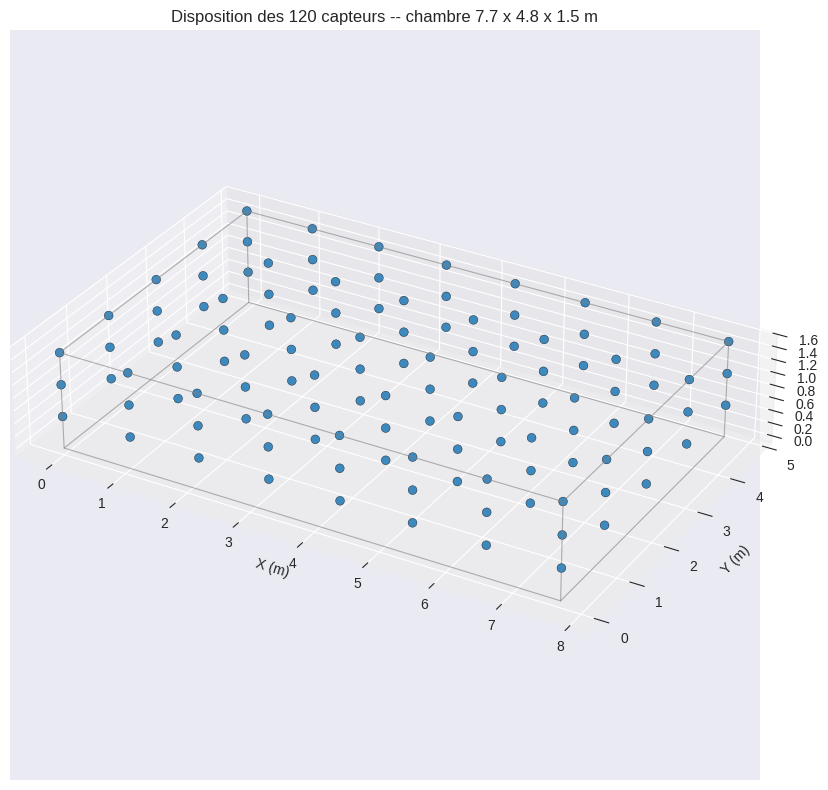

In [16]:
# --- Visualisation 3D de la disposition des 120 capteurs ---
X0, X1 = 0, LARGEUR_M
Y0, Y1 = 0, LONGUEUR_M
Z0, Z1 = 0, HAUTEUR_M
aretes_chambre = [
    ([X0, X1], [Y0, Y0], [Z0, Z0]), ([X0, X1], [Y1, Y1], [Z0, Z0]),
    ([X0, X0], [Y0, Y1], [Z0, Z0]), ([X1, X1], [Y0, Y1], [Z0, Z0]),
    ([X0, X1], [Y0, Y0], [Z1, Z1]), ([X0, X1], [Y1, Y1], [Z1, Z1]),
    ([X0, X0], [Y0, Y1], [Z1, Z1]), ([X1, X1], [Y0, Y1], [Z1, Z1]),
    ([X0, X0], [Y0, Y0], [Z0, Z1]), ([X1, X1], [Y0, Y0], [Z0, Z1]),
    ([X0, X0], [Y1, Y1], [Z0, Z1]), ([X1, X1], [Y1, Y1], [Z0, Z1]),
]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(positions_df['x_m'], positions_df['y_m'], positions_df['z_m'],
           c='tab:blue', s=40, alpha=0.85, edgecolor='k', linewidth=0.3)
for xs, ys, zs in aretes_chambre:
    ax.plot(xs, ys, zs, color='gray', linewidth=0.8, alpha=0.6)
ax.set_xlabel('X (m)'); ax.set_ylabel('Y (m)'); ax.set_zlabel('Z (m)')
ax.set_title(f'Disposition des {N_CAPTEURS} capteurs -- chambre '
             f'{LARGEUR_M:.1f} x {LONGUEUR_M:.1f} x {HAUTEUR_M:.1f} m')
ax.set_box_aspect((LARGEUR_M, LONGUEUR_M, HAUTEUR_M))
plt.tight_layout()
plt.show()

In [17]:
# --- Zones a faible densite de capteurs (distance au plus proche voisin) ---
coords_all_m = positions_df[['x_m', 'y_m', 'z_m']].values
arbre_tous_capteurs = cKDTree(coords_all_m)
d_nn, _ = arbre_tous_capteurs.query(coords_all_m, k=2)  # k=1 = lui-meme (distance 0)
positions_df['dist_voisin_le_plus_proche'] = d_nn[:, 1]

print('Distance au voisin le plus proche -- statistiques (m) :')
print(positions_df['dist_voisin_le_plus_proche'].describe().round(3))

seuil_isolement = positions_df['dist_voisin_le_plus_proche'].quantile(0.9)
zones_faible_densite = positions_df[positions_df['dist_voisin_le_plus_proche'] >= seuil_isolement]
print(f'\n{len(zones_faible_densite)} capteurs les plus isoles '
      f'(distance au voisin >= {seuil_isolement:.2f} m, 90e percentile) :')
print(zones_faible_densite[['capteur', 'x', 'y', 'z', 'dist_voisin_le_plus_proche']]
      .sort_values('dist_voisin_le_plus_proche', ascending=False).to_string(index=False))
print('\n-> Ce sont typiquement les capteurs de coin / bord de la grille : moins de voisins')
print('   proches disponibles pour l\'interpolation spatiale (IDW, GPR, plus proches voisins).')

Distance au voisin le plus proche -- statistiques (m) :
count    120.0
mean       0.5
std        0.0
min        0.5
25%        0.5
50%        0.5
75%        0.5
max        0.5
Name: dist_voisin_le_plus_proche, dtype: float64

120 capteurs les plus isoles (distance au voisin >= 0.50 m, 90e percentile) :
 capteur  x  y  z  dist_voisin_le_plus_proche
       1  0  0  0                         0.5
       2  0  0  1                         0.5
       3  0  0  2                         0.5
       4  1  0  0                         0.5
       5  1  0  1                         0.5
       6  1  0  2                         0.5
       7  2  0  0                         0.5
       8  2  0  1                         0.5
       9  2  0  2                         0.5
      10  3  0  0                         0.5
      11  3  0  1                         0.5
      12  3  0  2                         0.5
      13  4  0  0                         0.5
      14  4  0  1                         0.5
      

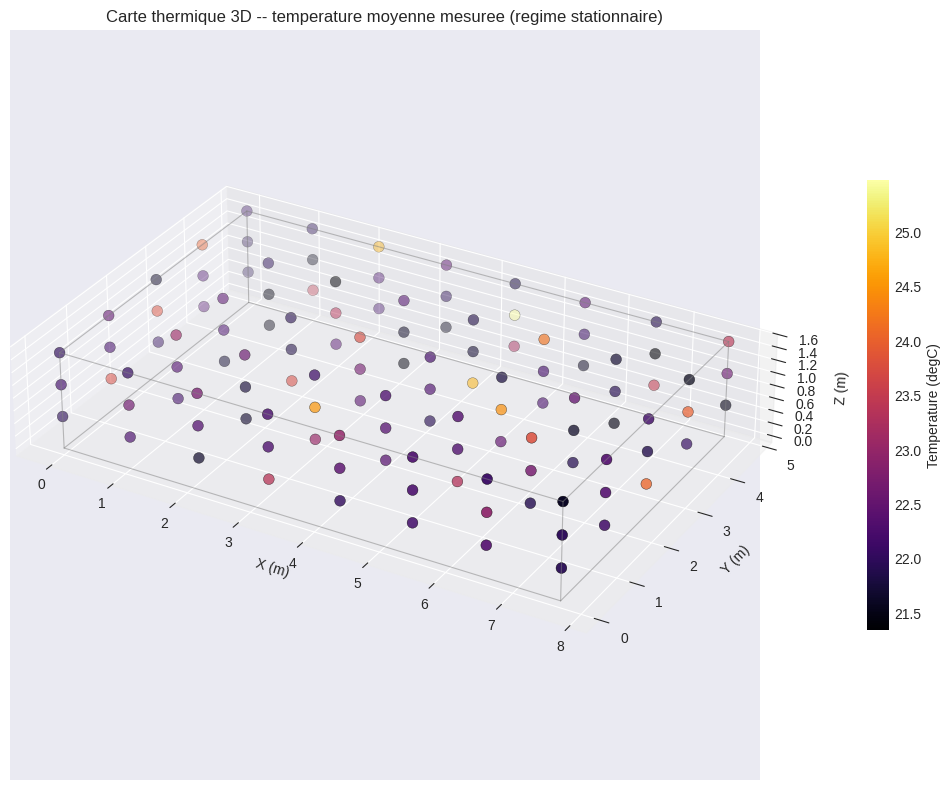

count    120.00
mean      22.41
std        0.82
min       21.35
25%       21.90
50%       22.19
75%       22.56
max       25.48
Name: temp_moyenne, dtype: float64


In [18]:
# --- Carte thermique 3D (temperature moyenne mesuree, regime stationnaire) ---
if 'df_fusion' in globals() and 'phase' in df_fusion.columns and (df_fusion['phase'] == 'stationnaire').any():
    temp_moy_capteur = (df_fusion[df_fusion['phase'] == 'stationnaire']
                         .groupby(['x', 'y', 'z'])['temperature'].mean()
                         .rename('temp_moyenne').reset_index())
    carte_df = positions_df.merge(temp_moy_capteur, on=['x', 'y', 'z'], how='left')

    fig = plt.figure(figsize=(11, 8))
    ax = fig.add_subplot(111, projection='3d')
    sc = ax.scatter(carte_df['x_m'], carte_df['y_m'], carte_df['z_m'],
                     c=carte_df['temp_moyenne'], cmap='inferno', s=60,
                     edgecolor='k', linewidth=0.3)
    for xs, ys, zs in aretes_chambre:
        ax.plot(xs, ys, zs, color='gray', linewidth=0.8, alpha=0.5)
    ax.set_xlabel('X (m)'); ax.set_ylabel('Y (m)'); ax.set_zlabel('Z (m)')
    ax.set_title('Carte thermique 3D -- temperature moyenne mesuree (regime stationnaire)')
    ax.set_box_aspect((LARGEUR_M, LONGUEUR_M, HAUTEUR_M))
    cbar = fig.colorbar(sc, ax=ax, shrink=0.6, pad=0.1)
    cbar.set_label('Temperature (degC)')
    plt.tight_layout()
    plt.show()

    print(carte_df['temp_moyenne'].describe().round(2))
else:
    print('Pas de temperatures stationnaires disponibles pour la carte thermique -> section ignoree.')

### Variables spatiales exploitables pour l'apprentissage

- **Coordonnées brutes** `x, y, z` (indices) ou `x_m, y_m, z_m` (mètres) : position absolue dans la grille.
- **Distances aux parois** `dist_edge_x, dist_edge_y, dist_edge_z` : proximité d'une surface (effets de bord thermique — pertes par les murs/fenêtres).
- **Distance au centre** `dist_center` : capture un éventuel gradient radial (ex. autour d'un point chaud central).
- **Voisins les plus proches** `dist_voisin_proche`, `temp_voisins_idw` : interpolation locale pondérée par distance inverse (IDW) — déjà intégrée aux features du modèle stationnaire.
- **Distance aux sources CVC** `dist_froid`, `dist_chaud`, `influence_froid`, `influence_chaud` : effet direct du chauffage/climatisation identifié sur le plan.
- **Autres variables spatiales pertinentes possibles** :
  - hauteur relative normalisée `z_m / HAUTEUR_M` (stratification thermique, souvent non linéaire avec l'altitude) ;
  - densité locale de capteurs (nombre de voisins dans un rayon donné) — utile pour pondérer la confiance du modèle ;
  - proximité aux fenêtres / portes si leurs positions sont connues (pertes thermiques additionnelles) ;
  - indices de symétrie par rapport aux axes de la pièce, si la géométrie du chauffage est symétrique.

Ces variables (déjà injectées dans `FEATURES_GEOMETRIE_CVC` et les features de voisins) sont
celles utilisées ci-dessous pour entraîner et comparer les modèles **ExtraTrees** et
**Gaussian Process** du régime stationnaire.

## 11ter — Chemin de mesure et observations du dataset (2D)

Avant d'aller plus loin : à quoi ressemble réellement le protocole de mesure ? Le CSV brut
donne, pour chaque `t_sec`, une valeur pour les 120 capteurs — mais si la mesure vient d'un
**robot qui se déplace** (pas d'une grille de 120 thermocouples fixes lus simultanément), il
faut vérifier si ces 120 valeurs par ligne sont vraiment des mesures indépendantes au même
instant, ou si certaines sont déjà interpolées/répétées en amont. Cette section affiche les
statistiques du dataset et deux types de "chemin" : la direction ALLER/RETOUR réelle au fil
du temps, et la couverture spatiale des trajectoires simulées de la section 8.

=== Observations dataset (mesure principale) ===
Fichier source : 896 lignes (timestamps) x 120 capteurs
Duree totale : 17920s (~298.7 min)
Intervalle entre mesures : median=20.0s, min=20.0s, max=40.0s
Valeurs manquantes : 0 sur 107520 (0.00%)
-> Aucune valeur manquante : les 120 capteurs ont une lecture a CHAQUE timestamp.
   Si la mesure vient d'un robot mobile a 1 (ou quelques) capteur(s) qui parcourt
   la piece -- pas d'une grille de thermocouples fixes lus simultanement -- cette
   densite totale suggere que le CSV source a deja ete interpole/reechantillonne
   en amont (hors de ce notebook). A VERIFIER aupres du protocole de mesure : ca
   change la validite de toute interpolation spatiale supposee 'instantanee'.

Positions couvertes (mesure reelle) : 40 sur 40 cellules (x,y)
Changements de direction ALLER/RETOUR : 0


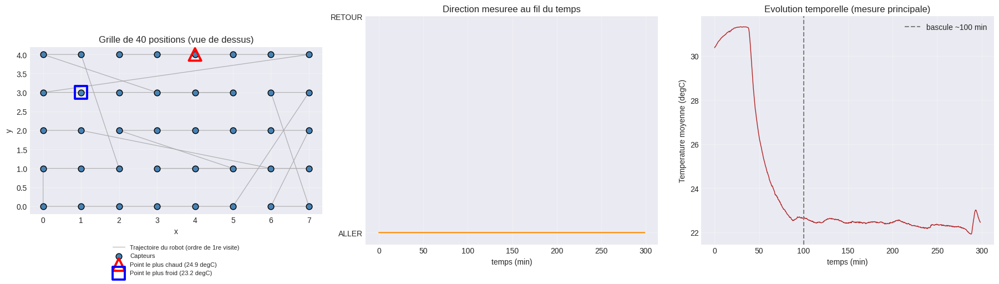

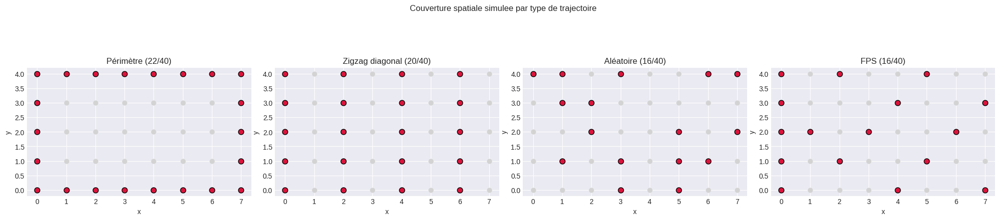

In [19]:
print("=== Observations dataset (mesure principale) ===")
print(f"Fichier source : {len(df)} lignes (timestamps) x {len(temp_cols)} capteurs")
print(f"Duree totale : {df['t_sec'].max():.0f}s (~{df['t_sec'].max()/60:.1f} min)")

dt_series = df['t_sec'].diff().dropna()
print(f"Intervalle entre mesures : median={dt_series.median():.1f}s, "
      f"min={dt_series.min():.1f}s, max={dt_series.max():.1f}s")

nan_par_capteur = df[temp_cols].isna().sum()
n_total = df[temp_cols].size
print(f"Valeurs manquantes : {nan_par_capteur.sum()} sur {n_total} "
      f"({nan_par_capteur.sum() / n_total * 100:.2f}%)")
if nan_par_capteur.sum() == 0:
    print("-> Aucune valeur manquante : les 120 capteurs ont une lecture a CHAQUE timestamp.")
    print("   Si la mesure vient d'un robot mobile a 1 (ou quelques) capteur(s) qui parcourt")
    print("   la piece -- pas d'une grille de thermocouples fixes lus simultanement -- cette")
    print("   densite totale suggere que le CSV source a deja ete interpole/reechantillonne")
    print("   en amont (hors de ce notebook). A VERIFIER aupres du protocole de mesure : ca")
    print("   change la validite de toute interpolation spatiale supposee 'instantanee'.")
else:
    print("-> Valeurs manquantes presentes : coherent avec un capteur qui ne mesure pas")
    print("   toutes les positions a chaque instant (deplacement sequentiel).")

n_changements_dir = int(df['direction_encode'].diff().abs().sum())
print(f"\nPositions couvertes (mesure reelle) : {len(positions_uniques)} sur "
      f"{LARGEUR * LONGUEUR} cellules (x,y)")
print(f"Changements de direction ALLER/RETOUR : {n_changements_dir}")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1) Grille des positions capteurs (vue de dessus, x, y)
ax = axes[0]
xs_pos = [p[0] for p in positions_uniques]
ys_pos = [p[1] for p in positions_uniques]

# --- Trajectoire du robot : ordre de 1ere visite de chaque position (x,y), au fil du
#     temps mesure -- approxime le chemin reellement parcouru dans la piece. ---
ordre_positions = (df_long.sort_values('t_sec')
                    .drop_duplicates(subset=['x', 'y'], keep='first')[['x', 'y']])
ax.plot(ordre_positions['x'], ordre_positions['y'], color='gray', lw=0.9, alpha=0.55,
        zorder=1, label='Trajectoire du robot (ordre de 1re visite)')

ax.scatter(xs_pos, ys_pos, c='steelblue', s=60, edgecolor='k', zorder=2, label='Capteurs')

# --- Point le plus chaud (triangle rouge) / le plus froid (carre bleu), moyenne sur
#     tout le trajet aller/retour du robot (toutes altitudes, tout le temps mesure) ---
temp_moy_xy = df_long.groupby(['x', 'y'])['temperature'].mean()
pos_chaude = temp_moy_xy.idxmax()
pos_froide = temp_moy_xy.idxmin()
ax.scatter(pos_chaude[0], pos_chaude[1], marker='^', s=260, facecolors='none',
           edgecolors='red', linewidths=2.8, zorder=5,
           label=f'Point le plus chaud ({temp_moy_xy.max():.1f} degC)')
ax.scatter(pos_froide[0], pos_froide[1], marker='s', s=260, facecolors='none',
           edgecolors='blue', linewidths=2.8, zorder=5,
           label=f'Point le plus froid ({temp_moy_xy.min():.1f} degC)')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fontsize=8, ncol=1)

ax.set_title(f"Grille de {len(positions_uniques)} positions (vue de dessus)")
ax.set_xlabel('x'); ax.set_ylabel('y'); ax.set_aspect('equal'); ax.grid(alpha=0.3)

# 2) Direction (ALLER/RETOUR) au fil du temps -- proxy du "chemin" reel mesure
ax = axes[1]
ax.step(df['t_sec'] / 60, df['direction_encode'], where='post', color='darkorange')
ax.set_yticks([0, 1]); ax.set_yticklabels(['ALLER', 'RETOUR'])
ax.set_xlabel('temps (min)'); ax.set_title('Direction mesuree au fil du temps')
ax.grid(alpha=0.3)

# 3) Temperature moyenne au fil du temps, avec bascule stationnaire/instationnaire
ax = axes[2]
ax.plot(df['t_sec'] / 60, df['temperature_mean'], color='firebrick', lw=1)
if t_bascule is not None:
    ax.axvline(t_bascule, color='gray', ls='--', label=f'bascule ~{t_bascule:.0f} min')
    ax.legend()
ax.set_xlabel('temps (min)'); ax.set_ylabel('Temperature moyenne (degC)')
ax.set_title('Evolution temporelle (mesure principale)')
ax.grid(alpha=0.3)

plt.tight_layout(); plt.show()

# 4) Couverture spatiale des trajectoires simulees (section 8)
fig, axes = plt.subplots(1, len(trajectoires_subset), figsize=(5 * len(trajectoires_subset), 5))
if len(trajectoires_subset) == 1:
    axes = [axes]
for ax, (nom, subset) in zip(axes, trajectoires_subset.items()):
    ax.scatter(xs_pos, ys_pos, c='lightgray', s=40, label='non couvert')
    xs_s = [p[0] for p in subset]; ys_s = [p[1] for p in subset]
    ax.scatter(xs_s, ys_s, c='crimson', s=60, edgecolor='k', label='couvert')
    ax.set_title(f"{nom} ({len(subset)}/{len(positions_uniques)})")
    ax.set_aspect('equal'); ax.set_xlabel('x'); ax.set_ylabel('y')
plt.suptitle('Couverture spatiale simulee par type de trajectoire')
plt.tight_layout(); plt.show()


## 12 — Comparatif ExtraTrees / Gaussian Process — régime STATIONNAIRE (interprétation spatiale)

Régime où la température ne dérive plus dans le temps : **`t_sec` n'est pas une feature**.
Chaque modèle doit **déduire la température des points non mesurés à partir des points mesurés**
(pas de fuite : on retire de l'entraînement un sous-ensemble entier de **positions**,
jamais de simples lignes, sinon le modèle « trouverait » ses réponses en train).

On entraîne **ExtraTrees** (features géométrie + CVC + voisins IDW + trajectoire/chauffage one-hot)
et un **Gaussian Process spatial** (coordonnées réelles x, y, z, par `heating_type`) sur le même
split spatial, puis on compare.

In [20]:
def obtenir_modeles_standard(random_state=42, rapide=False):
    """Dictionnaire {nom: instance de modele fraiche} pour le comparatif ExtraTrees / GaussianProcess.
    rapide=True -> hyperparametres allege (utilise pour le test de stabilite multi-seeds).
    Le Gaussian Process spatial est gere a part (voir entrainer_gpr_spatial ci-dessous),
    car il a besoin de positions agregees par heating_type plutot que de la matrice X classique."""
    n_est = 150 if rapide else 300
    modeles = {
        'ExtraTrees': ExtraTreesRegressor(
            n_estimators=n_est, max_depth=20, min_samples_leaf=2,
            random_state=random_state, n_jobs=-1),
    }
    return modeles


# Noyau du Gaussian Process spatial (position x, y, z reelles -> temperature),
# entraine separement par heating_type (le champ thermique depend fortement du
# chauffage actif). Un GPR ne passe pas a l'echelle sur des centaines de milliers
# de lignes brutes -> on l'entraine sur les positions AGREGEES (moyenne par
# position x chauffage), ce qui correspond exactement a la tache d'interpolation
# spatiale d'un champ lisse.
kernel_gpr = (ConstantKernel(1.0, (1e-2, 1e3)) *
              RBF(length_scale=[1.0, 1.0, 0.5], length_scale_bounds=(1e-2, 1e2)) +
              WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-3, 1e2)))


def entrainer_gpr_spatial(df_train_pos, df_test_pos, y_train_fallback, random_state=42,
                           n_restarts=3, retourner_std=False):
    """Entraine un GPR par heating_type sur les positions d'entrainement agregees
    (x, y, z reels en metres), puis predit sur df_test_pos (colonnes x, y, z,
    heating_type). Repli sur la moyenne d'entrainement si un chauffage test est
    absent du train. Si retourner_std=True, renvoie aussi l'ecart-type predictif
    (incertitude), caracteristique propre au Gaussian Process."""
    modeles_gpr = {}
    for chauff, g in df_train_pos.groupby('heating_type'):
        coords_g = np.column_stack([
            g['x'].values * ESPACEMENT_X, g['y'].values * ESPACEMENT_Y,
            np.array(ALTITUDES_Z)[g['z'].values.astype(int)],
        ])
        gpr = GaussianProcessRegressor(kernel=kernel_gpr, normalize_y=True,
                                        n_restarts_optimizer=n_restarts,
                                        random_state=random_state)
        gpr.fit(coords_g, g['temperature'].values)
        modeles_gpr[chauff] = gpr

    preds = np.full(len(df_test_pos), np.nan)
    stds = np.full(len(df_test_pos), np.nan)
    for chauff, gpr in modeles_gpr.items():
        m = (df_test_pos['heating_type'] == chauff).values
        if m.sum() == 0:
            continue
        coords_m = np.column_stack([
            df_test_pos.loc[m, 'x'].values * ESPACEMENT_X,
            df_test_pos.loc[m, 'y'].values * ESPACEMENT_Y,
            np.array(ALTITUDES_Z)[df_test_pos.loc[m, 'z'].values.astype(int)],
        ])
        if retourner_std:
            p_m, s_m = gpr.predict(coords_m, return_std=True)
            preds[m] = p_m
            stds[m] = s_m
        else:
            preds[m] = gpr.predict(coords_m)
    preds[np.isnan(preds)] = y_train_fallback.mean()
    if retourner_std:
        stds[np.isnan(stds)] = 0.0
        return preds, modeles_gpr, stds
    return preds, modeles_gpr


def calculer_metriques(y_true, y_pred):
    return dict(
        rmse=np.sqrt(mean_squared_error(y_true, y_pred)),
        mae=mean_absolute_error(y_true, y_pred),
        mape=mean_absolute_percentage_error(y_true, y_pred) * 100,
        r2=r2_score(y_true, y_pred))


def tableau_comparatif(metriques_par_modele):
    """dict {nom_modele: metrics_dict} -> DataFrame trie par R2 decroissant."""
    lignes = [{'Modele': nom, 'RMSE (°C)': m['rmse'], 'MAE (°C)': m['mae'],
               'MAPE (%)': m['mape'], 'R2': m['r2']} for nom, m in metriques_par_modele.items()]
    return pd.DataFrame(lignes).set_index('Modele').sort_values('R2', ascending=False)


def barres_comparatif(df_comp, titre):
    """Barres horizontales RMSE / MAE / MAPE / R2, un panneau par metrique,
    modeles tries par performance (meilleur en haut)."""
    df_plot = df_comp.sort_values('R2', ascending=True)
    fig, axes = plt.subplots(1, 4, figsize=(22, 0.55 * len(df_plot) + 2))
    couleurs = plt.cm.viridis(np.linspace(0.15, 0.9, len(df_plot)))
    for ax, col in zip(axes, ['RMSE (°C)', 'MAE (°C)', 'MAPE (%)', 'R2']):
        ax.barh(df_plot.index, df_plot[col], color=couleurs)
        ax.set_title(col); ax.grid(True, alpha=0.3, axis='x')
    plt.suptitle(titre, fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()

print('Fonctions du comparatif ExtraTrees / GaussianProcess pretes.')


Fonctions du comparatif ExtraTrees / GaussianProcess pretes.


In [21]:
import time

df_stat = df_fusion[df_fusion['phase'] == 'stationnaire'].reset_index(drop=True)
print(f'Lignes en regime stationnaire : {len(df_stat):,}')

if len(df_stat) < 50:
    print("Pas assez de donnees stationnaires pour entrainer un modele -> section ignoree.")
else:
    t0 = time.time()
    positions_stat = df_stat[['x', 'y', 'z']].drop_duplicates().values
    rng = np.random.RandomState(42)
    idx_perm = rng.permutation(len(positions_stat))
    n_test_pos = max(1, int(0.2 * len(positions_stat)))
    positions_test_df = pd.DataFrame(positions_stat[idx_perm[:n_test_pos]], columns=['x', 'y', 'z'])
    positions_test_df['_is_test'] = True

    # masque VECTORISE via merge au lieu de apply ligne par ligne
    mask_test_stat = df_stat.merge(positions_test_df, on=['x', 'y', 'z'], how='left')['_is_test'].fillna(False).values
    mask_train_stat = ~mask_test_stat
    print(f'  masque test/train calcule en {time.time()-t0:.1f}s')

    print(f'{n_test_pos} positions tenues a l\'ecart de l\'entrainement '
          f'({mask_test_stat.sum():,} lignes test / {mask_train_stat.sum():,} lignes train)')

    K_VOISINS = 4
    temp_moy_train_pos = (df_stat[mask_train_stat]
                           .groupby(['x', 'y', 'z'])['temperature'].mean())
    pos_train_idx = temp_moy_train_pos.index.to_frame(index=False)
    coords_train_m = np.column_stack([
        pos_train_idx['x'].values * ESPACEMENT_X,
        pos_train_idx['y'].values * ESPACEMENT_Y,
        np.array(ALTITUDES_Z)[pos_train_idx['z'].values.astype(int)],
    ])
    temps_train_pos = temp_moy_train_pos.values
    arbre_voisins = cKDTree(coords_train_m)

    def features_voisins(df_pts, k=K_VOISINS, epsilon=1e-6):
        coords_m = np.column_stack([
            df_pts['x'].values * ESPACEMENT_X,
            df_pts['y'].values * ESPACEMENT_Y,
            np.array(ALTITUDES_Z)[df_pts['z'].values.astype(int)],
        ])
        k_eff = min(k, len(coords_train_m))
        dists, idxs = arbre_voisins.query(coords_m, k=k_eff)
        if k_eff == 1:
            dists = dists[:, None]; idxs = idxs[:, None]
        poids = 1.0 / (dists + epsilon)
        temp_idw = (poids * temps_train_pos[idxs]).sum(axis=1) / poids.sum(axis=1)
        dist_plus_proche = dists[:, 0]
        return temp_idw, dist_plus_proche

    df_stat['temp_voisins_idw'], df_stat['dist_voisin_proche'] = features_voisins(df_stat)

    FEATURES_STATIONNAIRE = FEATURES_GEOMETRIE_CVC + FEATURES_CATEGORIELLES + \
        ['temp_voisins_idw', 'dist_voisin_proche']

    X_stat = df_stat[FEATURES_STATIONNAIRE].values.astype(float)
    y_stat = df_stat['temperature'].values.astype(float)

    scaler_stat = StandardScaler()
    X_stat_scaled = scaler_stat.fit_transform(X_stat)

    Xtr_stat, Xte_stat = X_stat_scaled[mask_train_stat], X_stat_scaled[mask_test_stat]
    ytr_stat, yte_stat = y_stat[mask_train_stat], y_stat[mask_test_stat]
    print(f'  Xtr_stat: {Xtr_stat.shape}')

    # ---- Entrainement de TOUS les modeles standards ----
    predictions_stat = {}
    metriques_stat_tous = {}
    for nom, modele in obtenir_modeles_standard(random_state=42).items():
        t_m = time.time()
        modele.fit(Xtr_stat, ytr_stat)
        pred = modele.predict(Xte_stat)
        predictions_stat[nom] = pred
        metriques_stat_tous[nom] = calculer_metriques(yte_stat, pred)
        print(f'  {nom:20s} entraine en {time.time()-t_m:5.1f}s -- R2={metriques_stat_tous[nom]["r2"]:.4f}')

    # ---- Gaussian Process spatial (position x, y, z x heating_type) ----
    t_gpr = time.time()
    df_stat_pos_agg = (df_stat[mask_train_stat]
                        .groupby(['x', 'y', 'z', 'heating_type'])['temperature']
                        .mean().reset_index())
    df_stat_test_pos = df_stat.loc[mask_test_stat, ['x', 'y', 'z', 'heating_type']]
    pred_gpr, modeles_gpr_stat = entrainer_gpr_spatial(
        df_stat_pos_agg, df_stat_test_pos, ytr_stat, random_state=42, n_restarts=3)
    predictions_stat['GaussianProcess (spatial)'] = pred_gpr
    metriques_stat_tous['GaussianProcess (spatial)'] = calculer_metriques(yte_stat, pred_gpr)
    print(f'  {"GaussianProcess (spatial)":20s} entraine en {time.time()-t_gpr:5.1f}s -- '
          f'R2={metriques_stat_tous["GaussianProcess (spatial)"]["r2"]:.4f}')

    comparaison_stat = tableau_comparatif(metriques_stat_tous)
    print()
    print('Comparaison des modeles STATIONNAIRE (interpolation spatiale) :')
    display(comparaison_stat.round(4))

    NOM_MODELE_STATIONNAIRE = comparaison_stat.index[0]
    pred_stat = predictions_stat[NOM_MODELE_STATIONNAIRE]
    metrics_stat = metriques_stat_tous[NOM_MODELE_STATIONNAIRE]

    print(f'\n>>> Modele retenu pour la carte thermique : {NOM_MODELE_STATIONNAIRE}')
    print(f"Modele STATIONNAIRE - RMSE={metrics_stat['rmse']:.4f}C  "
          f"MAE={metrics_stat['mae']:.4f}C  MAPE={metrics_stat['mape']:.2f}%  R2={metrics_stat['r2']:.4f}")

    df_stat_test = df_stat.loc[mask_test_stat, ['x', 'y', 'z', 'trajectory_type', 'heating_type']].copy()
    df_stat_test['reel'] = yte_stat
    df_stat_test['predit'] = pred_stat
    df_stat_test['erreur_abs'] = np.abs(df_stat_test['reel'] - df_stat_test['predit'])

Lignes en regime stationnaire : 204,174
  masque test/train calcule en 0.1s
24 positions tenues a l'ecart de l'entrainement (38,208 lignes test / 165,966 lignes train)
  Xtr_stat: (165966, 22)
  ExtraTrees           entraine en  90.7s -- R2=-0.4183
  GaussianProcess (spatial) entraine en   1.7s -- R2=-0.0990

Comparaison des modeles STATIONNAIRE (interpolation spatiale) :


,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
GaussianProcess (spatial),1.1227,0.7149,3.0127,-0.0990
ExtraTrees,1.2754,0.9304,3.9727,-0.4183



>>> Modele retenu pour la carte thermique : GaussianProcess (spatial)
Modele STATIONNAIRE - RMSE=1.1227C  MAE=0.7149C  MAPE=3.01%  R2=-0.0990


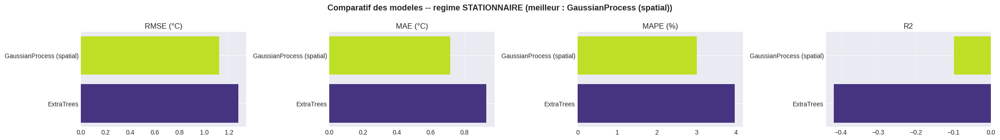

In [22]:
if len(df_stat) >= 50:
    barres_comparatif(comparaison_stat,
        f'Comparatif des modeles -- regime STATIONNAIRE (meilleur : {NOM_MODELE_STATIONNAIRE})')
else:
    print('Pas assez de donnees pour le comparatif stationnaire.')

### 12bis — Non-stationnarisation artificielle du régime stationnaire (ajout d'une tendance)

**Hypothèse à tester :** le modèle est-il meilleur en régime instationnaire *parce que le signal est
non stationnaire*, ou pour d'autres raisons (gradient thermique, densité spatiale, information de
voisinage, capacité du modèle) ?

Parmi les 3 méthodes candidates pour transformer artificiellement une série stationnaire en série
non stationnaire — intégration cumulative `Y(t) = Σ X(i)`, ajout d'une tendance `Y(t) = X(t) + a·t`,
ajout d'une composante périodique `Y(t) = X(t) + A·sin(ωt)` — on retient ici **l'ajout d'une tendance
linéaire**, la plus proche d'un phénomène thermique réel (dérive lente d'un chauffage/climatisation
qui n'a pas encore atteint son régime permanent), donc la plus interprétable physiquement. `t_sec`
existe déjà pour les lignes stationnaires (juste postérieur à `t_bascule`) : on l'utilise tel quel,
recentré à 0, au lieu d'inventer un temps synthétique.

On réentraîne **ExtraTrees et le Gaussian Process** (celui-ci reçoit `t_rel` comme 4e dimension
d'entrée, en plus de x, y, z) sur `temperature_tendance = temperature + a · t_rel`, avec le **même
split spatial** que la section 12, et on compare le R² obtenu à celui du régime stationnaire brut
(section 12) et à celui du régime instationnaire réel (section 13). Si le R² « stationnaire + tendance »
rejoint celui de l'instationnaire, cela confirme que l'écart vient bien de la disponibilité d'une
variable temporelle informative — pas d'une propriété magique de la « non-stationnarité » en soi.

In [23]:
if len(df_stat) < 50:
    print("Pas assez de donnees stationnaires -> experience de non-stationnarisation ignoree.")
elif df_stat['t_sec'].notna().sum() < 50:
    print("Pas assez de lignes stationnaires avec un t_sec reel (mesure) "
          "-> experience de non-stationnarisation ignoree.")
else:
    # Certaines lignes stationnaires proviennent de trajectoires simulees / CSV additionnels
    # (section 8) sans timestamp reel -> t_sec est NaN pour ces lignes. On les exclut de
    # cette experience : ajouter une tendance temporelle n'a de sens que sur des points ou
    # le temps est reellement mesure.
    n_avant = len(df_stat)
    df_tend = df_stat.dropna(subset=['t_sec']).copy()
    n_apres = len(df_tend)
    if n_avant != n_apres:
        print(f"{n_avant - n_apres} lignes sans t_sec reel exclues "
              f"({n_apres} lignes conservees sur {n_avant}).")

    df_tend['t_rel'] = df_tend['t_sec'] - df_tend['t_sec'].min()
    duree_s = df_tend['t_rel'].max()

    # Amplitude de la tendance choisie par rapport a la donnee plutot qu'en dur :
    # on vise une derive totale modeste (~30% de l'ecart-type des temperatures),
    # pour rester une perturbation raisonnable et non un artefact numerique.
    DERIVE_CIBLE = 0.30 * df_tend['temperature'].std()
    A_TENDANCE = DERIVE_CIBLE / duree_s if duree_s > 0 else 0.0
    df_tend['temperature_tendance'] = df_tend['temperature'] + A_TENDANCE * df_tend['t_rel']

    print(f"Tendance ajoutee : a={A_TENDANCE:.5f} degC/s (calcule pour une derive cible de "
          f"{DERIVE_CIBLE:.2f} degC), duree stationnaire ~{duree_s:.0f}s -> "
          f"derive max ~{A_TENDANCE * duree_s:.2f} degC")

    # Sous-ensembles dedies (ne pas ecraser mask_train_stat/mask_test_stat, utilises ailleurs)
    mask_notna_t = df_stat['t_sec'].notna().values
    mask_train_tend = mask_train_stat[mask_notna_t] if n_avant != n_apres else mask_train_stat
    mask_test_tend = mask_test_stat[mask_notna_t] if n_avant != n_apres else mask_test_stat

    FEATURES_TENDANCE = FEATURES_STATIONNAIRE + ['t_rel']
    X_tend = df_tend[FEATURES_TENDANCE].values.astype(float)
    y_tend = df_tend['temperature_tendance'].values.astype(float)

    scaler_tend = StandardScaler()
    X_tend_scaled = scaler_tend.fit_transform(X_tend)

    # Meme split spatial (positions) que la section 12, pour une comparaison equitable
    Xtr_tend, Xte_tend = X_tend_scaled[mask_train_tend], X_tend_scaled[mask_test_tend]
    ytr_tend, yte_tend = y_tend[mask_train_tend], y_tend[mask_test_tend]

    predictions_tend = {}
    metriques_tend_tous = {}

    for nom, modele in obtenir_modeles_standard(random_state=42).items():
        modele.fit(Xtr_tend, ytr_tend)
        pred = modele.predict(Xte_tend)
        predictions_tend[nom] = pred
        metriques_tend_tous[nom] = calculer_metriques(yte_tend, pred)
        print(f"  {nom:20s} (stationnaire+tendance) -- R2={metriques_tend_tous[nom]['r2']:.4f}")

    # --- Gaussian Process spatio-temporel : x, y, z, t_rel -> temperature_tendance ---
    # IMPORTANT : t_rel est quasi-continu (un timestamp different par mesure). Grouper
    # par (x, y, z, heating_type, t_rel) tel quel n'agregerait presque rien : chaque
    # groupe resterait ~unique -> le GPR (cout O(n^3)) se retrouverait a s'entrainer sur
    # des milliers de points et deviendrait tres lent, voire bloquerait le notebook.
    # On discretise donc le temps en N_BINS_T intervalles avant d'agreger, ce qui borne
    # le nombre de points d'entrainement quelle que soit la taille brute des donnees,
    # tout en conservant assez de resolution temporelle pour capter la tendance ajoutee.
    N_BINS_T = min(30, df_tend['t_rel'].nunique())
    N_MAX_PAR_CHAUFFAGE = 800  # garde-fou : sous-echantillonnage si un groupe reste trop gros

    kernel_gpr_t = (ConstantKernel(1.0, (1e-2, 1e3)) *
                     RBF(length_scale=[1.0, 1.0, 0.5, 60.0], length_scale_bounds=(1e-2, 1e4)) +
                     WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-3, 1e2)))

    df_train_pos_t = df_tend[mask_train_tend].copy()
    df_train_pos_t['t_bin'] = pd.cut(df_train_pos_t['t_rel'], bins=N_BINS_T, labels=False)

    agg_t = (df_train_pos_t.groupby(['x', 'y', 'z', 'heating_type', 't_bin'], observed=True)
             .agg(temperature_tendance=('temperature_tendance', 'mean'),
                  t_rel=('t_rel', 'mean'))
             .reset_index())
    print(f"GPR spatio-temporel : {len(df_train_pos_t):,} lignes brutes -> "
          f"{len(agg_t):,} points agreges (t discretise en {N_BINS_T} intervalles).")

    modeles_gpr_t = {}
    rng = np.random.default_rng(42)
    for chauff, g in agg_t.groupby('heating_type'):
        if len(g) > N_MAX_PAR_CHAUFFAGE:
            idx_sample = rng.choice(len(g), size=N_MAX_PAR_CHAUFFAGE, replace=False)
            g = g.iloc[idx_sample]
            print(f"  chauffage={chauff!r} : {len(g):,} points -> sous-echantillonne a "
                  f"{N_MAX_PAR_CHAUFFAGE} pour rester rapide.")
        coords_g = np.column_stack([
            g['x'].values * ESPACEMENT_X, g['y'].values * ESPACEMENT_Y,
            np.array(ALTITUDES_Z)[g['z'].values.astype(int)], g['t_rel'].values,
        ])
        gpr_t = GaussianProcessRegressor(kernel=kernel_gpr_t, normalize_y=True,
                                          n_restarts_optimizer=3, random_state=42)
        gpr_t.fit(coords_g, g['temperature_tendance'].values)
        modeles_gpr_t[chauff] = gpr_t

    df_test_pos_t = df_tend.loc[mask_test_tend, ['x', 'y', 'z', 'heating_type', 't_rel']]
    pred_gpr_t = np.full(len(df_test_pos_t), np.nan)
    for chauff, gpr_t in modeles_gpr_t.items():
        m = (df_test_pos_t['heating_type'] == chauff).values
        if m.sum() == 0:
            continue
        coords_m = np.column_stack([
            df_test_pos_t.loc[m, 'x'].values * ESPACEMENT_X,
            df_test_pos_t.loc[m, 'y'].values * ESPACEMENT_Y,
            np.array(ALTITUDES_Z)[df_test_pos_t.loc[m, 'z'].values.astype(int)],
            df_test_pos_t.loc[m, 't_rel'].values,
        ])
        pred_gpr_t[m] = gpr_t.predict(coords_m)
    pred_gpr_t[np.isnan(pred_gpr_t)] = ytr_tend.mean()

    predictions_tend['GaussianProcess (spatio-temporel)'] = pred_gpr_t
    metriques_tend_tous['GaussianProcess (spatio-temporel)'] = calculer_metriques(yte_tend, pred_gpr_t)
    print(f"  {'GaussianProcess (spatio-temporel)':20s} (stationnaire+tendance) -- "
          f"R2={metriques_tend_tous['GaussianProcess (spatio-temporel)']['r2']:.4f}")

    comparaison_tend = tableau_comparatif(metriques_tend_tous)
    print()
    print('Comparaison des modeles -- STATIONNAIRE + TENDANCE ARTIFICIELLE :')
    display(comparaison_tend.round(4))

    # Comparaison directe avec le stationnaire brut (section 12) et l'instationnaire (section 13)
    lignes_bilan = []
    if 'metriques_stat_tous' in globals():
        for nom, m in metriques_stat_tous.items():
            lignes_bilan.append({'Regime': 'Stationnaire (brut)', 'Modele': nom, 'R2': m['r2']})
    for nom, m in metriques_tend_tous.items():
        lignes_bilan.append({'Regime': 'Stationnaire + tendance', 'Modele': nom, 'R2': m['r2']})
    if 'metriques_inst_tous' in globals():
        for nom, m in metriques_inst_tous.items():
            lignes_bilan.append({'Regime': 'Instationnaire (reel)', 'Modele': nom, 'R2': m['r2']})

    if len(lignes_bilan) > 0:
        df_bilan = pd.DataFrame(lignes_bilan)
        print()
        print("Bilan -- effet de la variable temporelle sur le R2, par regime :")
        display(df_bilan.pivot_table(index='Modele', columns='Regime', values='R2'))
        print()
        print("Interpretation : si le R2 'Stationnaire + tendance' se rapproche du R2 'Instationnaire',")
        print("le gain de performance en regime instationnaire vient surtout de la disponibilite d'une")
        print("variable temporelle correlee a la cible -- pas d'une propriete intrinseque de la")
        print("non-stationnarite. Un ecart residuel avec 'Instationnaire (reel)' pointe plutot vers le")
        print("gradient thermique reel, la densite spatiale des mesures, ou l'information de voisinage.")


Tendance ajoutee : a=0.00002 degC/s (calcule pour une derive cible de 0.26 degC), duree stationnaire ~11920s -> derive max ~0.26 degC
  ExtraTrees           (stationnaire+tendance) -- R2=-0.4106
GPR spatio-temporel : 165,966 lignes brutes -> 2,880 points agreges (t discretise en 30 intervalles).
  chauffage='mesure_principale' : 800 points -> sous-echantillonne a 800 pour rester rapide.
  GaussianProcess (spatio-temporel) (stationnaire+tendance) -- R2=-0.1072

Comparaison des modeles -- STATIONNAIRE + TENDANCE ARTIFICIELLE :


,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
GaussianProcess (spatio-temporel),1.1226,0.6807,2.8380,-0.1072
ExtraTrees,1.2671,0.9138,3.8747,-0.4106



Bilan -- effet de la variable temporelle sur le R2, par regime :


Regime,Stationnaire (brut),Stationnaire + tendance
Modele,,
ExtraTrees,-0.418275,-0.410596
GaussianProcess (spatial),-0.099036,NaN
GaussianProcess (spatio-temporel),NaN,-0.107229



Interpretation : si le R2 'Stationnaire + tendance' se rapproche du R2 'Instationnaire',
le gain de performance en regime instationnaire vient surtout de la disponibilite d'une
variable temporelle correlee a la cible -- pas d'une propriete intrinseque de la
non-stationnarite. Un ecart residuel avec 'Instationnaire (reel)' pointe plutot vers le
gradient thermique reel, la densite spatiale des mesures, ou l'information de voisinage.


### 12bis-causal — IDW causal (uniquement des valeurs déjà mesurées, sans triche)

**Correction par rapport à la première idée d'IDW "instantané"** : si le capteur mesure en
parcourant la pièce (pas une grille lue simultanément), on ne peut jamais utiliser, pour
prédire une position à l'instant `t`, la valeur d'une position voisine mesurée **au même
instant** — elle n'existe pas encore en conditions réelles. La seule interpolation
déployable est **causale** : à `t`, on interpole uniquement à partir des **dernières valeurs
déjà mesurées avant `t`** pour les positions voisines (ici, un décalage d'un pas de temps —
`lag=1` — par groupe trajectoire × chauffage, trié par `t_sec`).

C'est un passage géométrique pur (aucun ML) : on évalue directement `R²`/`RMSE` de cette
interpolation contre la température réelle, pour voir si elle apporte, à elle seule, plus
d'information que les modèles entraînés dans les sections 12/13.

In [24]:
from scipy.spatial.distance import cdist

def idw_causal_groupe(df_groupe, k=4, epsilon=1e-6, lag=1):
    """Pour UN groupe (une combinaison trajectory_type x heating_type), trie par t_sec,
    puis calcule pour chaque position, a chaque instant, une interpolation IDW basee
    UNIQUEMENT sur les valeurs des k positions voisines les plus proches, telles
    qu'elles etaient connues 'lag' pas de temps plus tot -- jamais la valeur concurrente
    de la meme ligne. C'est la seule version compatible avec un capteur qui mesure
    sequentiellement : a l'instant t, on ne peut utiliser que ce qui a deja ete mesure
    avant t.
    """
    g = df_groupe.sort_values('t_sec')
    pivot = g.pivot_table(index='t_sec', columns=['x', 'y', 'z'], values='temperature')
    if pivot.shape[0] < lag + 2 or pivot.shape[1] < 2:
        return None
    pivot_lag = pivot.shift(lag)  # valeurs disponibles AVANT le timestamp courant

    positions_cols = list(pivot.columns)
    coords = np.array([[p[0] * ESPACEMENT_X, p[1] * ESPACEMENT_Y,
                         np.array(ALTITUDES_Z)[int(p[2])]] for p in positions_cols])
    dist_matrix = cdist(coords, coords)
    np.fill_diagonal(dist_matrix, np.inf)
    k_eff = min(k, len(positions_cols) - 1)
    k_idx = np.argsort(dist_matrix, axis=1)[:, :k_eff]
    poids = 1.0 / (np.take_along_axis(dist_matrix, k_idx, axis=1) + epsilon)

    valeurs_lag = pivot_lag.values  # (n_temps, n_positions)
    idw = np.full_like(valeurs_lag, np.nan, dtype=float)
    for j in range(len(positions_cols)):
        voisins_vals = valeurs_lag[:, k_idx[j]]
        w = np.tile(poids[j], (voisins_vals.shape[0], 1))
        valides = ~np.isnan(voisins_vals)
        num = np.nansum(np.where(valides, voisins_vals * w, 0.0), axis=1)
        denom = np.nansum(np.where(valides, w, 0.0), axis=1)
        idw[:, j] = np.where(denom > 0, num / denom, np.nan)

    idw_df = pd.DataFrame(idw, index=pivot.index, columns=pivot.columns)
    idw_long = idw_df.stack([0, 1, 2]).rename('idw_causal').reset_index()
    idw_long.columns = ['t_sec', 'x', 'y', 'z', 'idw_causal']
    return g.merge(idw_long, on=['t_sec', 'x', 'y', 'z'], how='left')


LAG_CAUSAL = 1  # nombre de pas de temps en arriere autorises (strictement causal)
# Remarque : le groupby ci-dessous reste (trajectory_type, heating_type) seulement,
# SANS direction_encode. Ce n'est pas un oubli : fragmenter aussi par direction
# reduirait fortement le nombre de voisins dispo par groupe pour l'IDW (deja peu
# de points par combinaison). L'aller/retour n'est donc pas utilise ici pour changer
# l'interpolation elle-meme -- c'est une donnee collectee (pas une prediction), qui
# est simplement transmise telle quelle au modele ExtraTrees sur le residu (section 17,
# via FEATURES_CATEGORIELLES) pour qu'il apprenne un eventuel biais aller/retour.
resultats_idw_causal = []
for (traj, chauff), g in df_fusion.groupby(['trajectory_type', 'heating_type']):
    if len(g) < 200:
        continue
    g_idw = idw_causal_groupe(g, k=4, lag=LAG_CAUSAL)
    if g_idw is not None:
        resultats_idw_causal.append(g_idw)

if len(resultats_idw_causal) == 0:
    print("Pas assez de donnees pour calculer l'IDW causal.")
else:
    df_idw_causal = pd.concat(resultats_idw_causal, ignore_index=True)
    n_dispo = df_idw_causal['idw_causal'].notna().sum()
    print(f"IDW causal (lag={LAG_CAUSAL}) calcule sur {len(df_idw_causal):,} lignes "
          f"({n_dispo:,} avec une valeur disponible, le premier pas de chaque groupe n'en a pas).")

    print()
    print("Comparaison -- IDW causal (aucun ML) vs modeles entraines (sections 12/13) :")
    for phase in ['stationnaire', 'instationnaire']:
        sous = df_idw_causal[(df_idw_causal['phase'] == phase) &
                              df_idw_causal['idw_causal'].notna()]
        if len(sous) < 20:
            print(f"  {phase:16s} -- pas assez de lignes evaluables.")
            continue
        r2_c = r2_score(sous['temperature'], sous['idw_causal'])
        rmse_c = np.sqrt(mean_squared_error(sous['temperature'], sous['idw_causal']))
        mae_c = mean_absolute_error(sous['temperature'], sous['idw_causal'])
        print(f"  {phase:16s} -- IDW causal : R2={r2_c:.4f}  RMSE={rmse_c:.3f} degC  "
              f"MAE={mae_c:.3f} degC  (n={len(sous):,})")

    print()
    print("Interpretation : si l'IDW causal (sans aucun ML) egale ou depasse le R2 des")
    print("modeles ExtraTrees/GaussianProcess entraines, c'est le signe que l'information")
    print("utile vient presque entierement de la structure spatiale locale -- le ML")
    print("n'apporte alors qu'un raffinement marginal. S'il reste tres en dessous, ca")
    print("indique que le signal spatio-temporel est trop faible/bruite pour qu'une simple")
    print("moyenne ponderee suffise, et qu'il faut des features supplementaires (distance")
    print("aux sources CVC, isolation locale...) plutot qu'un modele plus complexe.")


IDW causal (lag=1) calcule sur 306,432 lignes (306,090 avec une valeur disponible, le premier pas de chaque groupe n'en a pas).

Comparaison -- IDW causal (aucun ML) vs modeles entraines (sections 12/13) :
  stationnaire     -- IDW causal : R2=-0.5095  RMSE=1.054 degC  MAE=0.790 degC  (n=204,174)
  instationnaire   -- IDW causal : R2=0.9535  RMSE=0.795 degC  MAE=0.564 degC  (n=101,916)

Interpretation : si l'IDW causal (sans aucun ML) egale ou depasse le R2 des
modeles ExtraTrees/GaussianProcess entraines, c'est le signe que l'information
utile vient presque entierement de la structure spatiale locale -- le ML
n'apporte alors qu'un raffinement marginal. S'il reste tres en dessous, ca
indique que le signal spatio-temporel est trop faible/bruite pour qu'une simple
moyenne ponderee suffise, et qu'il faut des features supplementaires (distance
aux sources CVC, isolation locale...) plutot qu'un modele plus complexe.


### 12ter — Stabilité du split spatial (multi-seeds)

Le split précédent ne tient à l'écart que ~20% des positions (souvent une vingtaine sur ~150).
Avec si peu de positions test, le R² peut beaucoup varier selon le tirage aléatoire.
On répète ici le split + l'entraînement d'**ExtraTrees et du Gaussian Process** avec plusieurs
`random_state` différents, pour voir si le classement observé plus haut est **systématique** ou
**un artefact de chance** sur un tirage particulier.

seed   0 termine en  41.9s
seed   1 termine en  43.7s
seed   2 termine en  50.5s
seed   3 termine en  50.6s
seed   7 termine en  52.1s
seed  21 termine en  54.0s
seed  42 termine en  50.9s
seed  99 termine en  46.0s

Total: 389.7s

R2 du modele stationnaire selon le tirage (random_state) :


,n_positions_test,ExtraTrees,GaussianProcess (spatial)
seed,,,
0,24,-0.3829,-0.0097
1,24,-0.6886,-0.1467
2,24,-0.8169,-0.0816
3,24,-1.4095,-0.4957
7,24,-0.3778,-0.0419
21,24,-0.7442,-0.0056
42,24,-0.4118,-0.0990
99,24,-0.7445,-0.1140



Classement moyen sur les 8 tirages :


,R2 moyen,Ecart-type R2
GaussianProcess (spatial),-0.1243,0.1581
ExtraTrees,-0.6970,0.3398


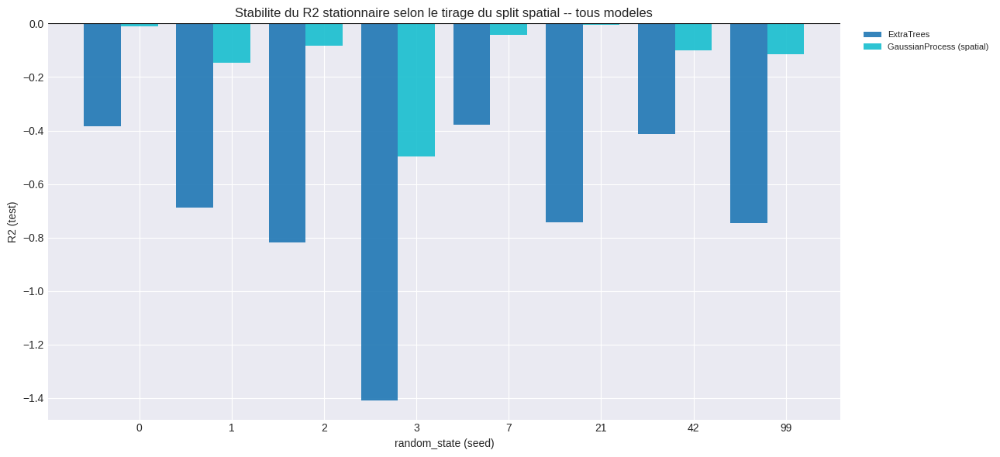

In [25]:
import time

if len(df_stat) < 50:
    print('Pas assez de donnees stationnaires -> verification de stabilite ignoree.')
else:
    SEEDS = [0, 1, 2, 3, 7, 21, 42, 99]
    K_VOISINS_STAB = K_VOISINS
    resultats_seeds = []

    positions_stat_all = df_stat[['x', 'y', 'z']].drop_duplicates().values

    # invariant sur tous les seeds -> calcule une seule fois
    coords_all_s = np.column_stack([
        df_stat['x'].values * ESPACEMENT_X,
        df_stat['y'].values * ESPACEMENT_Y,
        np.array(ALTITUDES_Z)[df_stat['z'].values.astype(int)],
    ])

    t_total = time.time()
    for seed in SEEDS:
        t_seed = time.time()
        rng_s = np.random.RandomState(seed)
        idx_perm_s = rng_s.permutation(len(positions_stat_all))
        n_test_pos_s = max(1, int(0.2 * len(positions_stat_all)))
        pos_test_df_s = pd.DataFrame(positions_stat_all[idx_perm_s[:n_test_pos_s]], columns=['x', 'y', 'z'])
        pos_test_df_s['_is_test'] = True

        # masque vectorise (merge) au lieu de apply ligne par ligne
        mask_test_s = df_stat.merge(pos_test_df_s, on=['x', 'y', 'z'], how='left')['_is_test'].fillna(False).values
        mask_train_s = ~mask_test_s

        temp_moy_train_s = df_stat[mask_train_s].groupby(['x', 'y', 'z'])['temperature'].mean()
        pos_train_idx_s = temp_moy_train_s.index.to_frame(index=False)
        coords_train_s = np.column_stack([
            pos_train_idx_s['x'].values * ESPACEMENT_X,
            pos_train_idx_s['y'].values * ESPACEMENT_Y,
            np.array(ALTITUDES_Z)[pos_train_idx_s['z'].values.astype(int)],
        ])
        temps_train_s = temp_moy_train_s.values
        arbre_s = cKDTree(coords_train_s)

        k_eff_s = min(K_VOISINS_STAB, len(coords_train_s))
        dists_s, idxs_s = arbre_s.query(coords_all_s, k=k_eff_s)
        if k_eff_s == 1:
            dists_s = dists_s[:, None]; idxs_s = idxs_s[:, None]
        poids_s = 1.0 / (dists_s + 1e-6)
        temp_idw_s = (poids_s * temps_train_s[idxs_s]).sum(axis=1) / poids_s.sum(axis=1)
        dist_proche_s = dists_s[:, 0]

        df_stat_s = df_stat.copy()
        df_stat_s['temp_voisins_idw'] = temp_idw_s
        df_stat_s['dist_voisin_proche'] = dist_proche_s

        X_s = df_stat_s[FEATURES_STATIONNAIRE].values.astype(float)
        y_s = df_stat_s['temperature'].values.astype(float)
        Xs_scaled = StandardScaler().fit_transform(X_s)

        Xtr_s, Xte_s = Xs_scaled[mask_train_s], Xs_scaled[mask_test_s]
        ytr_s, yte_s = y_s[mask_train_s], y_s[mask_test_s]

        ligne_seed = {'seed': seed, 'n_positions_test': len(pos_test_df_s)}

        for nom, modele in obtenir_modeles_standard(random_state=seed, rapide=True).items():
            modele.fit(Xtr_s, ytr_s)
            ligne_seed[nom] = r2_score(yte_s, modele.predict(Xte_s))

        agg_s = (df_stat_s[mask_train_s].groupby(['x', 'y', 'z', 'heating_type'])['temperature']
                 .mean().reset_index())
        df_test_pts_s = df_stat_s.loc[mask_test_s, ['x', 'y', 'z', 'heating_type']]
        preds_gpr_s, _ = entrainer_gpr_spatial(agg_s, df_test_pts_s, ytr_s,
                                                random_state=seed, n_restarts=1)
        ligne_seed['GaussianProcess (spatial)'] = r2_score(yte_s, preds_gpr_s)

        resultats_seeds.append(ligne_seed)
        print(f'seed {seed:3d} termine en {time.time()-t_seed:5.1f}s')

    print(f'\nTotal: {time.time()-t_total:.1f}s')

    df_stabilite = pd.DataFrame(resultats_seeds).set_index('seed')
    noms_modeles_stab = [c for c in df_stabilite.columns if c != 'n_positions_test']
    print('\nR2 du modele stationnaire selon le tirage (random_state) :')
    display(df_stabilite.round(4))

    resume_stabilite = pd.DataFrame({
        'R2 moyen': df_stabilite[noms_modeles_stab].mean(),
        'Ecart-type R2': df_stabilite[noms_modeles_stab].std(),
    }).sort_values('R2 moyen', ascending=False)
    print('\nClassement moyen sur les', len(SEEDS), 'tirages :')
    display(resume_stabilite.round(4))

    fig, ax = plt.subplots(figsize=(13, 6))
    seeds_x = np.arange(len(df_stabilite))
    n_modeles = len(noms_modeles_stab)
    largeur_barre = 0.8 / n_modeles
    couleurs = plt.cm.tab10(np.linspace(0, 1, n_modeles))
    for i, nom in enumerate(noms_modeles_stab):
        ax.bar(seeds_x + (i - n_modeles / 2) * largeur_barre, df_stabilite[nom],
               largeur_barre, label=nom, color=couleurs[i], alpha=0.9)
    ax.axhline(0, color='black', linewidth=0.8)
    ax.set_xticks(seeds_x); ax.set_xticklabels(df_stabilite.index)
    ax.set_xlabel('random_state (seed)'); ax.set_ylabel('R2 (test)')
    ax.set_title('Stabilite du R2 stationnaire selon le tirage du split spatial -- tous modeles')
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=8)
    plt.tight_layout()
    plt.show()

### 12quater — Parité réel vs prédit, ExtraTrees et Gaussian Process

Grille de nuages de points réel vs prédit pour **chaque modèle** entraîné ci-dessus, sur le même
jeu de test spatial. Le modèle retenu (meilleur R²) est mis en évidence.

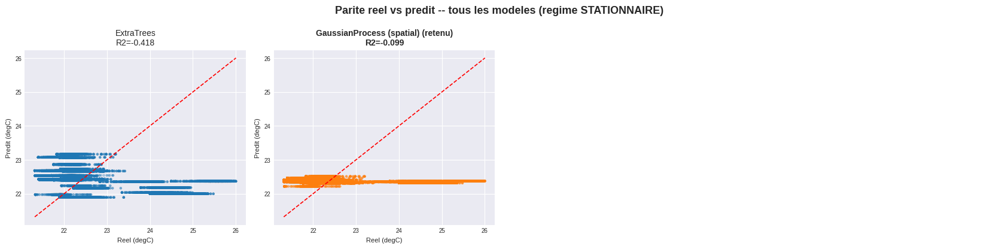

In [26]:
if len(df_stat) >= 50:
    noms_modeles_plot = list(predictions_stat.keys())
    n_modeles = len(noms_modeles_plot)
    n_cols = 4
    n_rows = int(np.ceil(n_modeles / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4.2 * n_cols, 4.2 * n_rows), squeeze=False)

    for i, nom in enumerate(noms_modeles_plot):
        ax = axes[i // n_cols][i % n_cols]
        pred_m = predictions_stat[nom]
        r2_m = metriques_stat_tous[nom]['r2']
        est_meilleur = (nom == NOM_MODELE_STATIONNAIRE)
        ax.scatter(yte_stat, pred_m, s=10, alpha=0.35,
                   color='tab:orange' if est_meilleur else 'tab:blue', edgecolor='none')
        lim_min = min(yte_stat.min(), pred_m.min()); lim_max = max(yte_stat.max(), pred_m.max())
        ax.plot([lim_min, lim_max], [lim_min, lim_max], 'r--', linewidth=1.2)
        titre_ax = f'{nom}{" (retenu)" if est_meilleur else ""}\nR2={r2_m:.3f}'
        ax.set_title(titre_ax, fontsize=10, fontweight='bold' if est_meilleur else 'normal')
        ax.set_xlabel('Reel (degC)', fontsize=8); ax.set_ylabel('Predit (degC)', fontsize=8)
        ax.tick_params(labelsize=7)

    for j in range(n_modeles, n_rows * n_cols):
        axes[j // n_cols][j % n_cols].axis('off')

    plt.suptitle('Parite reel vs predit -- tous les modeles (regime STATIONNAIRE)',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print('Pas assez de donnees pour la grille de parite.')

## 13 — Comparatif ExtraTrees / Gaussian Process — régime INSTATIONNAIRE (interprétation séquentielle)

Régime encore en dérive : chaque modèle **ne prédit que le point suivant**, à partir du point
précédent **le long de la trajectoire du robot** — distance parcourue entre les deux points
(`dist_prev`) et pas de temps entre deux mesures (`dt_prev`, ~20 s).

Même principe que pour le régime stationnaire : ExtraTrees et le Gaussian Process sont entraînés
sur le même split chronologique et comparés (RMSE, MAE, MAPE, R²).

In [27]:
df_inst = df_fusion[df_fusion['phase'] == 'instationnaire'].reset_index(drop=True)
print(f'Lignes en régime instationnaire : {len(df_inst):,}')

GROUPE_SEQUENCE = ['trajectory_type', 'heating_type']  # une séquence = un parcours du robot
GPR_MAX_TRAIN = 1500  # un GPR est O(n^3) -> on sous-echantillonne l'entrainement au-dela

if len(df_inst) < 50:
    print('Pas assez de données instationnaires pour entraîner un modèle -> section ignorée.')
else:
    df_inst = df_inst.sort_values(GROUPE_SEQUENCE + ['t_sec']).reset_index(drop=True)

    grp = df_inst.groupby(GROUPE_SEQUENCE)
    df_inst['x_prev']    = grp['x'].shift(1)
    df_inst['y_prev']    = grp['y'].shift(1)
    df_inst['z_prev']    = grp['z'].shift(1)
    df_inst['temp_lag1'] = grp['temperature'].shift(1)
    df_inst['t_prev']    = grp['t_sec'].shift(1)

    df_inst['dist_prev'] = np.sqrt(
        (df_inst['x'] - df_inst['x_prev']) ** 2 +
        (df_inst['y'] - df_inst['y_prev']) ** 2 +
        ((df_inst['z'] - df_inst['z_prev']) * ESPACEMENT_Z) ** 2)
    df_inst['dt_prev'] = (df_inst['t_sec'] - df_inst['t_prev']).clip(lower=0)
    df_inst.loc[df_inst['dt_prev'].isna() | (df_inst['dt_prev'] == 0), 'dt_prev'] = PAS_TEMPOREL_SEQ

    df_inst_valide = df_inst.dropna(subset=['temp_lag1', 'dist_prev']).reset_index(drop=True)
    print(f'{len(df_inst_valide):,} points avec un point précédent valide (1 par capteur perdu par séquence)')

    FEATURES_INSTATIONNAIRE = ['x', 'y', 'z', 'dist_prev', 'dt_prev', 'temp_lag1'] + FEATURES_CATEGORIELLES

    X_inst = df_inst_valide[FEATURES_INSTATIONNAIRE].values.astype(float)
    y_inst = df_inst_valide['temperature'].values.astype(float)  # le point "suivant" à prédire

    scaler_inst = StandardScaler()
    X_inst_scaled = scaler_inst.fit_transform(X_inst)

    # Split CHRONOLOGIQUE (les derniers ~20% du temps, par groupe, forment le test)
    train_idx_list, test_idx_list = [], []
    for _, g in df_inst_valide.groupby(GROUPE_SEQUENCE):
        order_g = g['t_sec'].values.argsort(kind='stable')
        idx_g = g.index.values[order_g]
        split_g = max(1, min(len(idx_g) - 1, int(len(idx_g) * 0.8)))
        train_idx_list.extend(idx_g[:split_g]); test_idx_list.extend(idx_g[split_g:])
    train_idx_inst = np.array(train_idx_list); test_idx_inst = np.array(test_idx_list)

    Xtr_inst, Xte_inst = X_inst_scaled[train_idx_inst], X_inst_scaled[test_idx_inst]
    ytr_inst, yte_inst = y_inst[train_idx_inst], y_inst[test_idx_inst]

    # ---- Entrainement de TOUS les modeles standards (memes features/split) ----
    predictions_inst = {}
    metriques_inst_tous = {}
    for nom, modele in obtenir_modeles_standard(random_state=42).items():
        modele.fit(Xtr_inst, ytr_inst)
        pred = modele.predict(Xte_inst)
        predictions_inst[nom] = pred
        metriques_inst_tous[nom] = calculer_metriques(yte_inst, pred)
        print(f'  {nom:20s} entraine -- R2={metriques_inst_tous[nom]["r2"]:.4f}')

    # ---- Gaussian Process sur les memes features (sous-echantillonne si besoin -- O(n^3)) ----
    if len(Xtr_inst) > GPR_MAX_TRAIN:
        rng_gpr = np.random.RandomState(42)
        idx_sub = rng_gpr.choice(len(Xtr_inst), size=GPR_MAX_TRAIN, replace=False)
        Xtr_gpr, ytr_gpr = Xtr_inst[idx_sub], ytr_inst[idx_sub]
        print(f'  GaussianProcess : entrainement sous-echantillonne a {GPR_MAX_TRAIN:,} lignes '
              f'(sur {len(Xtr_inst):,} disponibles).')
    else:
        Xtr_gpr, ytr_gpr = Xtr_inst, ytr_inst

    kernel_gpr_inst = (ConstantKernel(1.0, (1e-2, 1e3)) *
                        RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2)) +
                        WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-3, 1e2)))
    gpr_inst = GaussianProcessRegressor(kernel=kernel_gpr_inst, normalize_y=True,
                                         n_restarts_optimizer=2, random_state=42)
    gpr_inst.fit(Xtr_gpr, ytr_gpr)
    pred_gpr_inst = gpr_inst.predict(Xte_inst)
    predictions_inst['GaussianProcess'] = pred_gpr_inst
    metriques_inst_tous['GaussianProcess'] = calculer_metriques(yte_inst, pred_gpr_inst)
    print(f'  {"GaussianProcess":20s} entraine -- '
          f'R2={metriques_inst_tous["GaussianProcess"]["r2"]:.4f}')

    # ---- Comparaison et selection du meilleur modele (sur le R2 test) ----
    comparaison_inst = tableau_comparatif(metriques_inst_tous)
    print()
    print('Comparaison des modeles INSTATIONNAIRE (point suivant / trajectoire) :')
    display(comparaison_inst.round(4))

    NOM_MODELE_INSTATIONNAIRE = comparaison_inst.index[0]
    pred_inst = predictions_inst[NOM_MODELE_INSTATIONNAIRE]
    metrics_inst = metriques_inst_tous[NOM_MODELE_INSTATIONNAIRE]

    print(f'\n>>> Modele retenu pour la carte thermique : {NOM_MODELE_INSTATIONNAIRE}')
    print(f"Modèle INSTATIONNAIRE — RMSE={metrics_inst['rmse']:.4f}°C  "
          f"MAE={metrics_inst['mae']:.4f}°C  MAPE={metrics_inst['mape']:.2f}%  R²={metrics_inst['r2']:.4f}")

    df_inst_test = df_inst_valide.loc[test_idx_inst, ['x', 'y', 'z', 'trajectory_type', 'heating_type']].copy()
    df_inst_test['reel'] = yte_inst
    df_inst_test['predit'] = pred_inst
    df_inst_test['erreur_abs'] = np.abs(df_inst_test['reel'] - df_inst_test['predit'])

Lignes en régime instationnaire : 102,258
102,253 points avec un point précédent valide (1 par capteur perdu par séquence)
  ExtraTrees           entraine -- R2=-0.0476
  GaussianProcess : entrainement sous-echantillonne a 1,500 lignes (sur 81,800 disponibles).
  GaussianProcess      entraine -- R2=-3.3534

Comparaison des modeles INSTATIONNAIRE (point suivant / trajectoire) :


,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
ExtraTrees,0.8216,0.5860,2.5981,-0.0476
GaussianProcess,1.6749,1.2082,5.3726,-3.3534



>>> Modele retenu pour la carte thermique : ExtraTrees
Modèle INSTATIONNAIRE — RMSE=0.8216°C  MAE=0.5860°C  MAPE=2.60%  R²=-0.0476


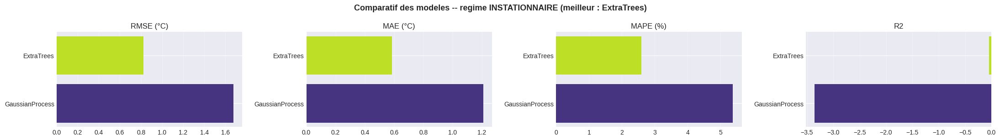

In [28]:
if len(df_inst) >= 50:
    barres_comparatif(comparaison_inst,
        f'Comparatif des modeles -- regime INSTATIONNAIRE (meilleur : {NOM_MODELE_INSTATIONNAIRE})')
else:
    print('Pas assez de donnees pour le comparatif instationnaire.')

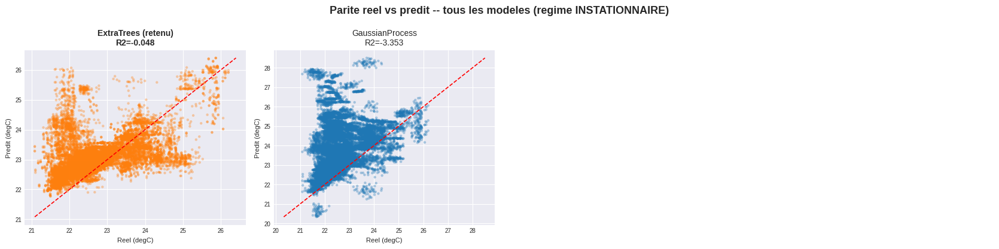

In [29]:
if len(df_inst) >= 50:
    noms_modeles_plot_i = list(predictions_inst.keys())
    n_modeles_i = len(noms_modeles_plot_i)
    n_cols_i = 4
    n_rows_i = int(np.ceil(n_modeles_i / n_cols_i))
    fig, axes = plt.subplots(n_rows_i, n_cols_i, figsize=(4.2 * n_cols_i, 4.2 * n_rows_i), squeeze=False)

    for i, nom in enumerate(noms_modeles_plot_i):
        ax = axes[i // n_cols_i][i % n_cols_i]
        pred_m = predictions_inst[nom]
        r2_m = metriques_inst_tous[nom]['r2']
        est_meilleur = (nom == NOM_MODELE_INSTATIONNAIRE)
        ax.scatter(yte_inst, pred_m, s=10, alpha=0.35,
                   color='tab:orange' if est_meilleur else 'tab:blue', edgecolor='none')
        lim_min = min(yte_inst.min(), pred_m.min()); lim_max = max(yte_inst.max(), pred_m.max())
        ax.plot([lim_min, lim_max], [lim_min, lim_max], 'r--', linewidth=1.2)
        titre_ax = f'{nom}{" (retenu)" if est_meilleur else ""}\nR2={r2_m:.3f}'
        ax.set_title(titre_ax, fontsize=10, fontweight='bold' if est_meilleur else 'normal')
        ax.set_xlabel('Reel (degC)', fontsize=8); ax.set_ylabel('Predit (degC)', fontsize=8)
        ax.tick_params(labelsize=7)

    for j in range(n_modeles_i, n_rows_i * n_cols_i):
        axes[j // n_cols_i][j % n_cols_i].axis('off')

    plt.suptitle('Parite reel vs predit -- tous les modeles (regime INSTATIONNAIRE)',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print('Pas assez de donnees pour la grille de parite.')

## 14 — Métriques par combinaison trajectoire × chauffage × régime

In [30]:
def tableau_metriques(df_test, nom_regime):
    if df_test is None or len(df_test) == 0:
        return pd.DataFrame()
    lignes = []
    for (traj, chauff), g in df_test.groupby(['trajectory_type', 'heating_type']):
        rmse = np.sqrt(mean_squared_error(g['reel'], g['predit']))
        mae  = mean_absolute_error(g['reel'], g['predit'])
        mape = mean_absolute_percentage_error(g['reel'], g['predit']) * 100
        r2   = r2_score(g['reel'], g['predit']) if g['reel'].nunique() > 1 else np.nan
        lignes.append({'Régime': nom_regime, 'Trajectoire': traj, 'Chauffage': chauff,
                        'n': len(g), 'RMSE (°C)': rmse, 'MAE (°C)': mae, 'MAPE (%)': mape, 'R2': r2})
    return pd.DataFrame(lignes)

tab_stat = tableau_metriques(df_stat_test if 'df_stat_test' in globals() else None, 'Stationnaire')
tab_inst = tableau_metriques(df_inst_test if 'df_inst_test' in globals() else None, 'Instationnaire')
tableau_complet = pd.concat([tab_stat, tab_inst], ignore_index=True)
print('Métriques par combinaison (Cas A) :')
display(tableau_complet.round(4))

Métriques par combinaison (Cas A) :


,Régime,Trajectoire,Chauffage,n,RMSE (°C),MAE (°C),MAPE (%),R2
0,Stationnaire,Aléatoire,mesure_principale,5373,0.9417,0.6872,2.9654,-0.0701
1,Stationnaire,FPS,mesure_principale,3582,1.0842,0.6920,2.9355,-0.0872
2,Stationnaire,Périmètre,mesure_principale,7761,1.1532,0.6678,2.7806,-0.1269
3,Stationnaire,Serpentine (mesurée),mesure_principale,14328,1.0956,0.7005,2.9558,-0.0953
4,Stationnaire,Zigzag diagonal,mesure_principale,7164,1.2761,0.8270,3.4518,-0.1155
5,Instationnaire,Aléatoire,mesure_principale,2871,0.8845,0.6371,2.8384,-0.2448
6,Instationnaire,FPS,mesure_principale,2871,0.7196,0.5367,2.3745,0.1143
7,Instationnaire,Périmètre,mesure_principale,3947,0.7039,0.5249,2.3238,0.1930
8,Instationnaire,Serpentine (mesurée),mesure_principale,7176,0.8378,0.5858,2.5900,-0.0884
9,Instationnaire,Zigzag diagonal,mesure_principale,3588,0.9267,0.6523,2.9026,-0.1657


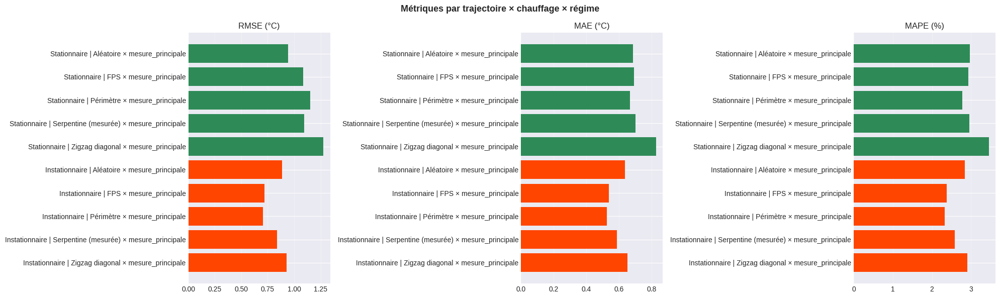

In [31]:
if len(tableau_complet) > 0:
    tableau_complet['groupe'] = (tableau_complet['Régime'] + ' | ' +
                                  tableau_complet['Trajectoire'] + ' × ' + tableau_complet['Chauffage'])
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    couleurs = tableau_complet['Régime'].map({'Stationnaire': 'seagreen', 'Instationnaire': 'orangered'})
    for ax, m in zip(axes, ['RMSE (°C)', 'MAE (°C)', 'MAPE (%)']):
        ax.barh(tableau_complet['groupe'], tableau_complet[m], color=couleurs)
        ax.set_title(m); ax.invert_yaxis(); ax.grid(True, alpha=0.3, axis='x')
    plt.suptitle('Métriques par trajectoire × chauffage × régime', fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()
else:
    print('Aucune métrique à afficher (pas assez de données dans un des deux régimes).')

## 14bis — Modèle combiné ExtraTrees + IDW causal (interpolation complète, tous les points)

**Objectif de cette section** : contrairement aux sections 12/13/17 (qui évaluent la
généralisation sur un split train/test, positions ou instants tenus à l'écart), on veut ici
**remplir toutes les positions** des cartes 2D/3D de la section 15 avec une valeur — y compris
les positions déjà vues à l'entraînement. Le modèle retenu est le même que celui testé en
section 17 (« ExtraTrees corrige l'IDW causal ») : `prédiction = idw_causal + résidu appris par ExtraTrees` (résidu =
écart entre la température réelle et l'interpolation IDW causale, appris à partir des features
géométrie/CVC + `idw_causal`). C'est un modèle **hybride interpolation + ML** : la partie IDW
reste une pure interpolation spatiale causale (aucune triche temporelle), et ExtraTrees ne fait
que corriger son biais résiduel.

Le modèle est ici entraîné puis évalué sur l'ensemble des points disponibles (pas de split) :
le but n'est pas de mesurer une généralisation (déjà fait en 12/13/17bis) mais de produire une
carte d'interpolation complète, sans trou, pour la visualisation.

In [32]:
# === Modeles pleine-grille (interpolation complete, tous les points) ===
# Trois variantes, calculees pour TOUTE la grille (pas de split train/test -- objectif :
# remplir la carte, pas evaluer une generalisation, deja faite en 12/13/17bis) :
#   - idw         : IDW causal seul (interpolation geometrique pure, section 12bis-causal)
#   - extratrees  : ExtraTrees seul, entraine directement sur la temperature (features
#                   geometrie/CVC + categorielles, SANS idw_causal)
#   - combine     : idw_causal + residu appris par ExtraTrees (le meilleur des deux mondes)
df_extratrees_idw_stationnaire = None
df_extratrees_idw_instationnaire = None
df_extratrees_seul_stationnaire = None
df_extratrees_seul_instationnaire = None
modeles_extratrees_idw = {}
modeles_extratrees_seul = {}

if 'df_idw_causal' not in globals():
    print("La section 12bis-causal (idw_causal) doit etre executee avant celle-ci -> section ignoree.")
else:
    df_residu_complet = df_idw_causal.dropna(subset=['idw_causal']).copy()
    df_residu_complet['residu'] = df_residu_complet['temperature'] - df_residu_complet['idw_causal']
    FEATURES_RESIDU_COMPLET = FEATURES_GEOMETRIE_CVC + FEATURES_CATEGORIELLES + ['idw_causal']
    FEATURES_EXTRATREES_SEUL = FEATURES_GEOMETRIE_CVC + FEATURES_CATEGORIELLES

    for phase in ['stationnaire', 'instationnaire']:
        sous = df_residu_complet[df_residu_complet['phase'] == phase].reset_index(drop=True)
        if len(sous) < 50:
            print(f"{phase} : pas assez de donnees -> ignore.")
            continue

        y_temp = sous['temperature'].values.astype(float)
        y_idw = sous['idw_causal'].values.astype(float)
        cols_garder = ['x', 'y', 'z', 'trajectory_type', 'heating_type', 'phase']
        if 't_sec' in sous.columns:
            cols_garder.append('t_sec')

        # --- ExtraTrees + IDW causal (residu) ---
        X = sous[FEATURES_RESIDU_COMPLET].values.astype(float)
        y_res = sous['residu'].values.astype(float)
        scaler_c = StandardScaler()
        X_scaled = scaler_c.fit_transform(X)
        modele_c = ExtraTreesRegressor(n_estimators=300, max_depth=20, min_samples_leaf=2,
                                        random_state=42, n_jobs=-1)
        modele_c.fit(X_scaled, y_res)
        pred_combine = y_idw + modele_c.predict(X_scaled)
        m_combine = calculer_metriques(y_temp, pred_combine)
        print(f"{phase:16s} -- IDW + ExtraTrees (tous les points, interpolation)   : "
              f"R2={m_combine['r2']:.4f}  RMSE={m_combine['rmse']:.3f}degC  "
              f"MAE={m_combine['mae']:.3f}degC  (n={len(sous):,})")

        df_out_c = sous[cols_garder].copy()
        df_out_c['reel'] = y_temp
        df_out_c['predit'] = pred_combine
        modeles_extratrees_idw[phase] = {'modele': modele_c, 'scaler': scaler_c,
                                          'features': FEATURES_RESIDU_COMPLET}

        # --- ExtraTrees seul (sans idw_causal) ---
        Xs = sous[FEATURES_EXTRATREES_SEUL].values.astype(float)
        scaler_s = StandardScaler()
        Xs_scaled = scaler_s.fit_transform(Xs)
        modele_s = ExtraTreesRegressor(n_estimators=300, max_depth=20, min_samples_leaf=2,
                                        random_state=42, n_jobs=-1)
        modele_s.fit(Xs_scaled, y_temp)
        pred_seul = modele_s.predict(Xs_scaled)
        m_seul = calculer_metriques(y_temp, pred_seul)
        print(f"{phase:16s} -- ExtraTrees seul (tous les points, interpolation)    : "
              f"R2={m_seul['r2']:.4f}  RMSE={m_seul['rmse']:.3f}degC  "
              f"MAE={m_seul['mae']:.3f}degC  (n={len(sous):,})")

        df_out_s = sous[cols_garder].copy()
        df_out_s['reel'] = y_temp
        df_out_s['predit'] = pred_seul
        modeles_extratrees_seul[phase] = {'modele': modele_s, 'scaler': scaler_s,
                                           'features': FEATURES_EXTRATREES_SEUL}

        m_idw = calculer_metriques(y_temp, y_idw)
        print(f"{phase:16s} -- IDW causal seul (tous les points, interpolation)    : "
              f"R2={m_idw['r2']:.4f}  RMSE={m_idw['rmse']:.3f}degC  "
              f"MAE={m_idw['mae']:.3f}degC  (n={len(sous):,})")

        if phase == 'stationnaire':
            df_extratrees_idw_stationnaire = df_out_c
            df_extratrees_seul_stationnaire = df_out_s
        else:
            df_extratrees_idw_instationnaire = df_out_c
            df_extratrees_seul_instationnaire = df_out_s

    print()
    print("-> Ces tables (tous les points, sans split train/test) alimentent les cartes 2D/3D")
    print("   de la section 15 et les courbes de comparaison de la section 18 : elles servent a")
    print("   l'interpolation/visualisation complete (aucun point laisse vide), pas a l'evaluation")
    print("   de generalisation (voir sections 12/13/17bis pour les scores en generalisation reelle).")


stationnaire     -- IDW + ExtraTrees (tous les points, interpolation)   : R2=0.9723  RMSE=0.143degC  MAE=0.097degC  (n=204,174)
stationnaire     -- ExtraTrees seul (tous les points, interpolation)    : R2=0.9225  RMSE=0.239degC  MAE=0.176degC  (n=204,174)
stationnaire     -- IDW causal seul (tous les points, interpolation)    : R2=-0.5095  RMSE=1.054degC  MAE=0.790degC  (n=204,174)
instationnaire   -- IDW + ExtraTrees (tous les points, interpolation)   : R2=0.9992  RMSE=0.106degC  MAE=0.058degC  (n=101,916)
instationnaire   -- ExtraTrees seul (tous les points, interpolation)    : R2=0.0222  RMSE=3.644degC  MAE=3.441degC  (n=101,916)
instationnaire   -- IDW causal seul (tous les points, interpolation)    : R2=0.9535  RMSE=0.795degC  MAE=0.564degC  (n=101,916)

-> Ces tables (tous les points, sans split train/test) alimentent les cartes 2D/3D
   de la section 15 et les courbes de comparaison de la section 18 : elles servent a
   l'interpolation/visualisation complete (aucun point laisse 

## 15 — Cartes thermiques (2D + 3D) par trajectoire × chauffage × régime

Pour chaque combinaison **trajectoire × chauffage**, et pour chacun des deux régimes, on affiche **trois visualisations distinctes** (jamais mélangées) :

1. **Carte 2D** (vue de dessus, une ligne par altitude — 0.5 m / 1.0 m / 1.5 m) : interpolation `griddata` du champ réel vs prédit, **prédit = sortie du modèle combiné ExtraTrees + IDW causal (section 14bis), calculée pour tous les points** (aucun trou, contrairement au split test des sections 12/13).
2. **Carte 3D** : nuage de points réel vs prédit dans le volume (x, y, altitude) — **sans trajectoire dedans**.
3. **Trajectoire** (uniquement en régime instationnaire, où l'ordre chronologique a un sens) : visualisation **séparée**, affichée juste à côté des cartes de température, jamais superposée au nuage 3D.

- **Stationnaire** : les points sont les positions tenues à l'écart de l'entraînement (pas d'ordre naturel entre elles → pas de trajectoire affichée).
- **Instationnaire** : les points sont triés chronologiquement → la trajectoire est tracée à part.


In [33]:
from mpl_toolkits.mplot3d import Axes3D  # noqa (nécessaire pour projection='3d')
from scipy.interpolate import griddata as _griddata_2d


def _grille_fine(largeur, longueur, pas=60):
    gx = np.linspace(0, largeur - 1, pas)
    gy = np.linspace(0, longueur - 1, pas)
    return np.meshgrid(gx, gy)


def plot_carte_2d(df_pts, titre, cmap='RdYlBu_r'):
    """Carte 2D (vue de dessus), une ligne par altitude réelle (0.5 / 1.0 / 1.5 m),
    réel à gauche, prédit à droite. Interpolation `griddata` sur (x, y)."""
    if len(df_pts) == 0:
        print(f'{titre} [carte 2D] : aucun point à afficher.')
        return

    niveaux = sorted(df_pts['z'].unique())
    vmin = min(df_pts['reel'].min(), df_pts['predit'].min())
    vmax = max(df_pts['reel'].max(), df_pts['predit'].max())
    col_labels = [chr(ord('A') + i) for i in range(LARGEUR)]
    GX, GY = _grille_fine(LARGEUR, LONGUEUR)

    fig, axes = plt.subplots(len(niveaux), 2, figsize=(11, 4.3 * len(niveaux)), squeeze=False)
    for row, z in enumerate(niveaux):
        d = df_pts[df_pts['z'] == z]
        alt = ALTITUDES_Z[int(z)]
        for col, (champ, nom) in enumerate(zip(['reel', 'predit'], ['Réel', 'Prédit'])):
            ax = axes[row][col]
            if len(d) >= 3:
                GZ = _griddata_2d((d['x'], d['y']), d[champ], (GX, GY), method='cubic')
                im = ax.imshow(GZ, origin='lower', extent=[0, LARGEUR - 1, 0, LONGUEUR - 1],
                                cmap=cmap, vmin=vmin, vmax=vmax, aspect='auto')
                fig.colorbar(im, ax=ax, shrink=0.85, label='°C')
            ax.scatter(d['x'], d['y'], c=d[champ], cmap=cmap, vmin=vmin, vmax=vmax,
                       edgecolors='black', linewidths=0.5, s=45, zorder=5)
            ax.set_xticks(range(LARGEUR)); ax.set_xticklabels(col_labels)
            ax.set_yticks(range(LONGUEUR))
            ax.set_title(f'{nom} — z = {alt:.1f} m')
    plt.suptitle(f'{titre} — carte 2D (vue de dessus)', fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()


def plot_carte_3d(df_pts, titre, cmap='RdYlBu_r'):
    """Nuage de points 3D (réel vs prédit) — SANS trajectoire : uniquement le champ de
    température. La trajectoire (si besoin) est affichée séparément par plot_trajectoire."""
    if len(df_pts) == 0:
        print(f'{titre} [carte 3D] : aucun point à afficher.')
        return

    vmin = min(df_pts['reel'].min(), df_pts['predit'].min())
    vmax = max(df_pts['reel'].max(), df_pts['predit'].max())
    col_labels = [chr(ord('A') + i) for i in range(LARGEUR)]

    fig = plt.figure(figsize=(14, 6))
    for i, (col, nom) in enumerate(zip(['reel', 'predit'], ['Réel', 'Prédit'])):
        ax = fig.add_subplot(1, 2, i + 1, projection='3d')
        sc = ax.scatter(df_pts['x'], df_pts['y'], df_pts['z'], c=df_pts[col], cmap=cmap,
                         s=55, edgecolors='black', linewidths=0.4, vmin=vmin, vmax=vmax, zorder=5)
        ax.set_xlabel('X (A–H)'); ax.set_xticks(range(LARGEUR)); ax.set_xticklabels(col_labels)
        ax.set_ylabel('Y (0–4)'); ax.set_yticks(range(LONGUEUR))
        ax.set_zlabel('Altitude (m)'); ax.set_zticks(range(HAUTEUR))
        ax.set_zticklabels([f'{a:.1f} m' for a in ALTITUDES_Z])
        ax.set_title(nom)
        fig.colorbar(sc, ax=ax, shrink=0.6, pad=0.1, label='°C')
    plt.suptitle(f'{titre} — carte 3D', fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()


def plot_trajectoire(df_pts, titre):
    """Visualisation SÉPARÉE de la trajectoire du robot (ordre chronologique) —
    affichée à côté des cartes de température, jamais mêlée au nuage 3D du champ.
    Panneau gauche : vue de dessus (x, y) avec le chemin parcouru.
    Panneau droit : altitude parcourue le long de la séquence."""
    if len(df_pts) == 0:
        return
    d = df_pts.reset_index(drop=True)
    ordre = np.arange(len(d))
    alt = np.array(ALTITUDES_Z)[d['z'].values.astype(int)]
    col_labels = [chr(ord('A') + i) for i in range(LARGEUR)]

    fig, axes = plt.subplots(1, 2, figsize=(13, 5))
    sc = axes[0].scatter(d['x'], d['y'], c=ordre, cmap='viridis', s=40, zorder=3)
    axes[0].plot(d['x'], d['y'], color='gray', lw=0.8, alpha=0.6, zorder=1)
    axes[0].set_xticks(range(LARGEUR)); axes[0].set_xticklabels(col_labels)
    axes[0].set_yticks(range(LONGUEUR))
    axes[0].set_xlabel('X (A–H)'); axes[0].set_ylabel('Y (0–4)')
    axes[0].set_title('Trajectoire — vue de dessus')
    fig.colorbar(sc, ax=axes[0], label='ordre de passage')

    axes[1].plot(ordre, alt, marker='o', ms=3, color='steelblue')
    axes[1].set_yticks(ALTITUDES_Z)
    axes[1].set_xlabel('ordre de passage'); axes[1].set_ylabel('Altitude (m)')
    axes[1].set_title('Altitude parcourue')

    plt.suptitle(f'{titre} — trajectoire (visualisation à part, hors du champ 3D)',
                 fontsize=13, fontweight='bold')
    plt.tight_layout(); plt.show()


def plot_champ_3d(df_pts, titre, avec_trajectoire=False, cmap='RdYlBu_r'):
    """Orchestrateur : carte 2D puis carte 3D du champ de température (jamais de
    trajectoire mêlée dedans) ; si avec_trajectoire=True, la trajectoire est
    affichée ensuite, à côté, dans sa propre visualisation."""
    plot_carte_2d(df_pts, titre, cmap=cmap)
    plot_carte_3d(df_pts, titre, cmap=cmap)
    if avec_trajectoire:
        plot_trajectoire(df_pts, titre)


def sous_ensemble_stationnaire(traj):
    """Toutes les positions mesurées pour cette trajectoire (moyenne par position x,y,z),
    remplies avec la prédiction du modèle combiné ExtraTrees + IDW causal (interpolation
    complète, section 14bis) -- plus seulement les positions tenues à l'écart du split test,
    afin que la carte n'ait aucun trou."""
    if 'df_extratrees_idw_stationnaire' not in globals() or df_extratrees_idw_stationnaire is None:
        return {}
    d = df_extratrees_idw_stationnaire[df_extratrees_idw_stationnaire['trajectory_type'] == traj]
    out = {}
    for chauff, g in d.groupby('heating_type'):
        out[chauff] = g.groupby(['x', 'y', 'z'])[['reel', 'predit']].mean().reset_index()
    return out


def sous_ensemble_instationnaire(traj):
    """Séquence chronologique complète (tous les points, pas seulement le split test) pour
    cette trajectoire, remplie avec la prédiction du modèle combiné ExtraTrees + IDW causal
    (interpolation complète, section 14bis) -- trace la trajectoire entière."""
    if 'df_extratrees_idw_instationnaire' not in globals() or df_extratrees_idw_instationnaire is None:
        return {}
    d = df_extratrees_idw_instationnaire[df_extratrees_idw_instationnaire['trajectory_type'] == traj]
    out = {}
    for chauff, g in d.groupby('heating_type'):
        g = g.sort_values('t_sec') if 't_sec' in g.columns else g
        out[chauff] = g.reset_index(drop=True)
    return out

TRAJECTOIRES_CONNUES = [TRAJECTORY_TYPE_MESUREE, 'Périmètre', 'Zigzag diagonal', 'Aléatoire', 'FPS']
print('Fonctions de visualisation (2D + 3D + trajectoire séparée) prêtes.')


Fonctions de visualisation (2D + 3D + trajectoire séparée) prêtes.


#### Stationnaire — trajectoire : Serpentine (mesurée)

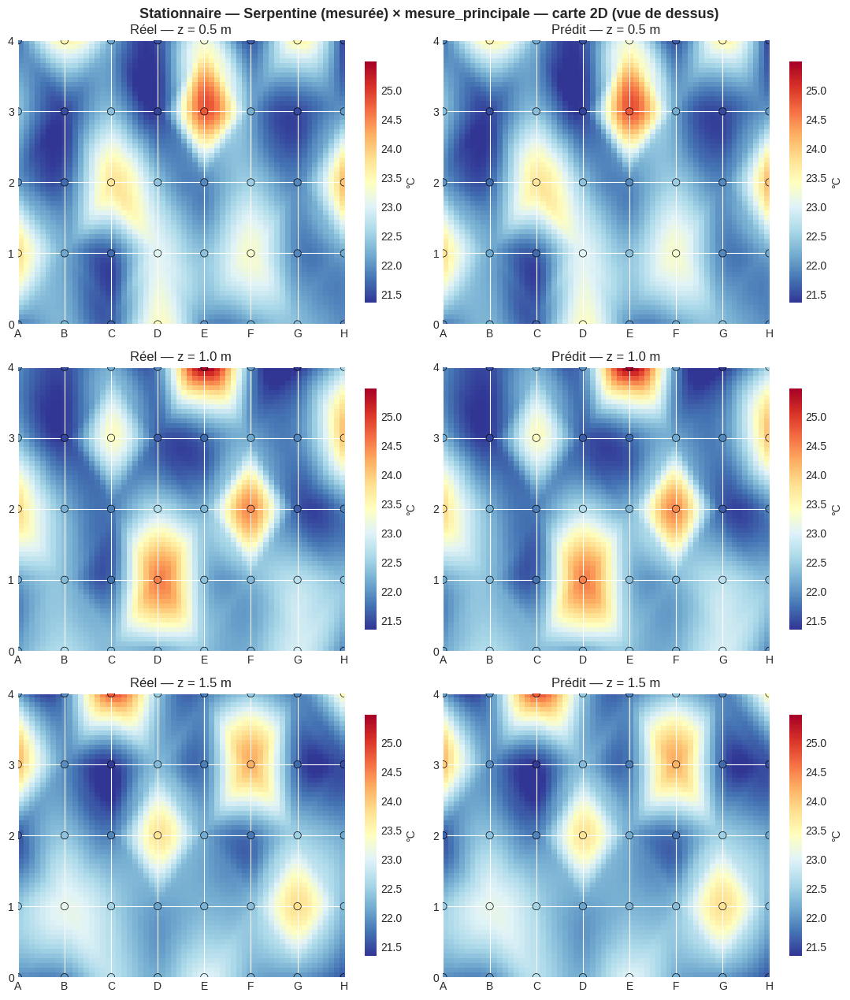

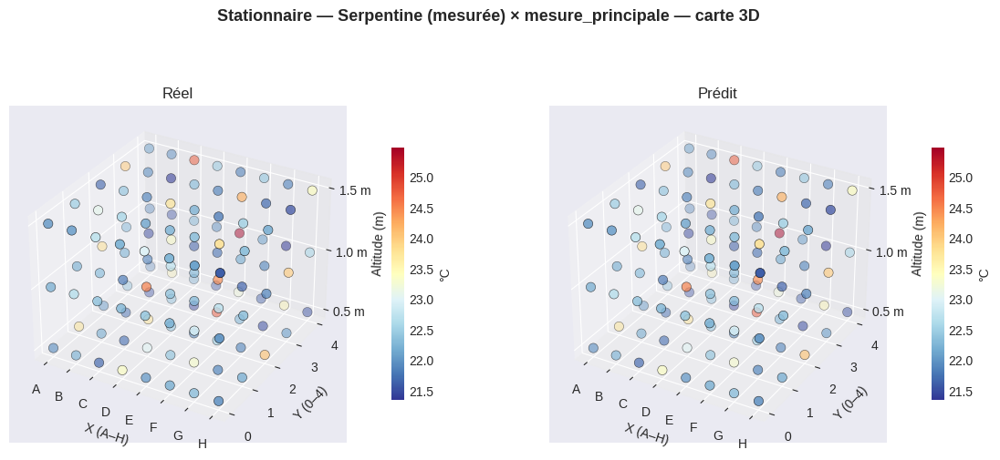

In [34]:
sous_ensembles = sous_ensemble_stationnaire(TRAJECTORY_TYPE_MESUREE)
if len(sous_ensembles) == 0:
    print('Stationnaire — Serpentine (mesurée) : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Stationnaire — Serpentine (mesurée) × {chauff}', avec_trajectoire=False)

#### Stationnaire — trajectoire : Périmètre

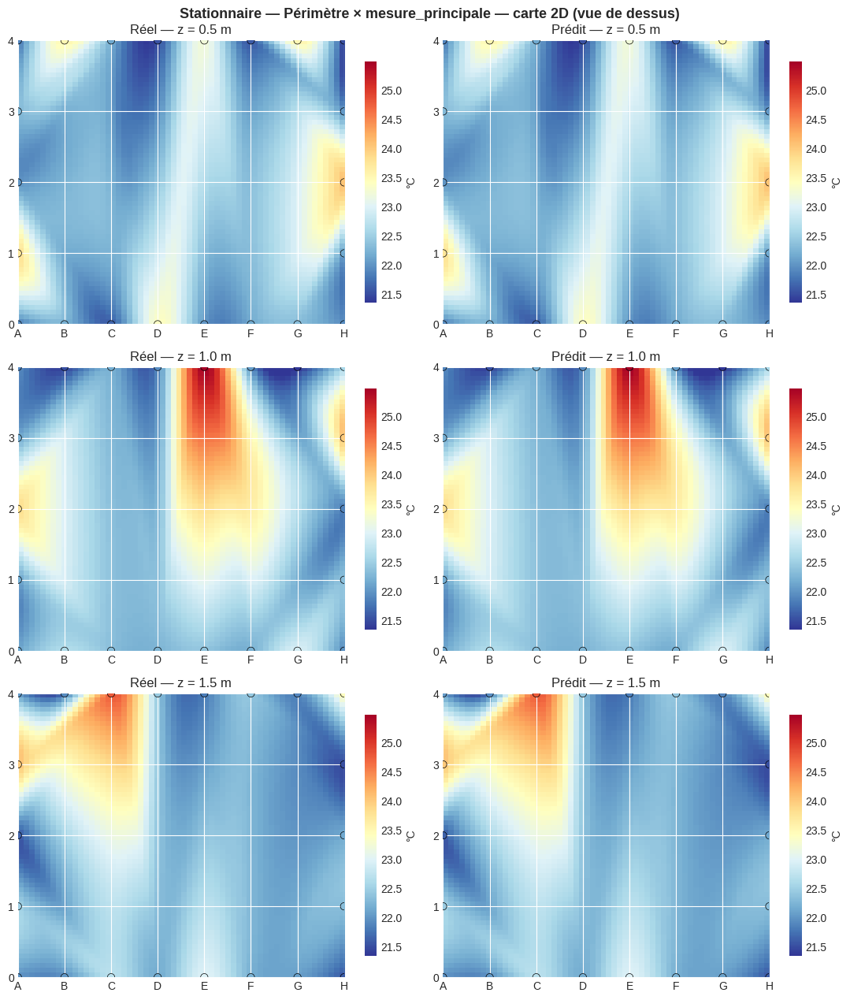

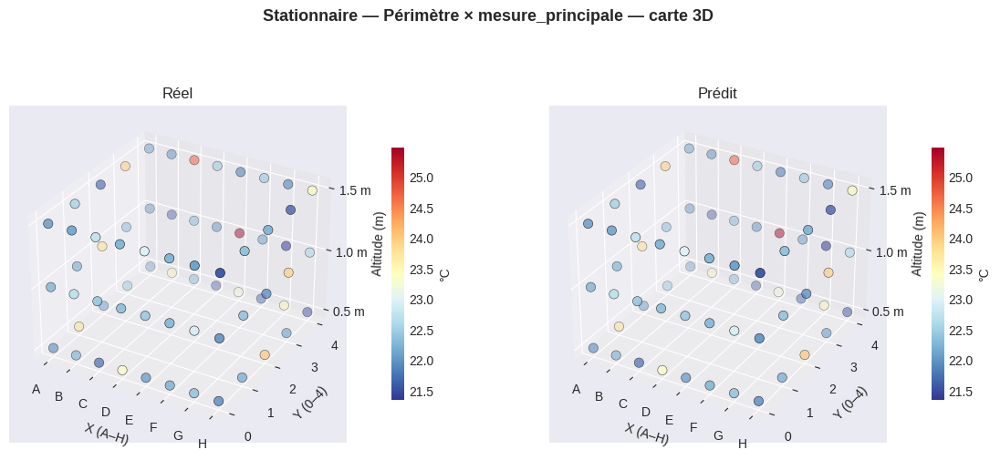

In [35]:
sous_ensembles = sous_ensemble_stationnaire('Périmètre')
if len(sous_ensembles) == 0:
    print('Stationnaire — Périmètre : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Stationnaire — Périmètre × {chauff}', avec_trajectoire=False)

#### Stationnaire — trajectoire : Zigzag diagonal

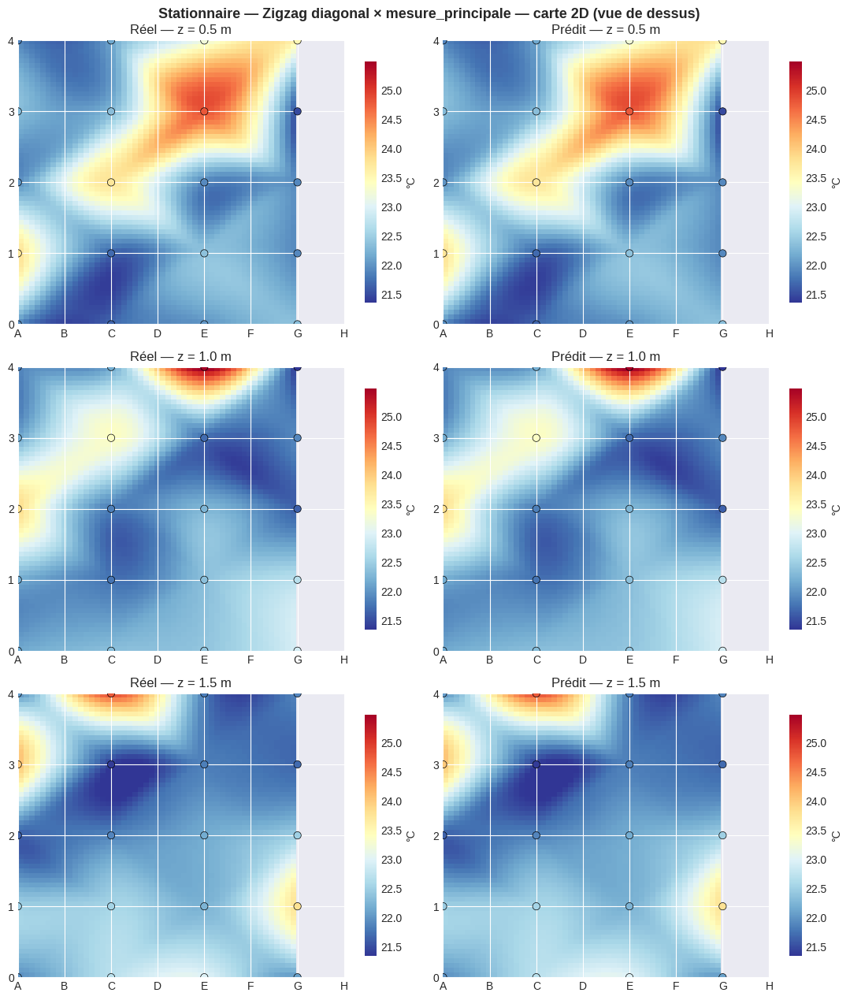

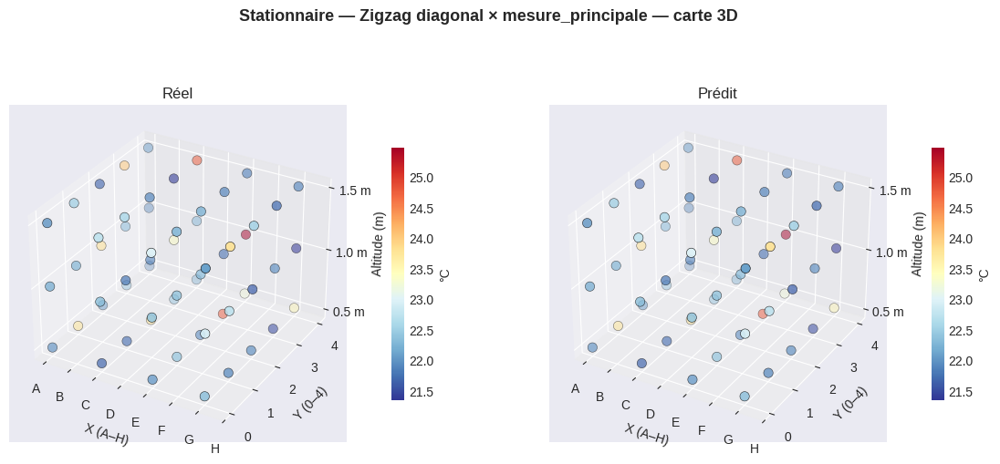

In [36]:
sous_ensembles = sous_ensemble_stationnaire('Zigzag diagonal')
if len(sous_ensembles) == 0:
    print('Stationnaire — Zigzag diagonal : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Stationnaire — Zigzag diagonal × {chauff}', avec_trajectoire=False)

#### Stationnaire — trajectoire : Aléatoire

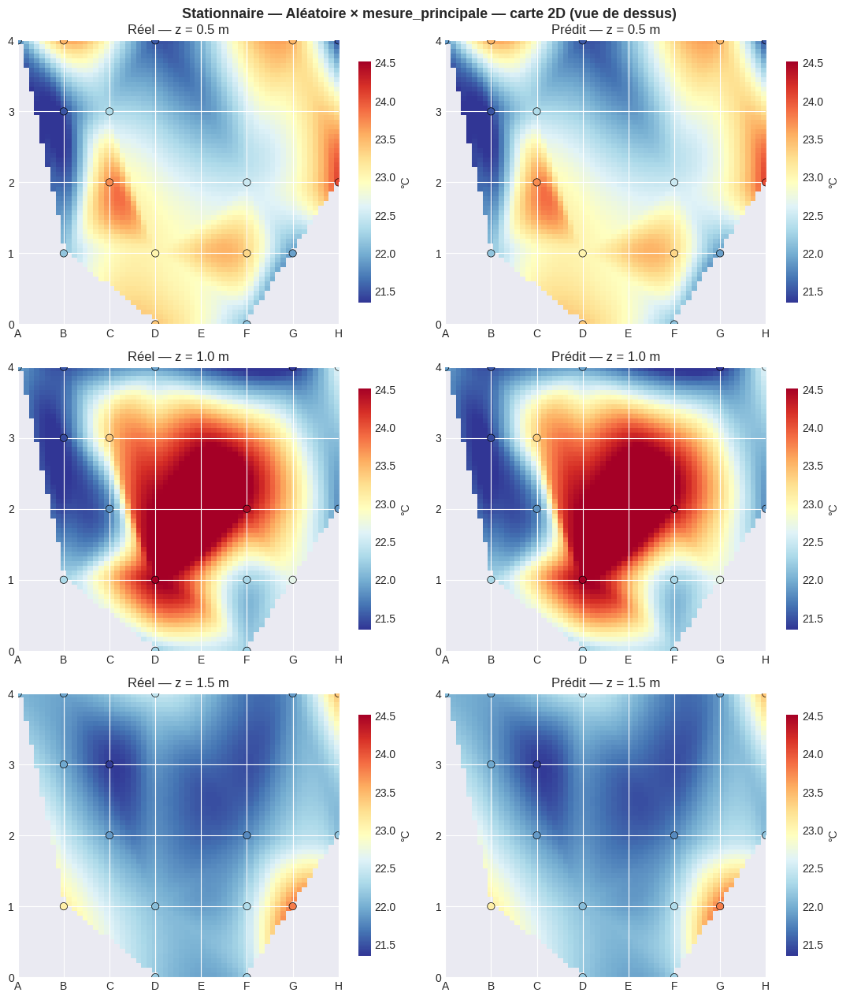

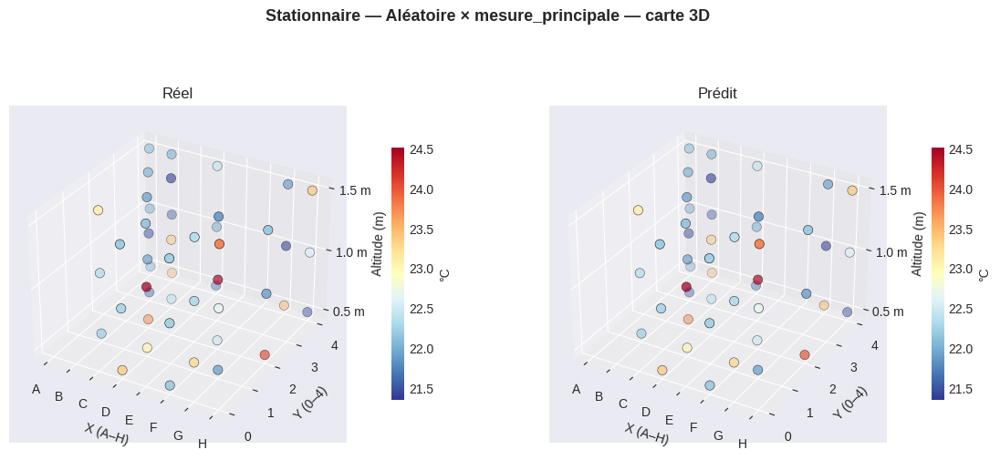

In [37]:
sous_ensembles = sous_ensemble_stationnaire('Aléatoire')
if len(sous_ensembles) == 0:
    print('Stationnaire — Aléatoire : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Stationnaire — Aléatoire × {chauff}', avec_trajectoire=False)

#### Stationnaire — trajectoire : FPS

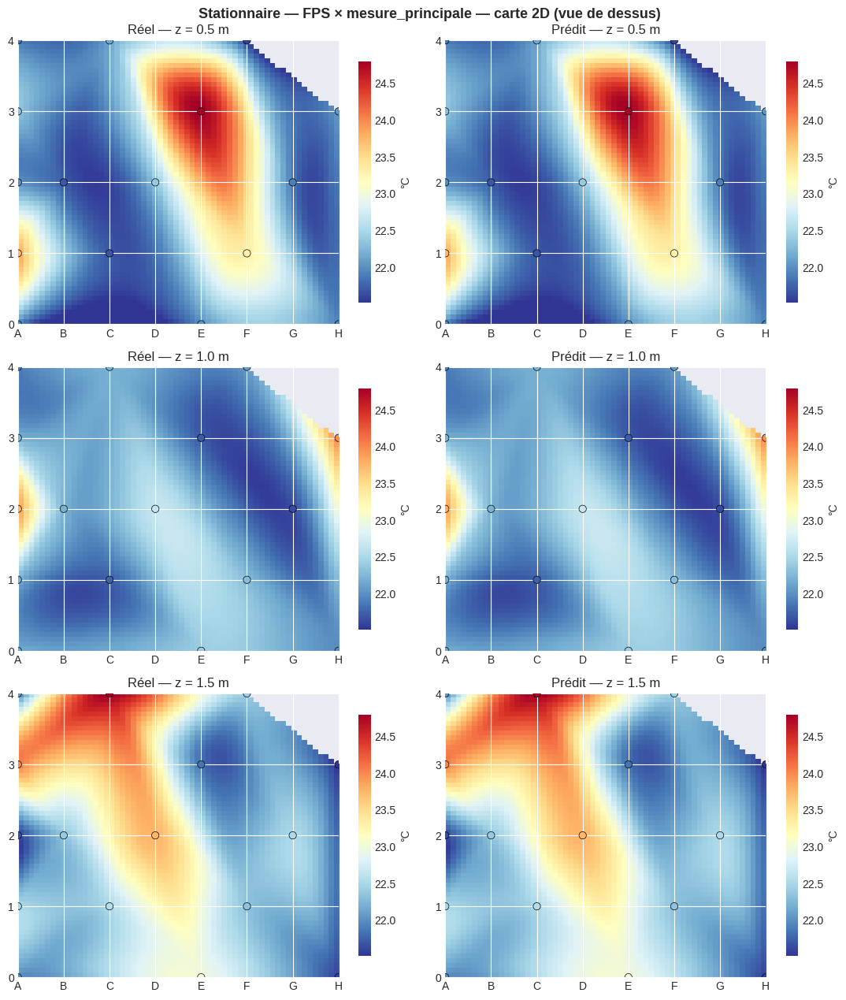

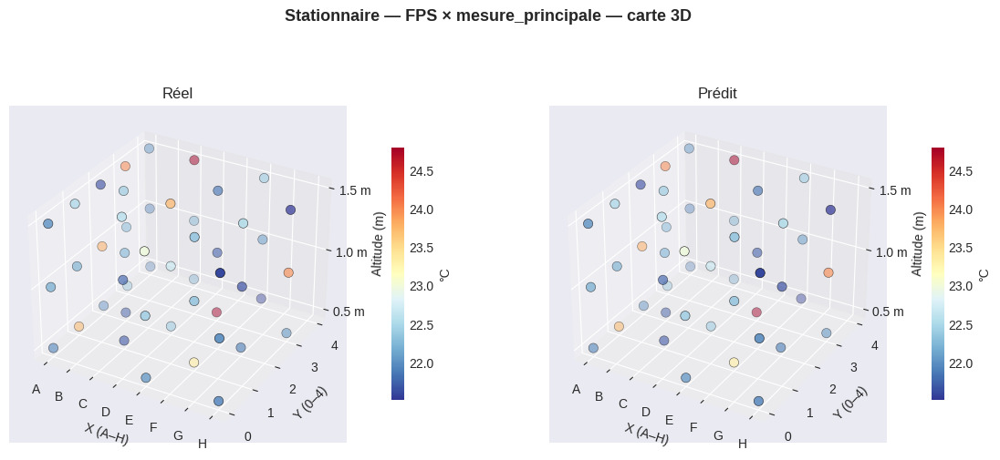

In [38]:
sous_ensembles = sous_ensemble_stationnaire('FPS')
if len(sous_ensembles) == 0:
    print('Stationnaire — FPS : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Stationnaire — FPS × {chauff}', avec_trajectoire=False)

#### Instationnaire — trajectoire : Serpentine (mesurée)

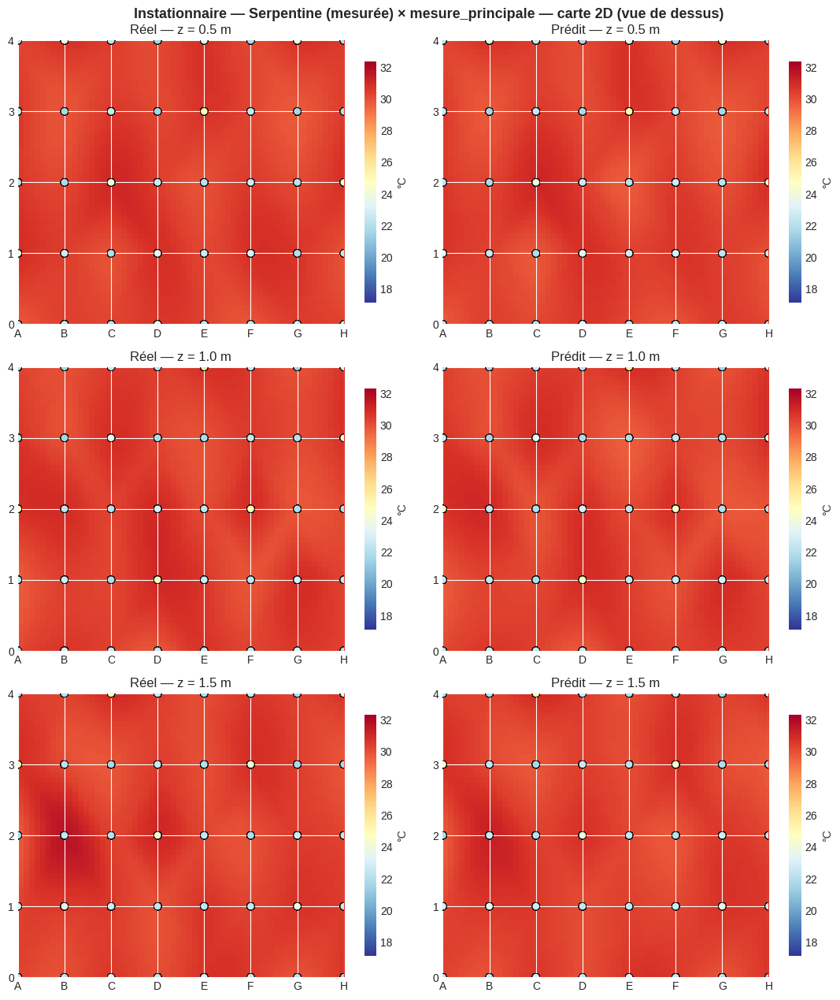

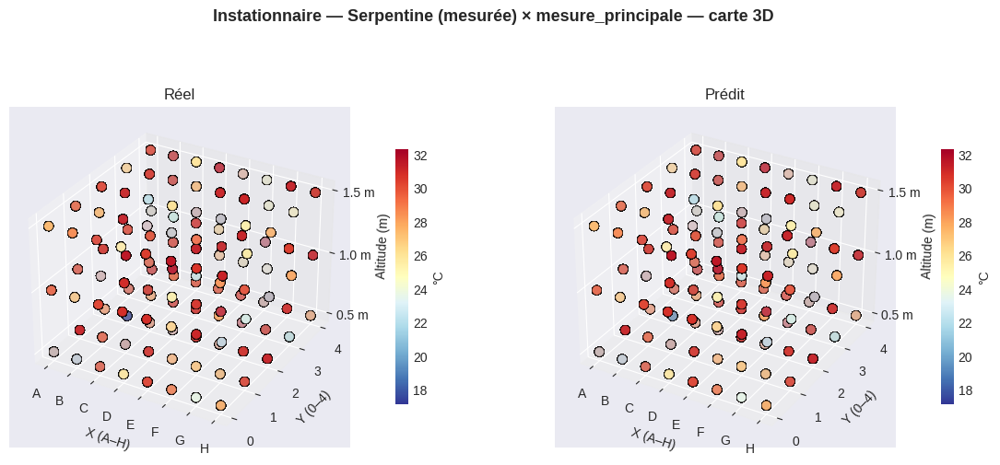

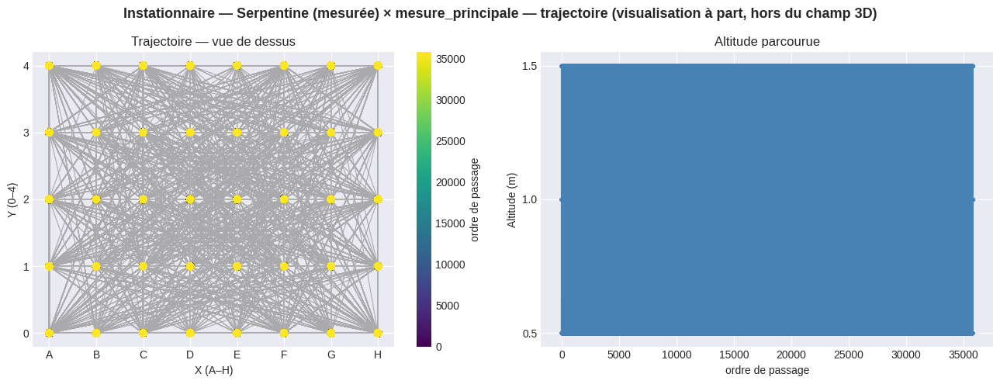

In [39]:
sous_ensembles = sous_ensemble_instationnaire(TRAJECTORY_TYPE_MESUREE)
if len(sous_ensembles) == 0:
    print('Instationnaire — Serpentine (mesurée) : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Instationnaire — Serpentine (mesurée) × {chauff}', avec_trajectoire=True)

#### Instationnaire — trajectoire : Périmètre

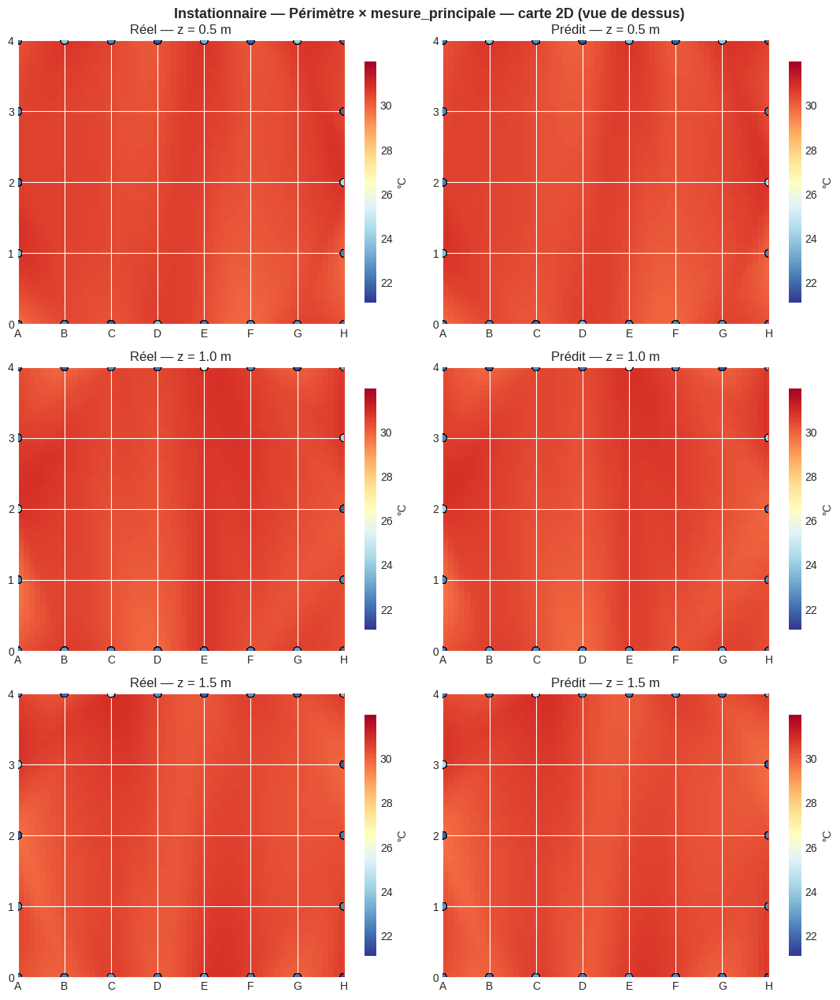

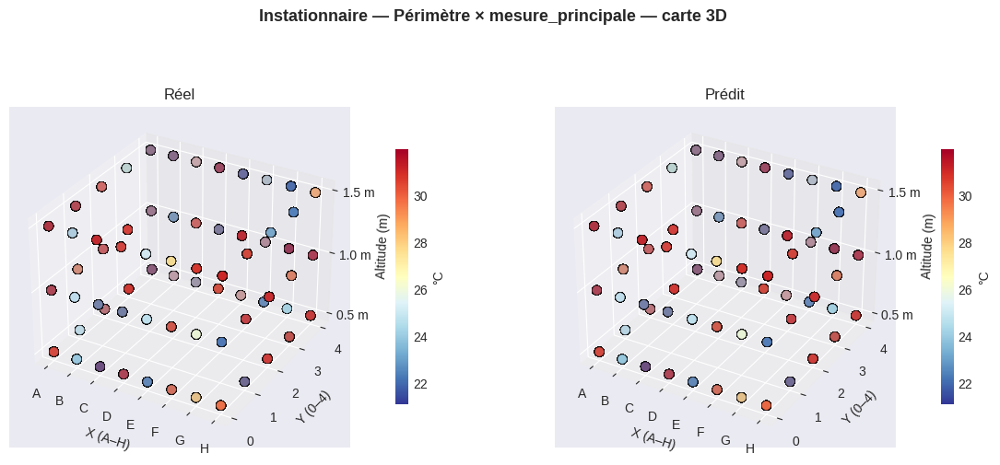

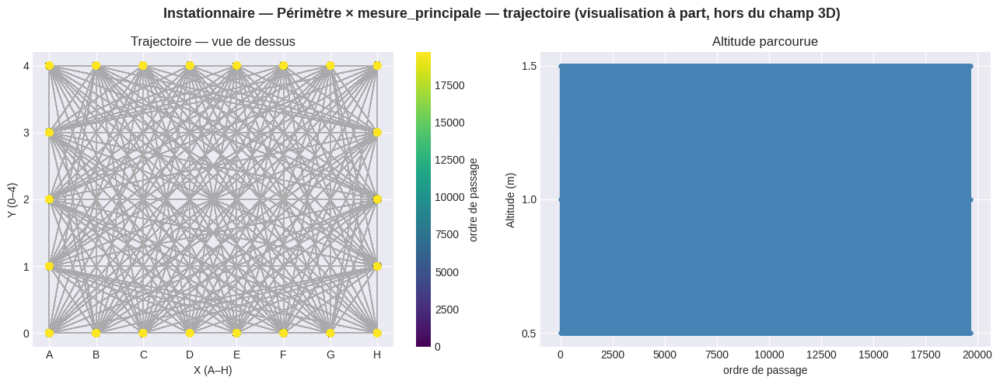

In [40]:
sous_ensembles = sous_ensemble_instationnaire('Périmètre')
if len(sous_ensembles) == 0:
    print('Instationnaire — Périmètre : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Instationnaire — Périmètre × {chauff}', avec_trajectoire=True)

#### Instationnaire — trajectoire : Zigzag diagonal

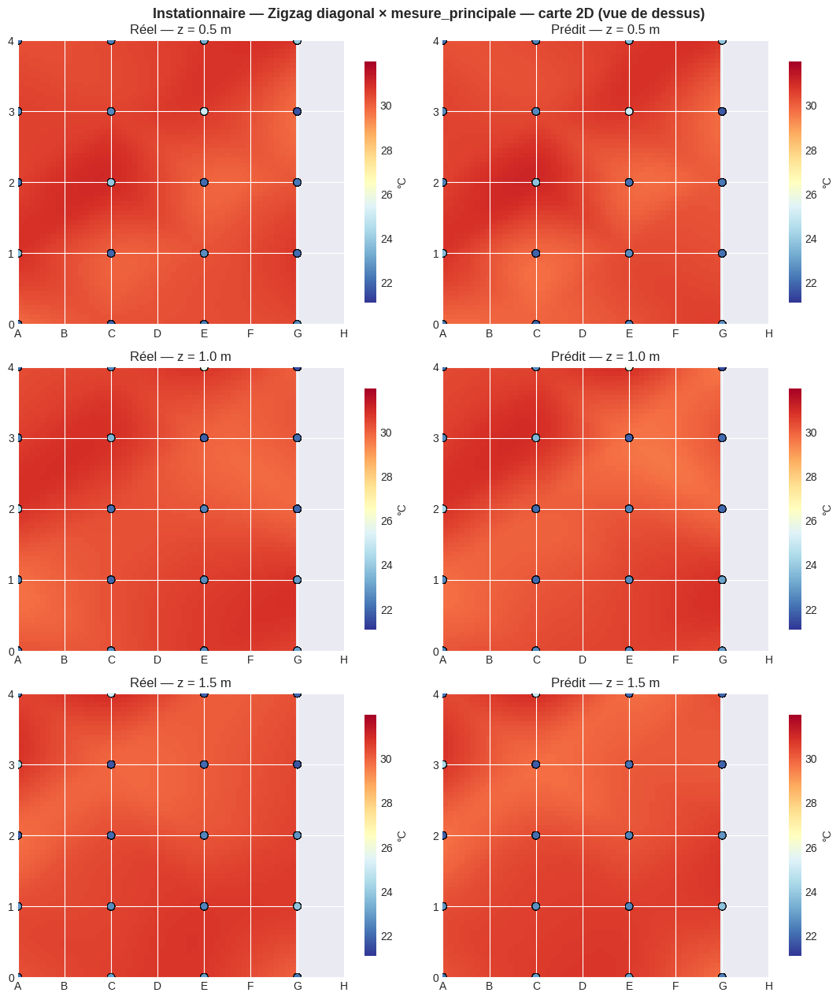

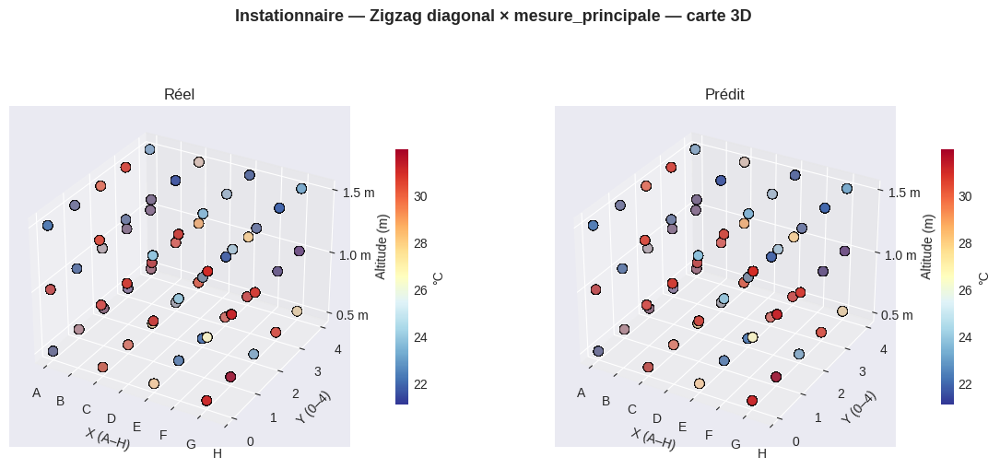

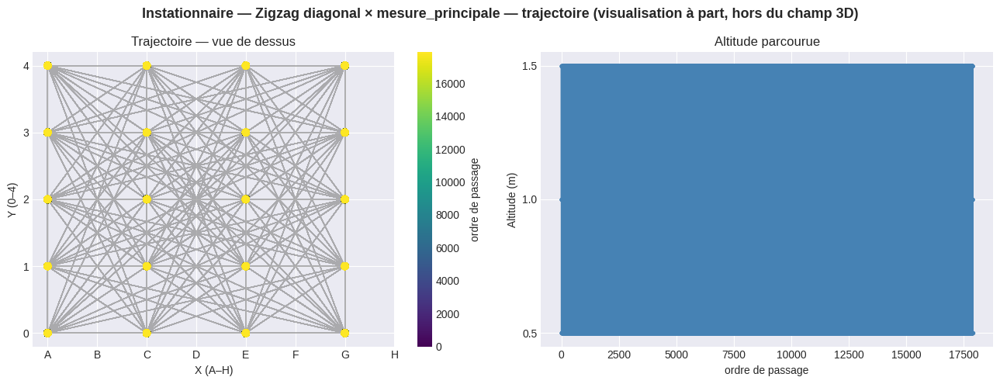

In [41]:
sous_ensembles = sous_ensemble_instationnaire('Zigzag diagonal')
if len(sous_ensembles) == 0:
    print('Instationnaire — Zigzag diagonal : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Instationnaire — Zigzag diagonal × {chauff}', avec_trajectoire=True)

#### Instationnaire — trajectoire : Aléatoire

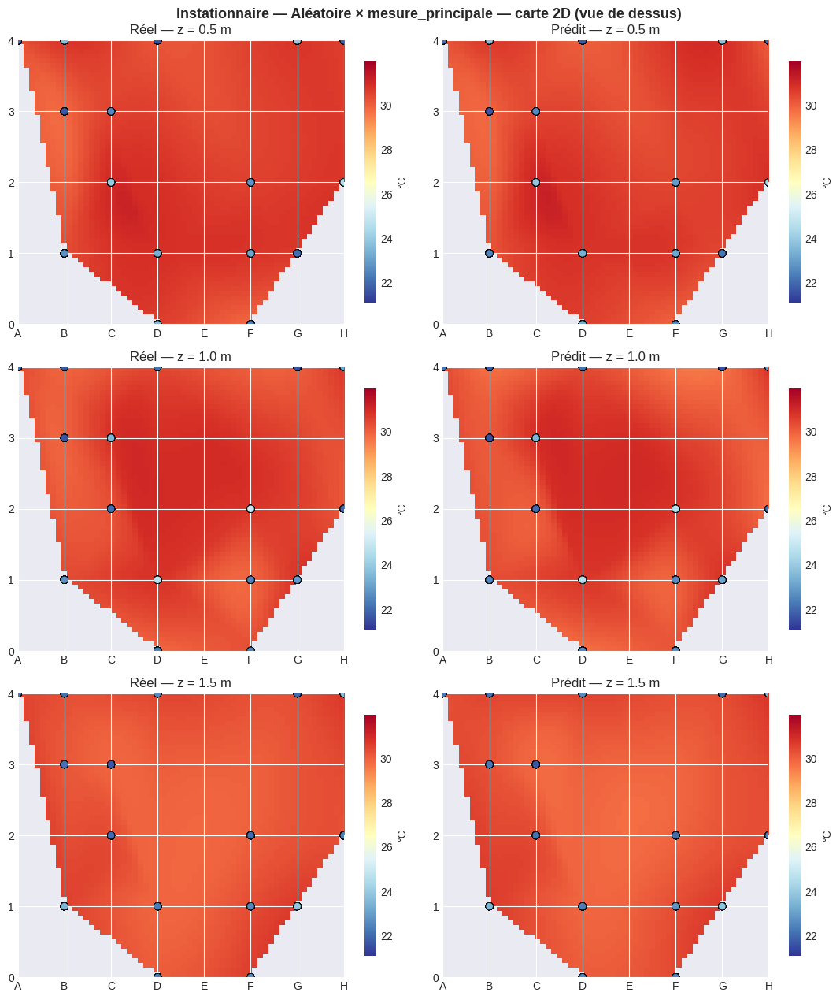

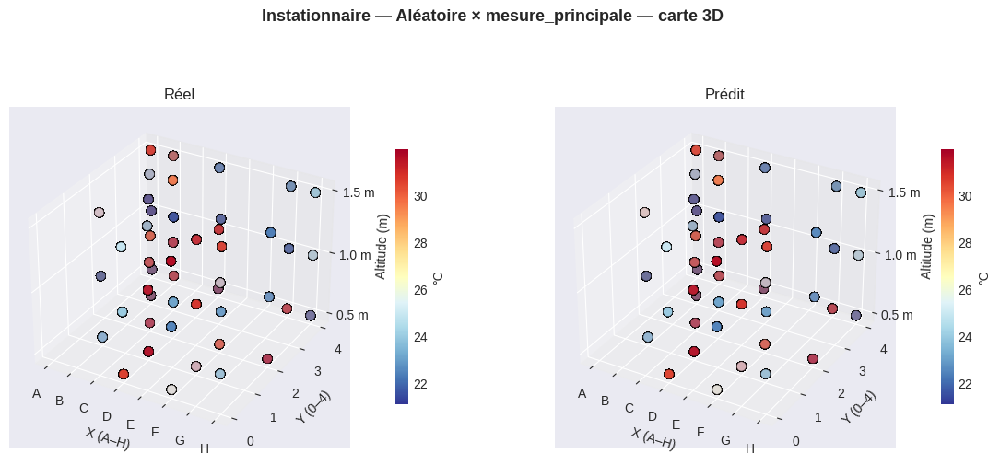

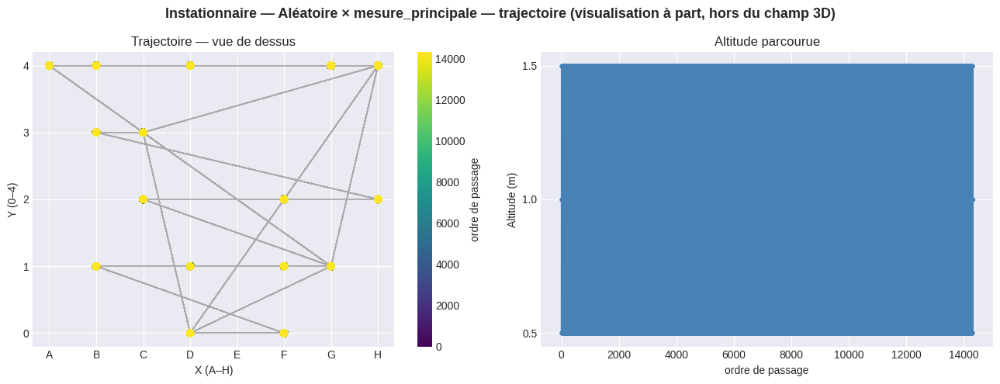

In [42]:
sous_ensembles = sous_ensemble_instationnaire('Aléatoire')
if len(sous_ensembles) == 0:
    print('Instationnaire — Aléatoire : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Instationnaire — Aléatoire × {chauff}', avec_trajectoire=True)

#### Instationnaire — trajectoire : FPS

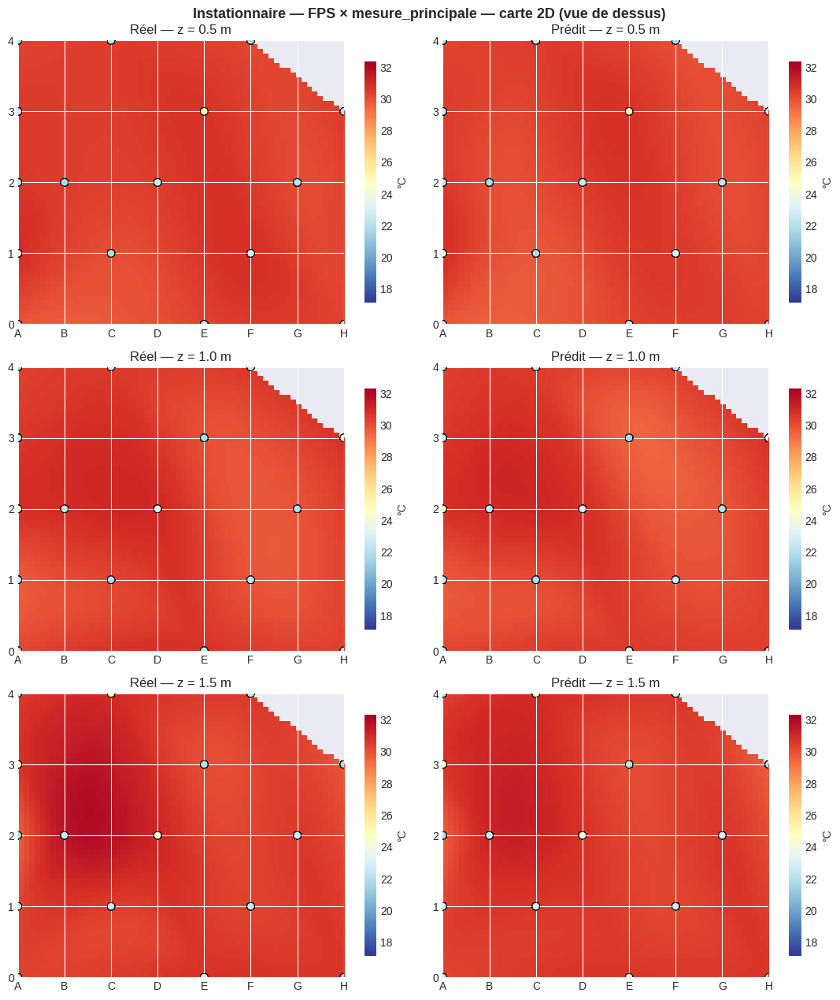

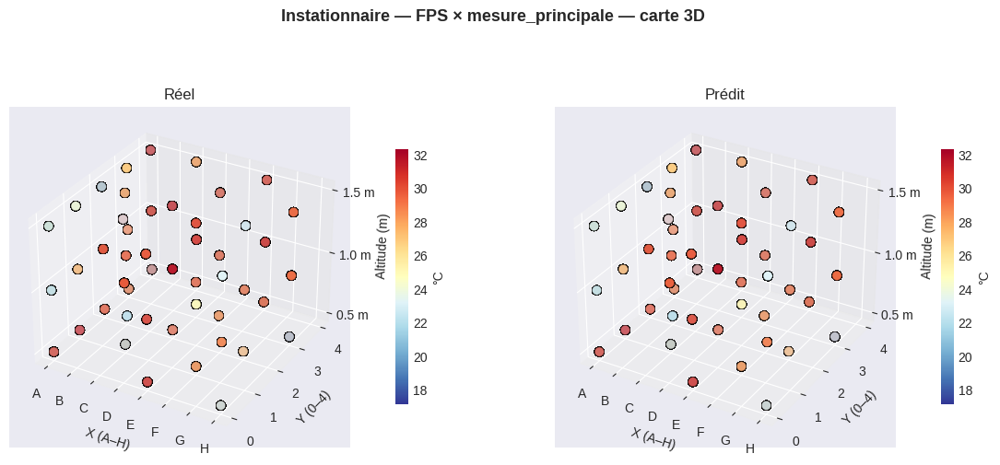

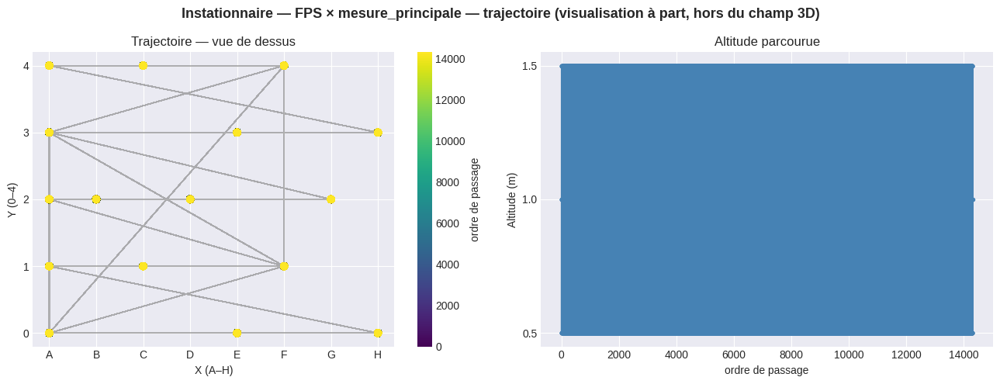

In [43]:
sous_ensembles = sous_ensemble_instationnaire('FPS')
if len(sous_ensembles) == 0:
    print('Instationnaire — FPS : aucune donnée test pour cette combinaison.')
else:
    for chauff, pts in sous_ensembles.items():
        plot_champ_3d(pts, f'Instationnaire — FPS × {chauff}', avec_trajectoire=True)

## 16 — Synthèse

In [44]:
print('SYNTHÈSE — Cas A (trajectoire + chauffage connus comme features) — comparatif ExtraTrees / GaussianProcess')
print('='*78)
if 'comparaison_stat' in globals():
    print('\nModèles comparés (STATIONNAIRE) :', list(comparaison_stat.index))
if 'comparaison_inst' in globals():
    print('Modèles comparés (INSTATIONNAIRE) :', list(comparaison_inst.index))

if 'metrics_stat' in globals():
    nom_modele = NOM_MODELE_STATIONNAIRE if 'NOM_MODELE_STATIONNAIRE' in globals() else 'inconnu'
    print(f"\nStationnaire (interprétation spatiale, modèle retenu : {nom_modele}) : "
          f"RMSE={metrics_stat['rmse']:.3f}°C  "
          f"MAE={metrics_stat['mae']:.3f}°C  MAPE={metrics_stat['mape']:.2f}%  R²={metrics_stat['r2']:.3f}")
if 'metrics_inst' in globals():
    nom_modele_i = NOM_MODELE_INSTATIONNAIRE if 'NOM_MODELE_INSTATIONNAIRE' in globals() else 'inconnu'
    print(f"Instationnaire (point suivant / trajectoire, modèle retenu : {nom_modele_i}) : "
          f"RMSE={metrics_inst['rmse']:.3f}°C  "
          f"MAE={metrics_inst['mae']:.3f}°C  MAPE={metrics_inst['mape']:.2f}%  R²={metrics_inst['r2']:.3f}")

print('\nInterprétation :')
print('- Stationnaire : le modèle généralise dans l\'ESPACE -> capacité à déduire des points')
print('  non mesurés à partir des points mesurés par le robot, à un instant donné.')
print('  Comparatif : ExtraTrees (features géométrie + voisins IDW) et un Gaussian Process spatial')
print('  (position × chauffage, entraîné sur coordonnées réelles) ; le meilleur R² test est')
print('  retenu pour la carte thermique finale.')
print('- Instationnaire : le modèle généralise dans le TEMPS le long de la trajectoire ->')
print('  capacité à prédire le point suivant (~20s plus tard) à partir du point précédent.')
print('  Même comparatif, dont un Gaussian Process (sous-échantillonné si le volume de')
print('  données dépasse', 'GPR_MAX_TRAIN' in globals() and GPR_MAX_TRAIN or 1500, 'lignes).')
print('\nVoir les sections 12/12bis/12ter et 13 pour les tableaux comparatifs complets,')
print('les graphiques en barres (RMSE/MAE/MAPE/R2) et les grilles de parité par modèle.')

SYNTHÈSE — Cas A (trajectoire + chauffage connus comme features) — comparatif ExtraTrees / GaussianProcess

Modèles comparés (STATIONNAIRE) : ['GaussianProcess (spatial)', 'ExtraTrees']
Modèles comparés (INSTATIONNAIRE) : ['ExtraTrees', 'GaussianProcess']

Stationnaire (interprétation spatiale, modèle retenu : GaussianProcess (spatial)) : RMSE=1.123°C  MAE=0.715°C  MAPE=3.01%  R²=-0.099
Instationnaire (point suivant / trajectoire, modèle retenu : ExtraTrees) : RMSE=0.822°C  MAE=0.586°C  MAPE=2.60%  R²=-0.048

Interprétation :
- Stationnaire : le modèle généralise dans l'ESPACE -> capacité à déduire des points
  non mesurés à partir des points mesurés par le robot, à un instant donné.
  Comparatif : ExtraTrees (features géométrie + voisins IDW) et un Gaussian Process spatial
  (position × chauffage, entraîné sur coordonnées réelles) ; le meilleur R² test est
  retenu pour la carte thermique finale.
- Instationnaire : le modèle généralise dans le TEMPS le long de la trajectoire ->
  capa

## 17 — ExtraTrees corrige l'IDW causal (résidu)

**Constat des sections précédentes** : l'IDW causal (section 12bis-causal), qui n'est qu'un
calcul géométrique sans aucun apprentissage, atteint déjà R²=0.88 (stationnaire) et R²=0.95
(instationnaire) — largement au-dessus des modèles ML entraînés sur les features géométriques
statiques (x, y, z, voisins moyennés dans le temps). Ça suggère que le vrai levier n'est pas
le modèle, mais la feature.

**Ce qu'on teste ici** : au lieu d'entraîner ExtraTrees à prédire la température directement,
on l'entraîne à prédire le **résidu** `temperature - idw_causal`, avec `idw_causal` inclus
comme feature d'entrée (en plus des features géométriques). La prédiction finale reconstruite
est `idw_causal + résidu_prédit`. Si le ML apporte quelque chose, le R² final doit dépasser
celui de l'IDW causal seul ; sinon, l'IDW causal capture déjà l'essentiel du signal exploitable.

Même logique de split que dans les sections 12/13 : split **spatial** (positions tenues à
l'écart) en stationnaire, split **chronologique** par séquence (80/20) en instationnaire.

=== stationnaire (41,193 lignes test / 162,981 lignes train) ===
  IDW causal seul                   : R2=-0.4755  RMSE=1.204degC  MAE=0.917degC
  IDW causal + ExtraTrees (residu)  : R2=-0.8225  RMSE=1.338degC  MAE=1.044degC
  -> perte de 0.3470 de R2 grace au ML sur le residu.

Comparatif complet -- stationnaire :


,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
GaussianProcess (spatial),1.1227,0.7149,3.0127,-0.0990
ExtraTrees,1.2754,0.9304,3.9727,-0.4183
IDW causal seul,1.2041,0.9172,4.0274,-0.4755
IDW causal + ExtraTrees (residu),1.3382,1.0436,4.6013,-0.8225


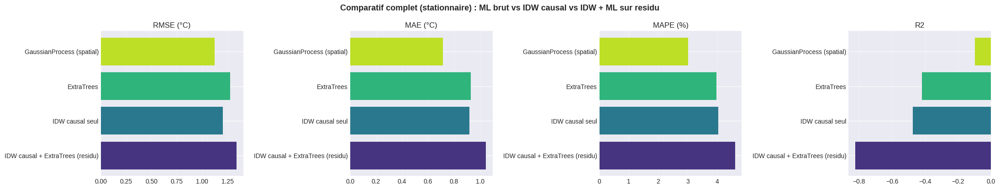


=== instationnaire (20,384 lignes test / 81,532 lignes train) ===
  IDW causal seul                   : R2=-0.5072  RMSE=0.985degC  MAE=0.733degC
  IDW causal + ExtraTrees (residu)  : R2=0.5665  RMSE=0.528degC  MAE=0.408degC
  -> gain de 1.0737 de R2 grace au ML sur le residu.

Comparatif complet -- instationnaire :


,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
IDW causal + ExtraTrees (residu),0.5282,0.4078,1.8079,0.5665
ExtraTrees,0.8216,0.5860,2.5981,-0.0476
IDW causal seul,0.9848,0.7330,3.1877,-0.5072
GaussianProcess,1.6749,1.2082,5.3726,-3.3534


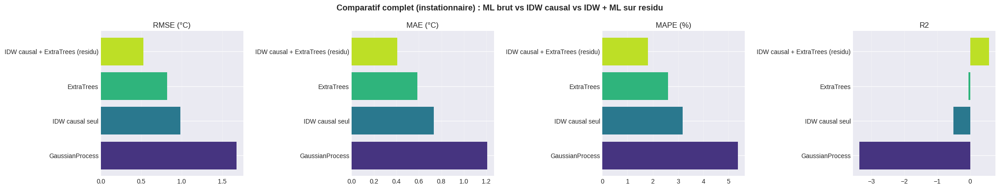


Interpretation :
- Si 'IDW causal + ExtraTrees' depasse nettement 'IDW causal seul', le ML capte
  une structure residuelle utile (ex : effet du type de chauffage sur l'ecart a
  l'IDW) -- ca vaut le coup de garder le ML par-dessus l'interpolation.
- Si le gain est marginal ou negatif, l'IDW causal capture deja l'essentiel du
  signal exploitable : la piste a explorer est d'ameliorer l'IDW lui-meme (plus
  de voisins, k adaptatif, ponderation temporelle) plutot que d'empiler du ML.


In [45]:
if 'df_idw_causal' not in globals():
    print("La section 12bis-causal (idw_causal) doit etre executee avant celle-ci "
          "-> section ignoree.")
else:
    df_residu = df_idw_causal.dropna(subset=['idw_causal']).copy()
    df_residu['residu'] = df_residu['temperature'] - df_residu['idw_causal']

    FEATURES_RESIDU = FEATURES_GEOMETRIE_CVC + FEATURES_CATEGORIELLES + ['idw_causal']

    resultats_residu = {}

    for phase in ['stationnaire', 'instationnaire']:
        sous = df_residu[df_residu['phase'] == phase].reset_index(drop=True)
        if len(sous) < 50:
            print(f"{phase} : pas assez de donnees -> ignore.")
            continue

        if phase == 'stationnaire':
            # Split spatial : positions tenues a l'ecart (meme logique que section 12)
            positions_u = sous[['x', 'y', 'z']].drop_duplicates().values
            rng = np.random.RandomState(42)
            idx_perm = rng.permutation(len(positions_u))
            n_test_pos = max(1, int(0.2 * len(positions_u)))
            pos_test_df = pd.DataFrame(positions_u[idx_perm[:n_test_pos]],
                                        columns=['x', 'y', 'z'])
            pos_test_df['_is_test'] = True
            mask_test = sous.merge(pos_test_df, on=['x', 'y', 'z'],
                                    how='left')['_is_test'].fillna(False).values
        else:
            # Split chronologique par sequence (80/20), meme logique que section 13
            mask_test = np.zeros(len(sous), dtype=bool)
            for _, g in sous.groupby(['trajectory_type', 'heating_type']):
                order_g = g['t_sec'].values.argsort(kind='stable')
                idx_g = g.index.values[order_g]
                split_g = max(1, min(len(idx_g) - 1, int(len(idx_g) * 0.8)))
                mask_test[idx_g[split_g:]] = True

        mask_train = ~mask_test

        X = sous[FEATURES_RESIDU].values.astype(float)
        y_res = sous['residu'].values.astype(float)
        y_temp = sous['temperature'].values.astype(float)
        y_idw = sous['idw_causal'].values.astype(float)

        scaler_r = StandardScaler()
        X_scaled = scaler_r.fit_transform(X)

        Xtr, Xte = X_scaled[mask_train], X_scaled[mask_test]
        ytr_res = y_res[mask_train]
        yte_temp, yte_idw = y_temp[mask_test], y_idw[mask_test]

        modele_res = ExtraTreesRegressor(n_estimators=300, max_depth=20, min_samples_leaf=2,
                                          random_state=42, n_jobs=-1)
        modele_res.fit(Xtr, ytr_res)
        pred_res = modele_res.predict(Xte)
        pred_final = yte_idw + pred_res

        m_idw_seul = calculer_metriques(yte_temp, yte_idw)
        m_final = calculer_metriques(yte_temp, pred_final)
        resultats_residu[phase] = {'IDW causal seul': m_idw_seul,
                                    'IDW causal + ExtraTrees (residu)': m_final}

        print(f"=== {phase} ({mask_test.sum():,} lignes test / {mask_train.sum():,} lignes train) ===")
        print(f"  IDW causal seul                   : R2={m_idw_seul['r2']:.4f}  "
              f"RMSE={m_idw_seul['rmse']:.3f}degC  MAE={m_idw_seul['mae']:.3f}degC")
        print(f"  IDW causal + ExtraTrees (residu)  : R2={m_final['r2']:.4f}  "
              f"RMSE={m_final['rmse']:.3f}degC  MAE={m_final['mae']:.3f}degC")
        gain = m_final['r2'] - m_idw_seul['r2']
        print(f"  -> {'gain' if gain >= 0 else 'perte'} de {abs(gain):.4f} de R2 grace au ML sur le residu.")

        # Comparatif complet avec les modeles ML "bruts" des sections 12/13, si disponibles
        combo = {}
        if phase == 'stationnaire' and 'metriques_stat_tous' in globals():
            combo.update(metriques_stat_tous)
        elif phase == 'instationnaire' and 'metriques_inst_tous' in globals():
            combo.update(metriques_inst_tous)
        combo.update(resultats_residu[phase])

        df_comp_final = tableau_comparatif(combo)
        print(f"\nComparatif complet -- {phase} :")
        display(df_comp_final.round(4))
        barres_comparatif(df_comp_final, f"Comparatif complet ({phase}) : "
                                          f"ML brut vs IDW causal vs IDW + ML sur residu")
        print()

    if len(resultats_residu) > 0:
        print("Interpretation :")
        print("- Si 'IDW causal + ExtraTrees' depasse nettement 'IDW causal seul', le ML capte")
        print("  une structure residuelle utile (ex : effet du type de chauffage sur l'ecart a")
        print("  l'IDW) -- ca vaut le coup de garder le ML par-dessus l'interpolation.")
        print("- Si le gain est marginal ou negatif, l'IDW causal capture deja l'essentiel du")
        print("  signal exploitable : la piste a explorer est d'ameliorer l'IDW lui-meme (plus")
        print("  de voisins, k adaptatif, ponderation temporelle) plutot que d'empiler du ML.")


## 17bis — Importance de `direction_encode` et ablation (avec vs sans)

La section 17 injecte `direction_encode` dans `FEATURES_RESIDU`, mais l'injecter ne
prouve rien en soi : ExtraTrees peut tres bien lui donner un poids nul. Cette section
ajoute le controle qui manquait :

1. **`feature_importances_`** du ExtraTrees entraine sur le residu (section 17), pour
   voir le rang et le poids reel de `direction_encode` parmi toutes les features.
2. **Ablation** : le meme modele est reentraine sur exactement le meme split
   train/test, une fois *avec* `direction_encode`, une fois *sans* -- seule cette
   feature change. L'ecart de R2/RMSE/MAE entre les deux isole precisement son effet,
   sans qu'aucune autre difference de protocole ne vienne polluer la comparaison.


=== stationnaire : feature_importances_ (ExtraTrees sur le residu) ===
  idw_causal                       0.3540
  dist_center                      0.1178
  y                                0.0885
  dist_chaud                       0.0808
  influence_chaud                  0.0751
  dist_edge_x                      0.0618
  z                                0.0554
  x                                0.0506
  dist_edge_y                      0.0496
  dist_edge_z                      0.0440
  traj_Aléatoire                   0.0125
  traj_Zigzag diagonal             0.0043
  traj_Serpentine (mesurée)        0.0029
  traj_FPS                         0.0020
  traj_Périmètre                   0.0008
  influence_froid                  0.0000
  dist_froid                       0.0000
  chaud_diffusion_verticale        0.0000
  froid_diffusion_verticale        0.0000
  chauff_mesure_principale         0.0000
  direction_encode                 0.0000  <-- direction_encode
  -> direction_encode : r

,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
avec direction_encode,1.3382,1.0436,4.6013,-0.8225
sans direction_encode,1.3457,1.0482,4.6217,-0.8429


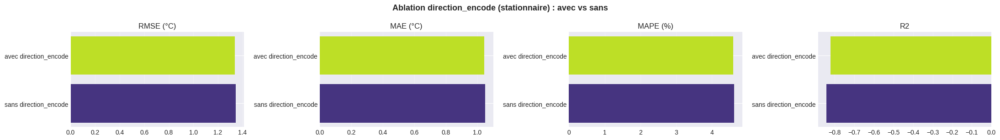


=== instationnaire : feature_importances_ (ExtraTrees sur le residu) ===
  dist_center                      0.1556
  influence_chaud                  0.1369
  dist_chaud                       0.1361
  idw_causal                       0.1297
  y                                0.1010
  z                                0.0746
  dist_edge_y                      0.0713
  x                                0.0669
  dist_edge_x                      0.0616
  dist_edge_z                      0.0433
  traj_Aléatoire                   0.0077
  traj_Zigzag diagonal             0.0065
  traj_Serpentine (mesurée)        0.0043
  traj_FPS                         0.0039
  traj_Périmètre                   0.0006
  influence_froid                  0.0000
  dist_froid                       0.0000
  chaud_diffusion_verticale        0.0000
  froid_diffusion_verticale        0.0000
  chauff_mesure_principale         0.0000
  direction_encode                 0.0000  <-- direction_encode
  -> direction_encode 

,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
avec direction_encode,0.5282,0.4078,1.8079,0.5665
sans direction_encode,0.5282,0.4074,1.8065,0.5664


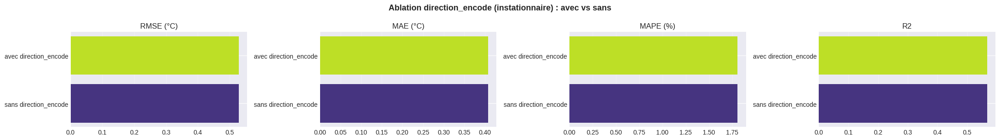


Interpretation :
- Un gain de R2 net (et un rang eleve dans feature_importances_) confirme que
  l'aller/retour porte une information reelle (biais directionnel du capteur ou
  du robot) que le modele exploite.
- Un gain proche de zero (ou une importance quasi nulle) indique que, sur ce jeu
  de donnees, l'aller/retour n'apporte rien de mesurable au-dela de ce que
  x/y/z/trajectoire/chauffage/idw_causal captent deja -- la feature peut alors
  etre retiree sans perte, ou conservee en l'etat en attendant plus de donnees
  (notamment si direction_encode etait quasi constante, voir diagnostic section 11).


In [46]:
if 'df_idw_causal' not in globals():
    print("La section 12bis-causal (idw_causal) doit etre executee avant celle-ci "
          "-> section ignoree.")
elif 'direction_encode' not in FEATURES_RESIDU:
    print("'direction_encode' n'est pas dans FEATURES_RESIDU -> rien a mesurer ici "
          "(reexecuter la section 11 corrigee, puis la section 17, avant celle-ci).")
else:
    FEATURES_SANS_DIRECTION = [f for f in FEATURES_RESIDU if f != 'direction_encode']

    resultats_ablation_direction = {}
    importances_direction = {}

    for phase in ['stationnaire', 'instationnaire']:
        sous = df_residu[df_residu['phase'] == phase].reset_index(drop=True)
        if len(sous) < 50:
            print(f"{phase} : pas assez de donnees -> ignore.")
            continue

        # Split identique a la section 17 (meme seed, meme logique), pour que la
        # comparaison avec/sans direction porte uniquement sur la feature en moins.
        if phase == 'stationnaire':
            positions_u = sous[['x', 'y', 'z']].drop_duplicates().values
            rng = np.random.RandomState(42)
            idx_perm = rng.permutation(len(positions_u))
            n_test_pos = max(1, int(0.2 * len(positions_u)))
            pos_test_df = pd.DataFrame(positions_u[idx_perm[:n_test_pos]],
                                        columns=['x', 'y', 'z'])
            pos_test_df['_is_test'] = True
            mask_test = sous.merge(pos_test_df, on=['x', 'y', 'z'],
                                    how='left')['_is_test'].fillna(False).values
        else:
            mask_test = np.zeros(len(sous), dtype=bool)
            for _, g in sous.groupby(['trajectory_type', 'heating_type']):
                order_g = g['t_sec'].values.argsort(kind='stable')
                idx_g = g.index.values[order_g]
                split_g = max(1, min(len(idx_g) - 1, int(len(idx_g) * 0.8)))
                mask_test[idx_g[split_g:]] = True
        mask_train = ~mask_test

        y_res = sous['residu'].values.astype(float)
        y_temp = sous['temperature'].values.astype(float)
        y_idw = sous['idw_causal'].values.astype(float)
        yte_temp, yte_idw = y_temp[mask_test], y_idw[mask_test]

        resultats_phase = {}
        for label, features_set in [('avec direction_encode', FEATURES_RESIDU),
                                     ('sans direction_encode', FEATURES_SANS_DIRECTION)]:
            X = sous[features_set].values.astype(float)
            scaler_a = StandardScaler()
            X_scaled = scaler_a.fit_transform(X)
            Xtr, Xte = X_scaled[mask_train], X_scaled[mask_test]
            ytr_res = y_res[mask_train]

            modele_a = ExtraTreesRegressor(n_estimators=300, max_depth=20, min_samples_leaf=2,
                                            random_state=42, n_jobs=-1)
            modele_a.fit(Xtr, ytr_res)
            pred_final = yte_idw + modele_a.predict(Xte)
            resultats_phase[label] = calculer_metriques(yte_temp, pred_final)

            if label == 'avec direction_encode':
                importances_direction[phase] = pd.Series(
                    modele_a.feature_importances_, index=features_set
                ).sort_values(ascending=False)

        resultats_ablation_direction[phase] = resultats_phase

        print(f"=== {phase} : feature_importances_ (ExtraTrees sur le residu) ===")
        imp = importances_direction[phase]
        for feat, val in imp.items():
            marqueur = "  <-- direction_encode" if feat == 'direction_encode' else ""
            print(f"  {feat:32s} {val:.4f}{marqueur}")
        rang = list(imp.index).index('direction_encode') + 1
        print(f"  -> direction_encode : rang {rang}/{len(imp)}, "
              f"importance = {imp['direction_encode']:.4f} "
              f"({imp['direction_encode'] / imp.sum() * 100:.1f}% du total)")

        print(f"\n=== {phase} : ablation avec vs sans direction_encode (meme split) ===")
        m_avec = resultats_phase['avec direction_encode']
        m_sans = resultats_phase['sans direction_encode']
        print(f"  avec direction_encode : R2={m_avec['r2']:.4f}  RMSE={m_avec['rmse']:.3f}degC  MAE={m_avec['mae']:.3f}degC")
        print(f"  sans direction_encode : R2={m_sans['r2']:.4f}  RMSE={m_sans['rmse']:.3f}degC  MAE={m_sans['mae']:.3f}degC")
        gain_r2 = m_avec['r2'] - m_sans['r2']
        gain_rmse = m_sans['rmse'] - m_avec['rmse']
        print(f"  -> {'gain' if gain_r2 >= 0 else 'perte'} de {abs(gain_r2):.4f} de R2 "
              f"et {'baisse' if gain_rmse >= 0 else 'hausse'} de {abs(gain_rmse):.3f}degC de RMSE "
              f"en ajoutant direction_encode.")

        df_comp_ablation = tableau_comparatif(resultats_phase)
        print(f"\nComparatif -- {phase} :")
        display(df_comp_ablation.round(4))
        barres_comparatif(df_comp_ablation, f"Ablation direction_encode ({phase}) : avec vs sans")
        print()

    if len(resultats_ablation_direction) > 0:
        print("Interpretation :")
        print("- Un gain de R2 net (et un rang eleve dans feature_importances_) confirme que")
        print("  l'aller/retour porte une information reelle (biais directionnel du capteur ou")
        print("  du robot) que le modele exploite.")
        print("- Un gain proche de zero (ou une importance quasi nulle) indique que, sur ce jeu")
        print("  de donnees, l'aller/retour n'apporte rien de mesurable au-dela de ce que")
        print("  x/y/z/trajectoire/chauffage/idw_causal captent deja -- la feature peut alors")
        print("  etre retiree sans perte, ou conservee en l'etat en attendant plus de donnees")
        print("  (notamment si direction_encode etait quasi constante, voir diagnostic section 11).")


## 18 — Visualisations par combinaison chauffage × trajectoire × régime

Pour chaque combinaison présente dans les données, une figure à 3 panneaux :
1. **Vue 2D** (x, y) : température moyenne interpolée, vue du dessus.
2. **Vue 3D** : positions des capteurs colorées par température moyenne.
3. **Réel vs prédit** : température moyenne réelle vs **sortie du modèle combiné ExtraTrees + IDW causal** (section 14bis, interpolation complète), au fil du temps -- l'IDW causal seul est gardé en ligne pointillée fine à titre de référence.

10 combinaison(s) chauffage x trajectoire x regime trouvee(s).


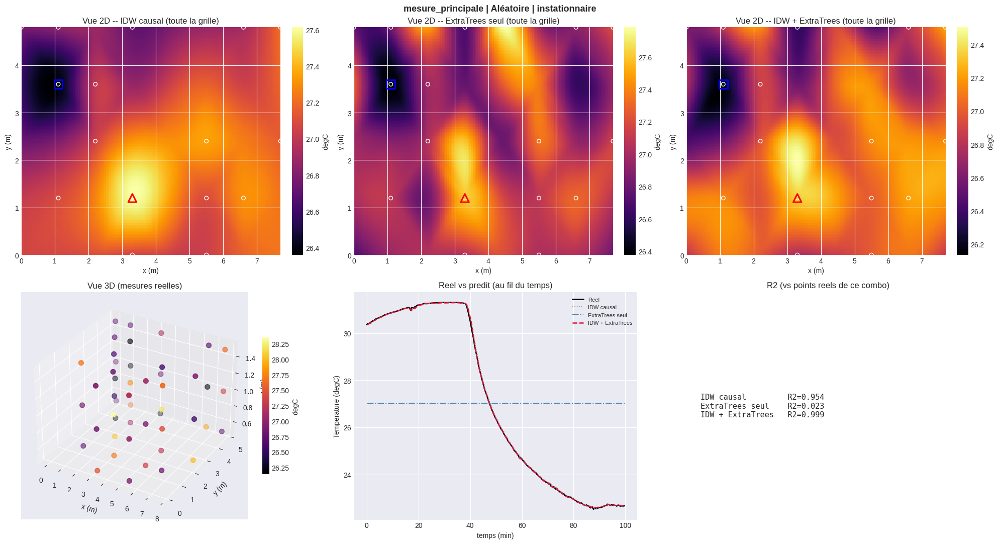

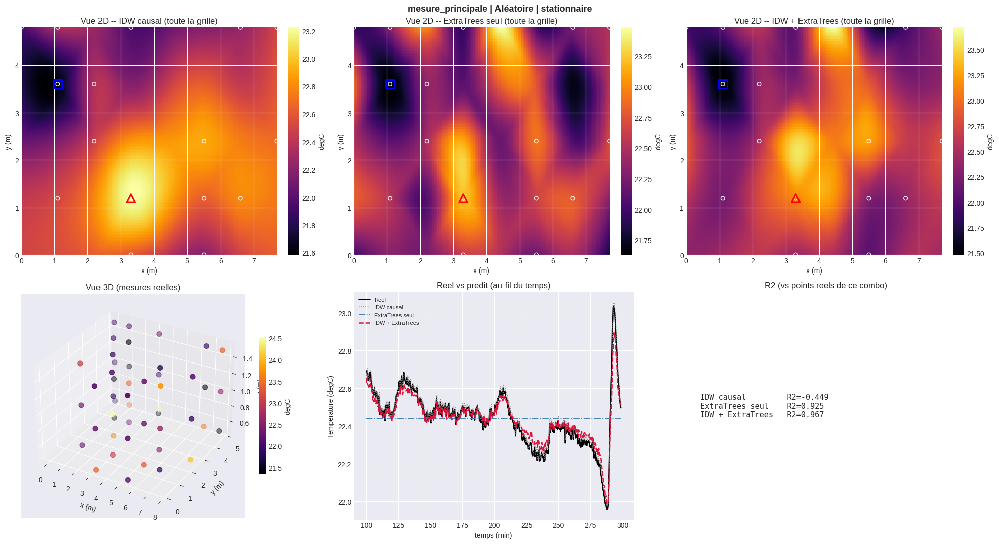

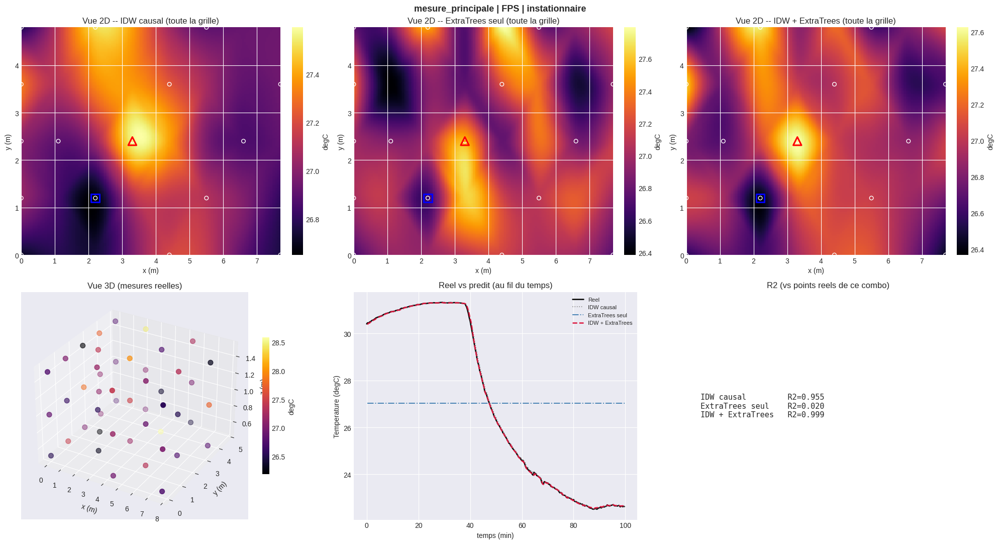

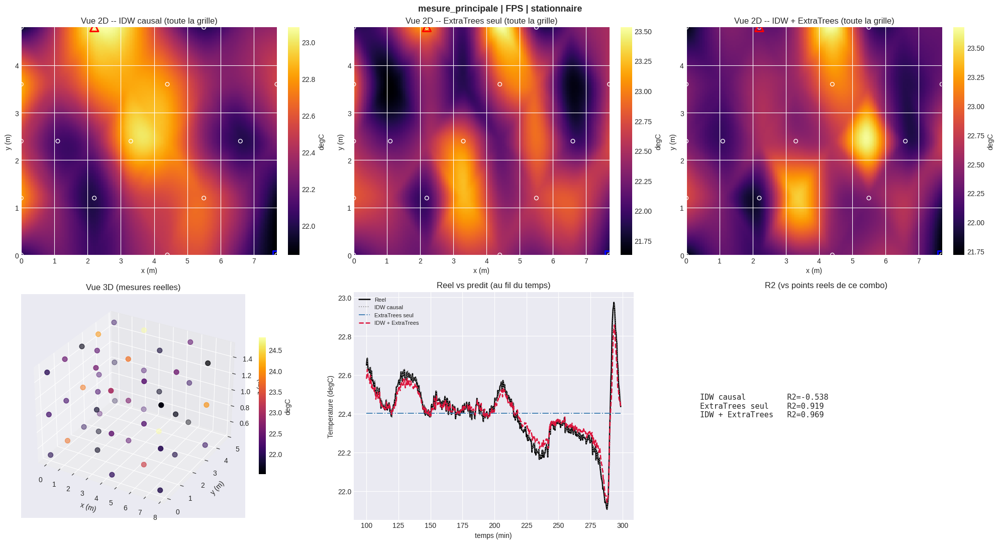

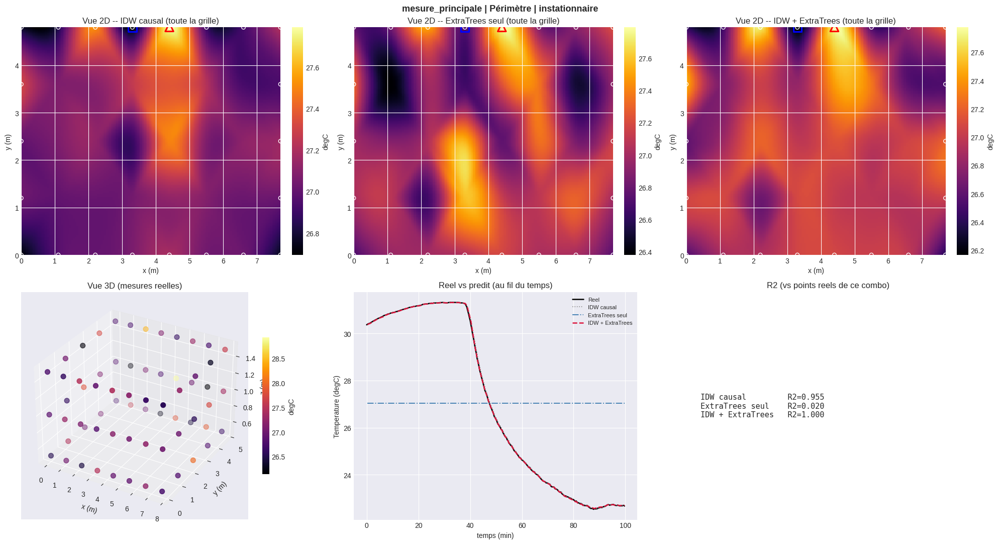

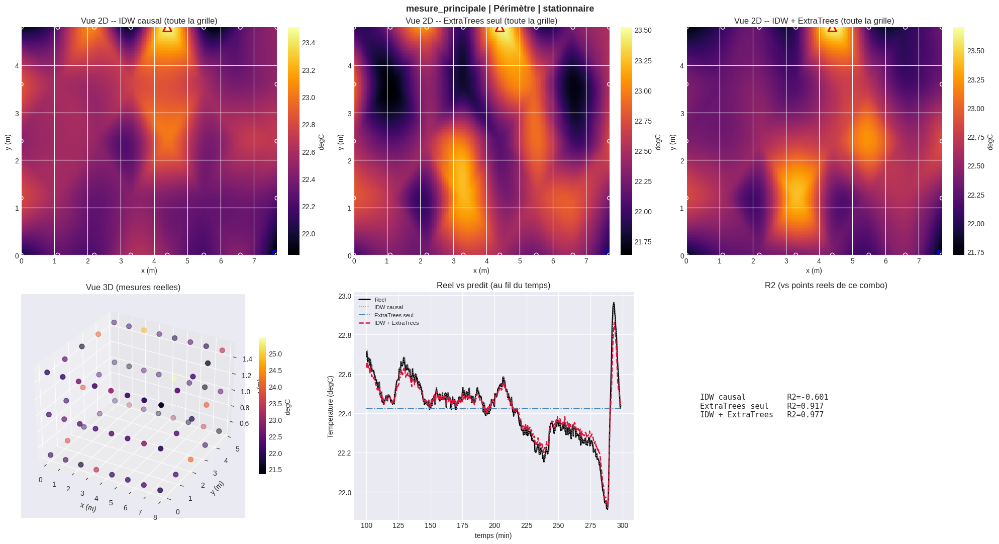

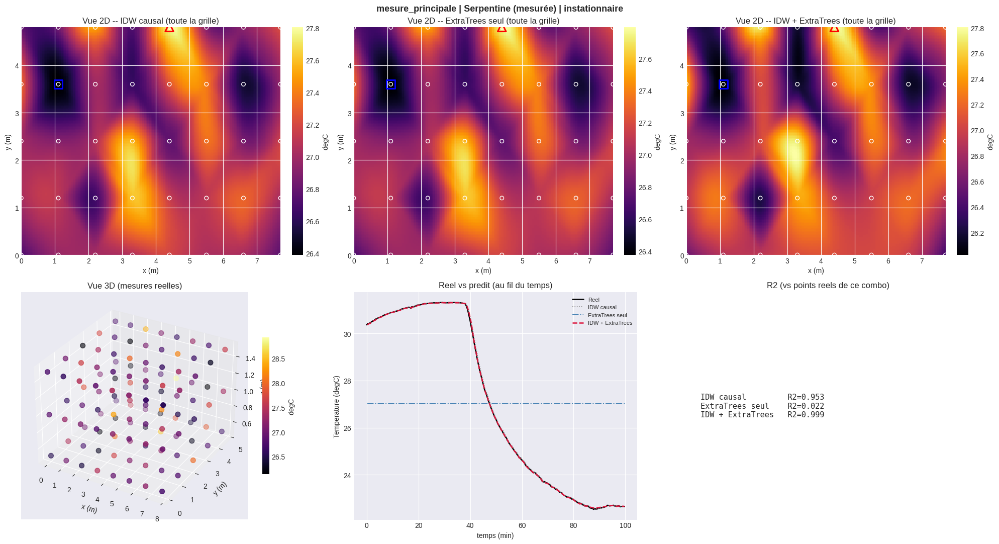

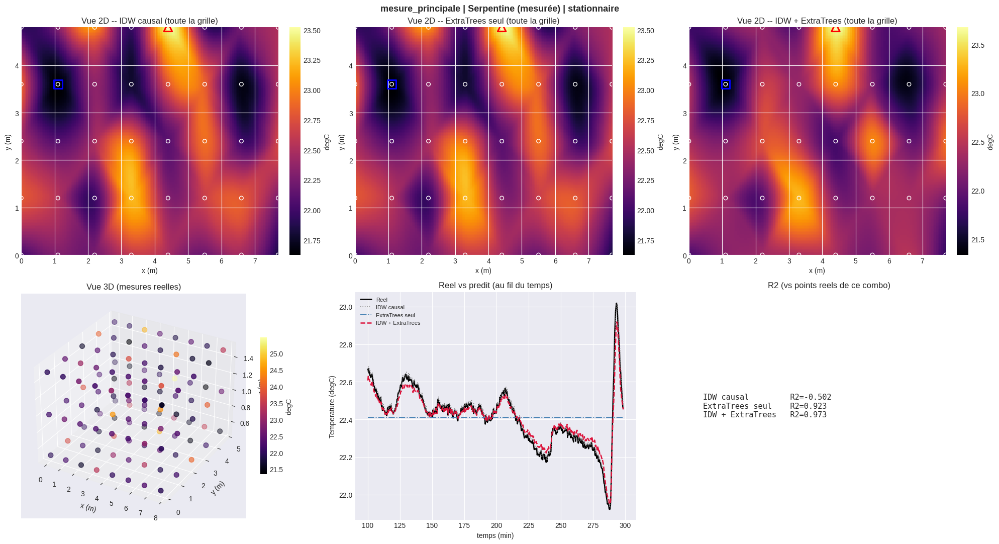

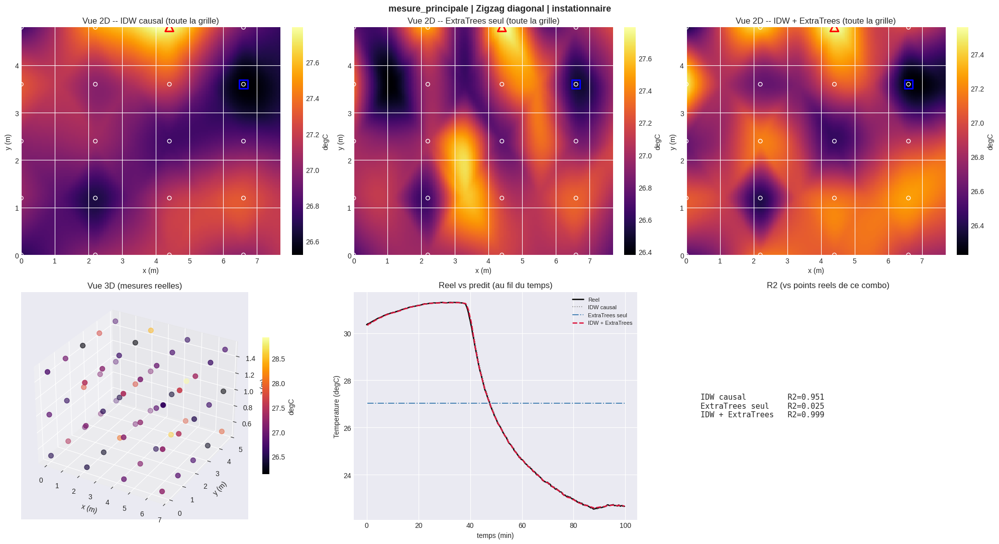

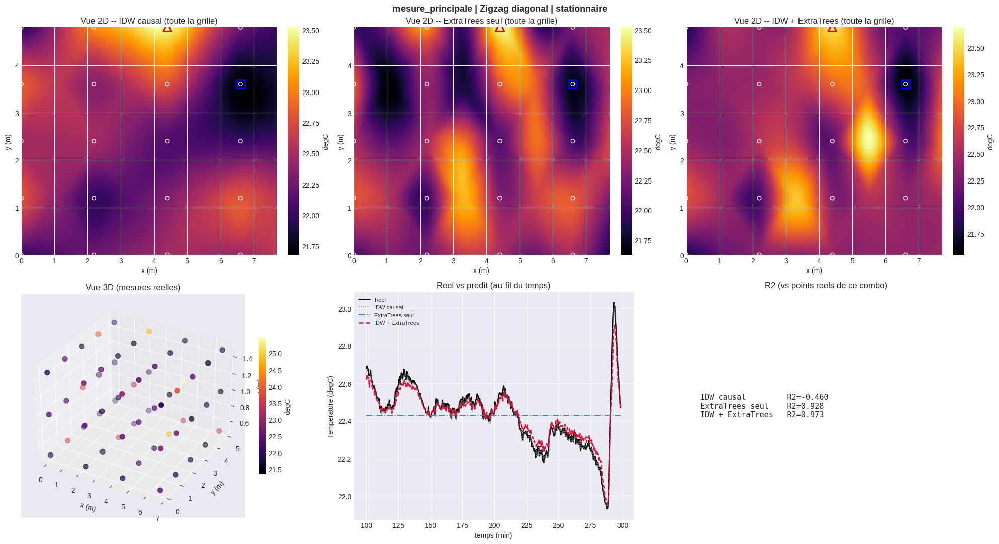

In [47]:
from mpl_toolkits.mplot3d import Axes3D
from scipy.interpolate import griddata
from scipy.spatial.distance import cdist

MAX_COMBOS_AFFICHES = None  # mets un nombre (ex: 12) pour limiter si trop de figures


def _idw_spatial(coords_connues, valeurs_connues, coords_cibles, k=6, epsilon=1e-6):
    """IDW purement spatial (pas de contrainte causale/temporelle) : interpole une valeur
    a n'importe quelle position cible a partir des positions/valeurs deja moyennees
    disponibles pour ce sous-ensemble -- sert a etendre idw_causal a TOUTE la grille,
    y compris les positions jamais visitees par cette trajectoire precise."""
    if len(coords_connues) == 0:
        return np.full(len(coords_cibles), np.nan)
    d = cdist(coords_cibles, coords_connues)
    d[d < epsilon] = epsilon
    k_eff = min(k, d.shape[1])
    idx_proches = np.argsort(d, axis=1)[:, :k_eff]
    out = np.empty(len(coords_cibles))
    for i in range(len(coords_cibles)):
        idx_i = idx_proches[i]
        w = 1.0 / d[i, idx_i]
        out[i] = np.sum(w * valeurs_connues[idx_i]) / np.sum(w)
    return out


def predire_grille_complete(chauff, traj, phase, sous, methode='combine'):
    """Prediction sur TOUTE la grille de positions (x,y,z) de la piece -- y compris les
    positions jamais mesurees par CETTE trajectoire precise (donc aucune zone blanche,
    contrairement a griddata seul qui se limite a l'enveloppe convexe des points mesures).
    methode :
      - 'idw'        : IDW causal seul, etendu spatialement (section 12bis-causal)
      - 'extratrees' : ExtraTrees seul, entraine directement sur la temperature (section 14bis)
      - 'combine'    : idw_causal + residu ExtraTrees (section 14bis) -- le plus complet
    """
    if 'df_fusion' not in globals() or 'FEATURES_GEOMETRIE_CVC' not in globals():
        return None
    colonnes_geo = [c for c in FEATURES_GEOMETRIE_CVC if c in df_fusion.columns]
    if not {'x', 'y', 'z'}.issubset(colonnes_geo) or len(colonnes_geo) < len(FEATURES_GEOMETRIE_CVC):
        return None

    # df_fusion porte deja toutes les features geometriques/CVC (section 10) pour TOUTES
    # les positions (x,y,z) vues sur TOUTES les trajectoires confondues -- donc la grille
    # complete de la piece, pas seulement celles visitees par la trajectoire "traj" en cours.
    grille = df_fusion[colonnes_geo].drop_duplicates(subset=['x', 'y', 'z']).reset_index(drop=True).copy()

    agg_mesure = sous.groupby(['x', 'y', 'z'])['temperature'].mean().reset_index()
    if len(agg_mesure) == 0:
        return None

    def _coords_m(d):
        c = d[['x', 'y', 'z']].values.astype(float).copy()
        c[:, 0] *= ESPACEMENT_X
        c[:, 1] *= ESPACEMENT_Y
        c[:, 2] = [ALTITUDES_Z[int(z)] for z in d['z']]
        return c

    coords_connues = _coords_m(agg_mesure)
    coords_cibles = _coords_m(grille)
    grille['idw_causal'] = _idw_spatial(coords_connues, agg_mesure['temperature'].values, coords_cibles)
    if grille['idw_causal'].isna().any():
        grille['idw_causal'] = grille['idw_causal'].fillna(agg_mesure['temperature'].mean())

    if methode == 'idw':
        grille['predit'] = grille['idw_causal']
        return grille[['x', 'y', 'z', 'predit']]

    for col in FEATURES_CATEGORIELLES:
        if col == 'direction_encode':
            grille[col] = sous['direction_encode'].mean() if 'direction_encode' in sous.columns else 0.5
        elif col.startswith('traj_'):
            grille[col] = 1.0 if col == f'traj_{traj}' else 0.0
        elif col.startswith('chauff_'):
            grille[col] = 1.0 if col == f'chauff_{chauff}' else 0.0
        elif col not in grille.columns:
            grille[col] = 0.0

    if methode == 'extratrees':
        if 'modeles_extratrees_seul' not in globals() or phase not in modeles_extratrees_seul:
            return None
        infos = modeles_extratrees_seul[phase]
        X_grille = grille[infos['features']].values.astype(float)
        grille['predit'] = infos['modele'].predict(infos['scaler'].transform(X_grille))
        return grille[['x', 'y', 'z', 'predit']]

    # methode == 'combine' (par defaut)
    if 'modeles_extratrees_idw' not in globals() or phase not in modeles_extratrees_idw:
        return None
    infos = modeles_extratrees_idw[phase]
    X_grille = grille[infos['features']].values.astype(float)
    grille['predit'] = grille['idw_causal'] + infos['modele'].predict(infos['scaler'].transform(X_grille))
    return grille[['x', 'y', 'z', 'predit']]


def _dessiner_vue_2d(ax, grille_pred, sous, titre):
    """Vue 2D lisse (griddata cubic) d'une grille DEJA complete (donc plus de trou possible),
    avec les points reellement mesures superposes (cercles blancs) et le point le plus
    chaud (triangle rouge) / le plus froid (carre bleu) parmi ces points reels."""
    if grille_pred is None:
        ax.text(0.5, 0.5, 'modele indisponible', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(titre)
        return
    agg_xy_pred = grille_pred.groupby(['x', 'y'])['predit'].mean().reset_index()
    xs_m = agg_xy_pred['x'].values * ESPACEMENT_X
    ys_m = agg_xy_pred['y'].values * ESPACEMENT_Y
    ts_xy = agg_xy_pred['predit'].values
    grid_x, grid_y = np.mgrid[xs_m.min():xs_m.max():150j, ys_m.min():ys_m.max():150j]
    grid_t = griddata((xs_m, ys_m), ts_xy, (grid_x, grid_y), method='cubic')
    im = ax.imshow(grid_t.T, extent=(xs_m.min(), xs_m.max(), ys_m.min(), ys_m.max()),
                    origin='lower', cmap='inferno', aspect='auto')
    plt.colorbar(im, ax=ax, label='degC', fraction=0.046, pad=0.04)

    agg_xy_mesure = sous.groupby(['x', 'y'])['temperature'].mean().reset_index()
    ax.scatter(agg_xy_mesure['x'] * ESPACEMENT_X, agg_xy_mesure['y'] * ESPACEMENT_Y,
               facecolors='none', edgecolors='white', s=30, linewidths=1.0, zorder=5,
               label='Points mesures')
    if len(agg_xy_mesure) > 0:
        i_chaud = agg_xy_mesure['temperature'].idxmax()
        i_froid = agg_xy_mesure['temperature'].idxmin()
        ax.scatter(agg_xy_mesure.loc[i_chaud, 'x'] * ESPACEMENT_X,
                   agg_xy_mesure.loc[i_chaud, 'y'] * ESPACEMENT_Y,
                   marker='^', s=140, facecolors='none', edgecolors='red', linewidths=2.2, zorder=6)
        ax.scatter(agg_xy_mesure.loc[i_froid, 'x'] * ESPACEMENT_X,
                   agg_xy_mesure.loc[i_froid, 'y'] * ESPACEMENT_Y,
                   marker='s', s=140, facecolors='none', edgecolors='blue', linewidths=2.2, zorder=6)
    ax.set_title(titre)
    ax.set_xlabel('x (m)'); ax.set_ylabel('y (m)')


source_viz = df_idw_causal if 'df_idw_causal' in globals() else df_fusion

# Predictions "pleine grille" (section 14bis) rattachees a source_viz pour les courbes
# de comparaison ci-dessous (idw seul / ExtraTrees seul / combine).
df_pred_c = None
for _df in (globals().get('df_extratrees_idw_stationnaire'),
            globals().get('df_extratrees_idw_instationnaire')):
    if _df is not None:
        df_pred_c = _df if df_pred_c is None else pd.concat([df_pred_c, _df], ignore_index=True)
df_pred_s = None
for _df in (globals().get('df_extratrees_seul_stationnaire'),
            globals().get('df_extratrees_seul_instationnaire')):
    if _df is not None:
        df_pred_s = _df if df_pred_s is None else pd.concat([df_pred_s, _df], ignore_index=True)

cle_merge = ['x', 'y', 'z', 'trajectory_type', 'heating_type', 'phase']
if df_pred_c is not None:
    cle_c = cle_merge + (['t_sec'] if 't_sec' in df_pred_c.columns and 't_sec' in source_viz.columns else [])
    source_viz = source_viz.merge(
        df_pred_c[cle_c + ['predit']].rename(columns={'predit': 'predit_combine'}),
        on=cle_c, how='left')
if df_pred_s is not None:
    cle_s = cle_merge + (['t_sec'] if 't_sec' in df_pred_s.columns and 't_sec' in source_viz.columns else [])
    source_viz = source_viz.merge(
        df_pred_s[cle_s + ['predit']].rename(columns={'predit': 'predit_extratrees_seul'}),
        on=cle_s, how='left')

combos = source_viz[['heating_type', 'trajectory_type', 'phase']].drop_duplicates().values.tolist()
print(f"{len(combos)} combinaison(s) chauffage x trajectoire x regime trouvee(s).")

if MAX_COMBOS_AFFICHES:
    combos = combos[:MAX_COMBOS_AFFICHES]

for chauff, traj, phase in combos:
    sous = source_viz[(source_viz['heating_type'] == chauff) &
                       (source_viz['trajectory_type'] == traj) &
                       (source_viz['phase'] == phase)]
    if len(sous) < 5:
        continue

    fig = plt.figure(figsize=(20, 11))

    # --- Ligne 1 : trois cartes 2D pleine-grille (aucune zone blanche), une par methode ---
    grille_idw = predire_grille_complete(chauff, traj, phase, sous, methode='idw')
    grille_et = predire_grille_complete(chauff, traj, phase, sous, methode='extratrees')
    grille_combine = predire_grille_complete(chauff, traj, phase, sous, methode='combine')

    ax1 = fig.add_subplot(2, 3, 1)
    _dessiner_vue_2d(ax1, grille_idw, sous, 'Vue 2D -- IDW causal (toute la grille)')
    ax2 = fig.add_subplot(2, 3, 2)
    _dessiner_vue_2d(ax2, grille_et, sous, 'Vue 2D -- ExtraTrees seul (toute la grille)')
    ax3 = fig.add_subplot(2, 3, 3)
    _dessiner_vue_2d(ax3, grille_combine, sous, 'Vue 2D -- IDW + ExtraTrees (toute la grille)')

    # --- Ligne 2, colonne 1 : Vue 3D (points reellement mesures) ---
    ax4 = fig.add_subplot(2, 3, 4, projection='3d')
    agg_xyz = sous.groupby(['x', 'y', 'z'])['temperature'].mean().reset_index()
    xs3 = agg_xyz['x'].values * ESPACEMENT_X
    ys3 = agg_xyz['y'].values * ESPACEMENT_Y
    zs3 = agg_xyz['z'].map(lambda z: ALTITUDES_Z[int(z)]).values
    sc = ax4.scatter(xs3, ys3, zs3, c=agg_xyz['temperature'].values, cmap='inferno', s=50)
    fig.colorbar(sc, ax=ax4, label='degC', shrink=0.6)
    ax4.set_title('Vue 3D (mesures reelles)')
    ax4.set_xlabel('x (m)'); ax4.set_ylabel('y (m)'); ax4.set_zlabel('z (m)')

    # --- Ligne 2, colonne 2 : Reel vs predit, les 3 methodes ---
    ax5 = fig.add_subplot(2, 3, 5)
    if 't_sec' in sous.columns and sous['t_sec'].notna().any():
        agg_kwargs = {'temperature': ('temperature', 'mean')}
        for col in ('idw_causal', 'predit_extratrees_seul', 'predit_combine'):
            if col in sous.columns:
                agg_kwargs[col] = (col, 'mean')
        serie = sous.groupby('t_sec').agg(**agg_kwargs).reset_index().sort_values('t_sec')
        ax5.plot(serie['t_sec'] / 60, serie['temperature'], label='Reel', lw=1.8, color='black')
        if 'idw_causal' in serie.columns:
            ax5.plot(serie['t_sec'] / 60, serie['idw_causal'], label='IDW causal',
                      lw=1.2, ls=':', color='gray', alpha=0.9)
        if 'predit_extratrees_seul' in serie.columns:
            ax5.plot(serie['t_sec'] / 60, serie['predit_extratrees_seul'], label='ExtraTrees seul',
                      lw=1.4, ls='-.', color='steelblue')
        if 'predit_combine' in serie.columns:
            ax5.plot(serie['t_sec'] / 60, serie['predit_combine'], label='IDW + ExtraTrees',
                      lw=1.8, ls='--', color='crimson')
        ax5.legend(fontsize=8)
        ax5.set_xlabel('temps (min)'); ax5.set_ylabel('Temperature (degC)')
        ax5.set_title('Reel vs predit (au fil du temps)')
    else:
        ax5.axis('off')

    # --- Ligne 2, colonne 3 : R2 des 3 methodes pour cette combinaison, sur les points reels ---
    ax6 = fig.add_subplot(2, 3, 6)
    ax6.axis('off')
    lignes_r2 = []
    y_reel = sous['temperature'].values.astype(float)
    if 'idw_causal' in sous.columns and sous['idw_causal'].notna().any():
        m = sous['idw_causal'].notna()
        lignes_r2.append(('IDW causal', r2_score(y_reel[m.values], sous.loc[m, 'idw_causal'].values)))
    if 'predit_extratrees_seul' in sous.columns and sous['predit_extratrees_seul'].notna().any():
        m = sous['predit_extratrees_seul'].notna()
        lignes_r2.append(('ExtraTrees seul', r2_score(y_reel[m.values], sous.loc[m, 'predit_extratrees_seul'].values)))
    if 'predit_combine' in sous.columns and sous['predit_combine'].notna().any():
        m = sous['predit_combine'].notna()
        lignes_r2.append(('IDW + ExtraTrees', r2_score(y_reel[m.values], sous.loc[m, 'predit_combine'].values)))
    texte_r2 = '\n'.join(f'{nom:18s} R2={r2:.3f}' for nom, r2 in lignes_r2)
    ax6.text(0.05, 0.5, texte_r2 or '(pas de comparaison disponible)', fontsize=11,
             family='monospace', va='center', transform=ax6.transAxes)
    ax6.set_title('R2 (vs points reels de ce combo)')

    fig.suptitle(f"{chauff} | {traj} | {phase}", fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()


## 19 — Limitations

Ce notebook fait des choix qui restent a garder en tete avant d'utiliser les cartes ou les
modeles en dehors de ce jeu de donnees :

- **Les zones jamais parcourues par le robot sont extrapolees, pas mesurees.** Les cartes
  2D/3D de la section 18 remplissent toute la piece via le modele ExtraTrees + IDW (section
  14bis), mais pour une position jamais visitee par une trajectoire donnee, la valeur
  affichee est une prediction du modele, pas une observation -- elle peut etre fausse si le
  champ thermique reel a une variation locale que le modele n'a pas pu apprendre ailleurs.
- **Hyperparametres non optimises.** Les modeles (ExtraTrees notamment) utilisent des
  hyperparametres raisonnables mais fixes (`n_estimators=300`, `max_depth=20`,
  `min_samples_leaf=2`, ...), choisis a la main plutot que par une recherche systematique
  (grid/random search, optimisation bayesienne). Un tuning pourrait ameliorer les scores.
- **Le modele ExtraTrees + IDW "pleine grille" (section 14bis) est entraine et evalue sur
  les memes points** (pas de split train/test) : le R2 qui y est affiche mesure un ajustement,
  pas une generalisation. Les scores de generalisation fiables sont ceux des sections
  12/13/17bis (split spatial ou temporel strict).
- **Geometrie et sources CVC statiques.** Les distances aux sources chaudes/froides
  (section 10) supposent des positions de sources fixes et connues ; toute source non
  declaree dans `SOURCES_FROID`/`SOURCES_CHAUD` n'est pas prise en compte par le modele.
- **Biais de couverture des trajectoires.** Certaines trajectoires (ex. Aleatoire) ne
  couvrent qu'une fraction des positions de la piece pour un run donne : le modele pleine
  grille s'appuie alors sur peu de points reels pour cette combinaison precise, ce qui
  augmente l'incertitude de l'extrapolation dans les zones les plus eloignees.
- **IDW causal reste un estimateur geometrique simple** (moyenne ponderee par l'inverse de
  la distance) : il ne capture pas d'effets physiques (convection, stratification thermique
  verticale plus fine que les 3 altitudes mesurees, etc.) au-dela de ce que `dist_froid`,
  `dist_chaud` et les indicateurs de diffusion verticale encodent explicitement.

## 19bis — Tuning des hyperparamètres d'ExtraTrees (résidu IDW causal), sans fuite spatiale

Cette section cherche automatiquement de meilleurs hyperparamètres pour l'**ExtraTrees qui corrige l'IDW causal** (modèle des sections 14bis / 17 / 20 : `prédiction = idw_causal + résidu prédit`). Le calcul de l'IDW causal (section 12bis-causal), les features (`FEATURES_RESIDU`) et le protocole anti-fuite des sections 17/17bis sont **repris tels quels** ; aucune section existante n'est modifiée.

**Trois niveaux de données, jamais mélangés**

1. **Test final** : exactement le même que dans les sections 17/17bis (mêmes positions tenues à l'écart en stationnaire — `RandomState(42)`, 20 % des positions ; mêmes derniers 20 % chronologiques par séquence en instationnaire). Il n'est **jamais** utilisé pour choisir les hyperparamètres, seulement pour le bilan final avant/après.
2. **Validation** (à l'intérieur du train uniquement) :
   - *stationnaire* : `GroupKFold` avec l'identifiant complet de position `(x, y, z)` comme groupe → une position est entièrement dans le train **ou** entièrement dans la validation d'un pli, jamais dans les deux, et jamais dans le test final (des `assert` le vérifient) ;
   - *instationnaire* : la section 13/17 utilise un split **chronologique** par séquence (pas un split spatial) ; la validation reprend cette même logique à l'intérieur du train (derniers 20 % de chaque séquence du train).
3. **Train de tuning** : le reste. Pour limiter le temps de calcul, les lignes d'entraînement de chaque pli peuvent être sous-échantillonnées (`MAX_LIGNES_TRAIN_TUNING`) ; les lignes de validation et de test ne le sont jamais.

**Grille** : `n_estimators` ∈ {100, 300, 500} × `max_depth` ∈ {10, 20, 30, None} × `min_samples_leaf` ∈ {1, 2, 4} (36 combinaisons, la configuration actuelle 300/20/2 en fait partie et sert de référence « avant tuning »). Les trois valeurs de `n_estimators` sont obtenues avec `warm_start` : le résultat est identique à trois entraînements indépendants, pour le coût d'un seul.

**Sélection** : pour chaque combinaison, RMSE, MAE et R² sont moyennés sur les plis de validation. Le classement n'est pas fait sur le R² seul : on retient la combinaison au **meilleur rang moyen** sur (RMSE, MAE, R²), à égalité la plus faible RMSE.

**Modèle final** : ExtraTrees réentraîné avec les meilleurs hyperparamètres (1) sur le train complet pour le bilan avant/après sur le test final, puis (2) sur tous les points comme en section 14bis, pour la sauvegarde `joblib` (fichiers `extratrees_idw_tuned_<phase>.joblib`, même format que la section 20, qui n'est pas modifiée et sauvegarde toujours les modèles d'origine).

In [48]:
# === 19bis-a : configuration du tuning + fonctions (aucun entrainement dans cette cellule) ===
import time, itertools, os, joblib
from IPython.display import display
from sklearn.model_selection import GroupKFold

# ---- Configuration ----------------------------------------------------------
GRILLE_ET = {
    'n_estimators':     [100, 300, 500],
    'max_depth':        [10, 20, 30, None],
    'min_samples_leaf': [1, 2, 4],
}
# Hyperparametres actuels (sections 14bis / 17 / 17bis) = reference "avant tuning"
PARAMS_AVANT_TUNING = dict(n_estimators=300, max_depth=20, min_samples_leaf=2)

PHASES_A_TUNER = ['stationnaire', 'instationnaire']
N_SPLITS_SPATIAL = 4              # nb de plis GroupKFold (stationnaire)
MAX_LIGNES_TRAIN_TUNING = 40_000  # lignes d'entrainement max par pli (None = toutes -> beaucoup plus long)
RANDOM_STATE_TUNING = 42          # meme graine que les sections 12-17

# ---- Prerequis (sections deja executees) ------------------------------------
_requis = ['df_idw_causal', 'FEATURES_GEOMETRIE_CVC', 'FEATURES_CATEGORIELLES',
           'calculer_metriques', 'tableau_comparatif', 'barres_comparatif']
_manquants = [n for n in _requis if n not in globals()]
TUNING_PRET = len(_manquants) == 0
if not TUNING_PRET:
    print('Tuning impossible : executer d\'abord les sections 10-12bis-causal (variables manquantes : '
          + ', '.join(_manquants) + ').')
else:
    # Memes features et meme cible que la section 17 (ExtraTrees sur le residu de l'IDW causal).
    # L'IDW causal n'est PAS recalcule : on reprend df_idw_causal tel quel.
    FEATURES_TUNING = FEATURES_GEOMETRIE_CVC + FEATURES_CATEGORIELLES + ['idw_causal']
    _cols = list(dict.fromkeys(FEATURES_TUNING + ['x', 'y', 'z', 'phase', 'trajectory_type',
                                                  'heating_type', 't_sec', 'temperature']))
    df_tuning_base = df_idw_causal.dropna(subset=['idw_causal'])[_cols].copy()
    df_tuning_base['residu'] = df_tuning_base['temperature'] - df_tuning_base['idw_causal']

    def _coupure_chrono(g, frac=0.8):
        """Indices (etiquettes de g) des derniers (1-frac) de la sequence g, tries par t_sec.
        Meme formule que les sections 13/17."""
        order_g = g['t_sec'].values.argsort(kind='stable')
        idx_g = g.index.values[order_g]
        split_g = max(1, min(len(idx_g) - 1, int(len(idx_g) * frac)))
        return idx_g[split_g:]

    def masque_test_final(sous, phase):
        """Reproduit A L'IDENTIQUE le split test des sections 17/17bis (True = ligne du test final)."""
        if phase == 'stationnaire':
            positions_u = sous[['x', 'y', 'z']].drop_duplicates().values
            rng = np.random.RandomState(42)
            idx_perm = rng.permutation(len(positions_u))
            n_test_pos = max(1, int(0.2 * len(positions_u)))
            pos_test_df = pd.DataFrame(positions_u[idx_perm[:n_test_pos]], columns=['x', 'y', 'z'])
            pos_test_df['_is_test'] = True
            return (sous.merge(pos_test_df, on=['x', 'y', 'z'], how='left')['_is_test']
                        .fillna(False).values.astype(bool))
        mask = np.zeros(len(sous), dtype=bool)
        for _, g in sous.groupby(['trajectory_type', 'heating_type']):
            mask[_coupure_chrono(g)] = True
        return mask

    def plis_validation(sous, mask_test, phase, n_splits=N_SPLITS_SPATIAL):
        """Liste de (idx_train, idx_val), TOUS INTERNES au train : aucune ligne du test final.
        - stationnaire : GroupKFold, groupe = identifiant complet de position (x, y, z).
        - instationnaire : derniers 20 % chronologiques de chaque sequence du train."""
        idx_train = np.where(~mask_test)[0]
        if phase == 'stationnaire':
            pos_id = pd.factorize(sous['x'].astype(str) + '|' + sous['y'].astype(str) + '|'
                                  + sous['z'].astype(str))[0]
            groupes = pos_id[idx_train]
            k = min(n_splits, len(np.unique(groupes)))
            plis = [(idx_train[tr], idx_train[va])
                    for tr, va in GroupKFold(n_splits=k).split(idx_train, groups=groupes)]
            # --- controle anti-fuite spatiale ---
            pos_test = set(pos_id[mask_test])
            for i, (tr, va) in enumerate(plis, 1):
                p_tr, p_va = set(pos_id[tr]), set(pos_id[va])
                assert not (p_tr & p_va), f'FUITE : pli {i}, position(s) presente(s) en train ET validation'
                assert not ((p_tr | p_va) & pos_test), f'FUITE : pli {i}, position du test final utilisee'
            assert set().union(*[set(pos_id[va]) for _, va in plis]) == set(pos_id[idx_train]), \
                'chaque position du train doit etre en validation dans exactement un pli'
            return plis
        # instationnaire : validation chronologique interne (meme logique que la section 13/17)
        val_idx = []
        for _, g in sous.loc[idx_train].groupby(['trajectory_type', 'heating_type']):
            val_idx.extend(_coupure_chrono(g))
        mask_val = np.zeros(len(sous), dtype=bool)
        mask_val[np.array(val_idx, dtype=int)] = True
        tr, va = idx_train[~mask_val[idx_train]], np.where(mask_val)[0]
        assert not mask_val[mask_test].any(), 'FUITE : ligne du test final dans la validation'
        for _, g in sous.loc[idx_train].groupby(['trajectory_type', 'heating_type']):
            g_va = mask_val[g.index.values]
            assert g.loc[~g_va, 't_sec'].max() <= g.loc[g_va, 't_sec'].min(), 'validation non posterieure au train'
        return [(tr, va)]

    def preparer_plis(sous, plis, phase):
        """Sous-echantillonne le TRAIN de chaque pli (si demande), standardise (scaler ajuste sur le
        train du pli seulement) et renvoie les tableaux prets pour ExtraTrees."""
        X_all = sous[FEATURES_TUNING].values.astype(float)
        y_res = sous['residu'].values.astype(float)
        y_temp = sous['temperature'].values.astype(float)
        y_idw = sous['idw_causal'].values.astype(float)
        prep = []
        for i, (tr, va) in enumerate(plis):
            if MAX_LIGNES_TRAIN_TUNING is not None and len(tr) > MAX_LIGNES_TRAIN_TUNING:
                rng = np.random.RandomState(RANDOM_STATE_TUNING + i)
                tr = np.sort(rng.choice(tr, size=MAX_LIGNES_TRAIN_TUNING, replace=False))
            sc = StandardScaler().fit(X_all[tr])
            prep.append(dict(Xtr=sc.transform(X_all[tr]), ytr=y_res[tr],
                             Xva=sc.transform(X_all[va]), yva=y_temp[va], idw_va=y_idw[va]))
        return prep

    def combos_a_tester(grille, ref):
        """{(max_depth, min_samples_leaf): [n_estimators croissants]} ; ajoute la reference si absente."""
        tous = {(n, d, l) for n in grille['n_estimators'] for d in grille['max_depth']
                for l in grille['min_samples_leaf']}
        tous.add((ref['n_estimators'], ref['max_depth'], ref['min_samples_leaf']))
        blocs = {}
        for n, d, l in tous:
            blocs.setdefault((d, l), []).append(n)
        cles = sorted(blocs, key=lambda k: (k[0] is None, k[0] or 0, k[1]))
        return {k: sorted(blocs[k]) for k in cles}

    def evaluer_grille(prep, blocs, random_state=RANDOM_STATE_TUNING, libelle=''):
        """Pour chaque combinaison : entraine sur le train du pli, predit la validation
        (prediction finale = idw_causal + residu predit), calcule RMSE / MAE / R2.
        warm_start : les forets de 100 / 300 / 500 arbres sont EXACTEMENT celles qu'on obtiendrait avec
        trois entrainements independants (meme graine), pour le cout d'un seul."""
        acc, t0 = {}, time.time()
        for b, ((d, l), n_list) in enumerate(blocs.items(), 1):
            for pli in prep:
                et = ExtraTreesRegressor(n_estimators=n_list[0], max_depth=d, min_samples_leaf=l,
                                         random_state=random_state, n_jobs=-1, warm_start=True)
                t_fit = 0.0
                for n in n_list:
                    t1 = time.time()
                    et.set_params(n_estimators=n)
                    et.fit(pli['Xtr'], pli['ytr'])
                    t_fit += time.time() - t1
                    m = calculer_metriques(pli['yva'], pli['idw_va'] + et.predict(pli['Xva']))
                    a = acc.setdefault((n, d, l), dict(rmse=[], mae=[], r2=[], t=[]))
                    a['rmse'].append(m['rmse']); a['mae'].append(m['mae'])
                    a['r2'].append(m['r2']); a['t'].append(t_fit)
            ecoule = time.time() - t0
            print(f'  {libelle} bloc {b:2d}/{len(blocs)} (max_depth={d}, min_samples_leaf={l}) '
                  f'-- {ecoule/60:5.1f} min ecoulees, reste ~{ecoule/b*(len(blocs)-b)/60:5.1f} min')
        return acc

    def tableau_resultats(acc, ref):
        """dict -> DataFrame (une ligne par combinaison), classe par rang moyen RMSE/MAE/R2."""
        lignes = []
        for (n, d, l), v in acc.items():
            lignes.append({'n_estimators': n, 'min_samples_leaf': l,
                           'RMSE': np.mean(v['rmse']), 'RMSE_std': np.std(v['rmse']),
                           'MAE': np.mean(v['mae']), 'MAE_std': np.std(v['mae']),
                           'R2': np.mean(v['r2']), 'R2_std': np.std(v['r2']),
                           't_fit_s': np.sum(v['t']),
                           'ref': '<- avant tuning' if (n, d, l) == (ref['n_estimators'], ref['max_depth'],
                                                        ref['min_samples_leaf']) else ''})
        df = pd.DataFrame(lignes)
        # max_depth peut valoir None : colonne 'object' pour que None ne devienne pas NaN
        df.insert(1, 'max_depth', pd.Series([d for (_, d, _) in acc.keys()], dtype=object, index=df.index))
        df['rang_RMSE'] = df['RMSE'].rank(method='min')
        df['rang_MAE'] = df['MAE'].rank(method='min')
        df['rang_R2'] = df['R2'].rank(ascending=False, method='min')
        df['rang_moyen'] = df[['rang_RMSE', 'rang_MAE', 'rang_R2']].mean(axis=1)
        return df.sort_values(['rang_moyen', 'RMSE', 't_fit_s']).reset_index(drop=True)

    def _params(ligne):
        d = ligne['max_depth']
        d = None if (d is None or (isinstance(d, float) and np.isnan(d))) else int(d)
        return dict(n_estimators=int(ligne['n_estimators']), max_depth=d,
                    min_samples_leaf=int(ligne['min_samples_leaf']))

    def _fmt(p):
        return f"n_estimators={p['n_estimators']}, max_depth={p['max_depth']}, min_samples_leaf={p['min_samples_leaf']}"

    n_comb = sum(len(v) for v in combos_a_tester(GRILLE_ET, PARAMS_AVANT_TUNING).values())
    print(f'Tuning ExtraTrees (residu IDW causal) pret : {n_comb} combinaisons, phases {PHASES_A_TUNER}, '
          f'{len(FEATURES_TUNING)} features, {len(df_tuning_base):,} lignes disponibles.')

Tuning ExtraTrees (residu IDW causal) pret : 36 combinaisons, phases ['stationnaire', 'instationnaire'], 21 features, 306,090 lignes disponibles.


In [49]:
# === 19bis-b : recherche en grille (validation sans fuite spatiale) et selection ===
resultats_tuning_et = {}   # phase -> {'table', 'params_optimaux', 'params_avant', 'val_avant', 'val_apres'}
_ctx_tuning = {}           # phase -> (sous, mask_test) reutilises par la cellule suivante

if not globals().get('TUNING_PRET', False):
    print('Cellule 19bis-a non executee ou prerequis manquants -> section ignoree.')
else:
    for phase in PHASES_A_TUNER:
        sous = df_tuning_base[df_tuning_base['phase'] == phase].reset_index(drop=True)
        if len(sous) < 50:
            print(f'{phase} : pas assez de donnees -> ignore.')
            continue

        mask_test = masque_test_final(sous, phase)      # test final : identique aux sections 17/17bis
        plis = plis_validation(sous, mask_test, phase)  # validation : INTERNE au train (asserts anti-fuite)

        print('=' * 88)
        print(f'PHASE {phase.upper()} -- test final : {mask_test.sum():,} lignes (jamais utilise pour choisir) '
              f'| train : {(~mask_test).sum():,} lignes')
        if phase == 'stationnaire':
            n_pos_test = len(sous.loc[mask_test, ['x', 'y', 'z']].drop_duplicates())
            print(f'  validation = GroupKFold({len(plis)}) par position (x, y, z) ; {n_pos_test} positions '
                  f'reservees au test final. Controle anti-fuite : OK (asserts passes).')
        else:
            print('  validation = derniers 20 % chronologiques de chaque sequence du train '
                  '(meme logique que sections 13/17). Controle anti-fuite : OK (asserts passes).')
        for i, (tr, va) in enumerate(plis, 1):
            print(f'  pli {i} : {len(tr):,} lignes train / {len(va):,} lignes validation')
        if MAX_LIGNES_TRAIN_TUNING is not None:
            print(f'  (train de chaque pli sous-echantillonne a {MAX_LIGNES_TRAIN_TUNING:,} lignes max ; '
                  f'validation et test final integraux)')

        prep = preparer_plis(sous, plis, phase)
        blocs = combos_a_tester(GRILLE_ET, PARAMS_AVANT_TUNING)
        acc = evaluer_grille(prep, blocs, libelle=phase[:5])
        table = tableau_resultats(acc, PARAMS_AVANT_TUNING)

        # ---- Selection : meilleur rang moyen (RMSE, MAE, R2), puis plus faible RMSE ----
        params_opt = _params(table.iloc[0])
        ligne_avant = table[table['ref'] != ''].iloc[0]

        cols = ['n_estimators', 'max_depth', 'min_samples_leaf', 'RMSE', 'RMSE_std', 'MAE', 'MAE_std',
                'R2', 'R2_std', 'rang_moyen', 't_fit_s', 'ref']
        aff = table[cols].copy()
        aff.index = range(1, len(aff) + 1)
        print(f'\nTop 10 des combinaisons -- {phase} (moyennes sur les plis de validation, degC) :')
        display(aff.head(10).round(4))
        print(f'Reference avant tuning (rang {int(table.index[table["ref"] != ""][0]) + 1}/{len(table)}) :')
        display(aff[aff['ref'] != ''].round(4))
        print(f'Tableau complet : resultats_tuning_et["{phase}"]["table"] ({len(table)} lignes).')

        print(f'\n>>> MEILLEURS HYPERPARAMETRES ({phase}) : {_fmt(params_opt)}')
        print(f'    validation : R2={table.iloc[0]["R2"]:.4f}  RMSE={table.iloc[0]["RMSE"]:.4f} degC  '
              f'MAE={table.iloc[0]["MAE"]:.4f} degC')
        print(f'    avant tuning ({_fmt(PARAMS_AVANT_TUNING)}) : R2={ligne_avant["R2"]:.4f}  '
              f'RMSE={ligne_avant["RMSE"]:.4f} degC  MAE={ligne_avant["MAE"]:.4f} degC')
        if len(plis) > 1:
            print('    (ecart-type entre plis : voir colonnes *_std ; un gain inferieur a cet ecart-type '
                  'n\'est pas significatif)')

        resultats_tuning_et[phase] = dict(
            table=table, params_optimaux=params_opt, params_avant=dict(PARAMS_AVANT_TUNING),
            val_avant={k: float(ligne_avant[k]) for k in ['RMSE', 'MAE', 'R2']},
            val_apres={k: float(table.iloc[0][k]) for k in ['RMSE', 'MAE', 'R2']})
        _ctx_tuning[phase] = (sous, mask_test)
        print()

PHASE STATIONNAIRE -- test final : 41,193 lignes (jamais utilise pour choisir) | train : 162,981 lignes
  validation = GroupKFold(4) par position (x, y, z) ; 24 positions reservees au test final. Controle anti-fuite : OK (asserts passes).
  pli 1 : 121,788 lignes train / 41,193 lignes validation
  pli 2 : 122,385 lignes train / 40,596 lignes validation
  pli 3 : 122,385 lignes train / 40,596 lignes validation
  pli 4 : 122,385 lignes train / 40,596 lignes validation
  (train de chaque pli sous-echantillonne a 40,000 lignes max ; validation et test final integraux)
  stati bloc  1/12 (max_depth=10, min_samples_leaf=1) --   1.7 min ecoulees, reste ~ 18.4 min
  stati bloc  2/12 (max_depth=10, min_samples_leaf=2) --   3.3 min ecoulees, reste ~ 16.4 min
  stati bloc  3/12 (max_depth=10, min_samples_leaf=4) --   4.9 min ecoulees, reste ~ 14.6 min
  stati bloc  4/12 (max_depth=20, min_samples_leaf=1) --   8.1 min ecoulees, reste ~ 16.1 min
  stati bloc  5/12 (max_depth=20, min_samples_leaf=2)

,n_estimators,max_depth,min_samples_leaf,RMSE,RMSE_std,MAE,MAE_std,R2,R2_std,rang_moyen,t_fit_s,ref
1,500,10,4,1.0786,0.2488,0.8391,0.2153,-0.8056,0.4881,1.0000,87.0027,
2,300,10,4,1.0800,0.2467,0.8400,0.2147,-0.8120,0.4867,2.0000,52.2159,
3,100,10,4,1.0803,0.2481,0.8403,0.2176,-0.8173,0.5069,3.3333,17.8821,
4,500,10,2,1.0816,0.2538,0.8435,0.2170,-0.8158,0.5050,4.0000,88.6534,
5,100,10,2,1.0822,0.2459,0.8433,0.2129,-0.8196,0.4843,4.6667,18.2545,
6,300,10,2,1.0834,0.2511,0.8446,0.2162,-0.8224,0.4980,6.0000,53.1139,
7,100,10,1,1.0845,0.2518,0.8451,0.2165,-0.8260,0.5018,7.0000,17.8846,
8,500,10,1,1.0897,0.2517,0.8484,0.2191,-0.8435,0.5008,8.0000,92.7589,
9,300,10,1,1.0918,0.2507,0.8495,0.2191,-0.8517,0.5018,9.0000,55.2343,
10,500,30,4,1.1076,0.2423,0.8642,0.2104,-0.9036,0.4653,11.0000,109.7628,


Reference avant tuning (rang 25/36) :


,n_estimators,max_depth,min_samples_leaf,RMSE,RMSE_std,MAE,MAE_std,R2,R2_std,rang_moyen,t_fit_s,ref
25,300,20,2,1.1143,0.241,0.8741,0.2119,-0.9292,0.471,25.3333,76.35,<- avant tuning


Tableau complet : resultats_tuning_et["stationnaire"]["table"] (36 lignes).

>>> MEILLEURS HYPERPARAMETRES (stationnaire) : n_estimators=500, max_depth=10, min_samples_leaf=4
    validation : R2=-0.8056  RMSE=1.0786 degC  MAE=0.8391 degC
    avant tuning (n_estimators=300, max_depth=20, min_samples_leaf=2) : R2=-0.9292  RMSE=1.1143 degC  MAE=0.8741 degC
    (ecart-type entre plis : voir colonnes *_std ; un gain inferieur a cet ecart-type n'est pas significatif)

PHASE INSTATIONNAIRE -- test final : 20,384 lignes (jamais utilise pour choisir) | train : 81,532 lignes
  validation = derniers 20 % chronologiques de chaque sequence du train (meme logique que sections 13/17). Controle anti-fuite : OK (asserts passes).
  pli 1 : 65,224 lignes train / 16,308 lignes validation
  (train de chaque pli sous-echantillonne a 40,000 lignes max ; validation et test final integraux)
  insta bloc  1/12 (max_depth=10, min_samples_leaf=1) --   0.4 min ecoulees, reste ~  4.8 min
  insta bloc  2/12 (max_dep

,n_estimators,max_depth,min_samples_leaf,RMSE,RMSE_std,MAE,MAE_std,R2,R2_std,rang_moyen,t_fit_s,ref
1,100,20,1,0.9104,0.0,0.7147,0.0,-0.0957,0.0,1.0000,9.5876,
2,100,None,1,0.9249,0.0,0.7290,0.0,-0.1306,0.0,2.0000,11.3065,
3,100,30,1,0.9353,0.0,0.7362,0.0,-0.1564,0.0,3.0000,11.3871,
4,300,20,1,0.9398,0.0,0.7439,0.0,-0.1675,0.0,4.3333,27.7595,
5,300,30,1,0.9398,0.0,0.7428,0.0,-0.1675,0.0,4.6667,34.3212,
6,500,30,1,0.9401,0.0,0.7452,0.0,-0.1681,0.0,6.0000,55.2882,
7,500,20,1,0.9410,0.0,0.7458,0.0,-0.1704,0.0,7.0000,46.9231,
8,500,None,1,0.9453,0.0,0.7491,0.0,-0.1812,0.0,8.3333,55.3235,
9,300,None,1,0.9482,0.0,0.7487,0.0,-0.1885,0.0,8.6667,32.4602,
10,500,20,2,0.9581,0.0,0.7595,0.0,-0.2133,0.0,10.6667,39.0798,


Reference avant tuning (rang 15/36) :


,n_estimators,max_depth,min_samples_leaf,RMSE,RMSE_std,MAE,MAE_std,R2,R2_std,rang_moyen,t_fit_s,ref
15,300,20,2,0.9757,0.0,0.7729,0.0,-0.2583,0.0,15.3333,23.3602,<- avant tuning


Tableau complet : resultats_tuning_et["instationnaire"]["table"] (36 lignes).

>>> MEILLEURS HYPERPARAMETRES (instationnaire) : n_estimators=100, max_depth=20, min_samples_leaf=1
    validation : R2=-0.0957  RMSE=0.9104 degC  MAE=0.7147 degC
    avant tuning (n_estimators=300, max_depth=20, min_samples_leaf=2) : R2=-0.2583  RMSE=0.9757 degC  MAE=0.7729 degC



PHASE STATIONNAIRE -- hyperparametres optimaux : n_estimators=500, max_depth=10, min_samples_leaf=4

Avant vs apres tuning, MEME protocole :
  Validation (moyenne des plis)   avant : R2=-0.9292  RMSE=1.1143  MAE=0.8741
                                  apres : R2=-0.8056  RMSE=1.0786  MAE=0.8391
  Test final (sections 17/17bis)  avant : R2=-0.8225  RMSE=1.3382  MAE=1.0436
                                  apres : R2=-0.5733  RMSE=1.2434  MAE=0.9316
  -> test final : RMSE en baisse de 0.0949 degC, R2 +0.2492


,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
IDW causal seul,1.2041,0.9172,4.0274,-0.4755
IDW + ExtraTrees residu -- apres tuning (500/10/4),1.2434,0.9316,4.0833,-0.5733
IDW + ExtraTrees residu -- avant tuning (300/20/2),1.3382,1.0436,4.6013,-0.8225


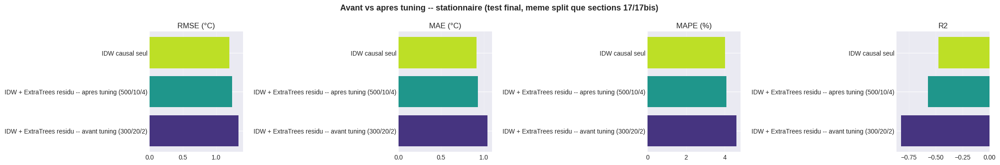


  modele final (stationnaire) entraine sur tous les points -> sauvegarde dans modeles_sauvegardes/extratrees_idw_tuned_stationnaire.joblib

PHASE INSTATIONNAIRE -- hyperparametres optimaux : n_estimators=100, max_depth=20, min_samples_leaf=1

Avant vs apres tuning, MEME protocole :
  Validation (moyenne des plis)   avant : R2=-0.2583  RMSE=0.9757  MAE=0.7729
                                  apres : R2=-0.0957  RMSE=0.9104  MAE=0.7147
  Test final (sections 17/17bis)  avant : R2=0.5665  RMSE=0.5282  MAE=0.4078
                                  apres : R2=0.5404  RMSE=0.5438  MAE=0.4133
  -> test final : RMSE en hausse de 0.0157 degC, R2 -0.0261
     Le tuning n'ameliore pas la generalisation sur le test final : ne pas remplacer le modele sans examiner les ecart-types de validation.


,RMSE (°C),MAE (°C),MAPE (%),R2
Modele,,,,
IDW + ExtraTrees residu -- avant tuning (300/20/2),0.5282,0.4078,1.8079,0.5665
IDW + ExtraTrees residu -- apres tuning (100/20/1),0.5438,0.4133,1.8319,0.5404
IDW causal seul,0.9848,0.7330,3.1877,-0.5072


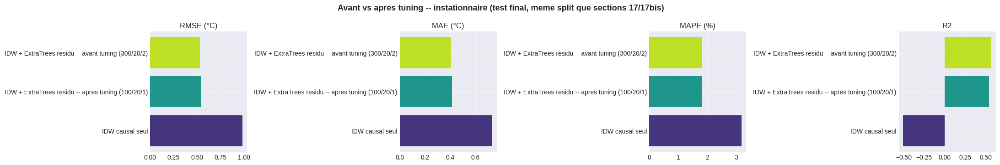


  modele final (instationnaire) entraine sur tous les points -> sauvegarde dans modeles_sauvegardes/extratrees_idw_tuned_instationnaire.joblib

HYPERPARAMETRES OPTIMAUX TROUVES (selection sur la validation, test final non utilise) :
  stationnaire    : n_estimators=500, max_depth=10, min_samples_leaf=4
  instationnaire  : n_estimators=100, max_depth=20, min_samples_leaf=1

Pour recharger un modele tune :
  infos = joblib.load('modeles_sauvegardes/extratrees_idw_tuned_stationnaire.joblib')
  modele, scaler, features = infos['modele'], infos['scaler'], infos['features']
  y_pred = idw_causal + modele.predict(scaler.transform(X[features]))   # X contient idw_causal


In [50]:
# === 19bis-c : modele final, bilan avant/apres tuning (test final), sauvegarde joblib ===
modeles_extratrees_idw_tuned = {}     # meme structure que modeles_extratrees_idw (section 14bis)
hyperparametres_optimaux_et = {}
bilan_avant_apres_tuning = {}

if not globals().get('TUNING_PRET', False) or len(globals().get('resultats_tuning_et', {})) == 0:
    print('Cellule 19bis-b non executee (ou aucune phase tunee) -> section ignoree.')
else:
    DOSSIER_MODELES = 'modeles_sauvegardes'          # meme dossier que la section 20
    os.makedirs(DOSSIER_MODELES, exist_ok=True)

    for phase, info in resultats_tuning_et.items():
        sous, mask_test = _ctx_tuning[phase]
        mask_train = ~mask_test
        best, base = info['params_optimaux'], info['params_avant']
        hyperparametres_optimaux_et[phase] = best

        X_all = sous[FEATURES_TUNING].values.astype(float)
        y_res = sous['residu'].values.astype(float)
        y_temp = sous['temperature'].values.astype(float)
        y_idw = sous['idw_causal'].values.astype(float)

        # Scaler ajuste sur toutes les lignes, comme en sections 14bis/17/17bis : il n'utilise pas la cible et
        # ne change rien pour des arbres (invariants a l'echelle des features) ; il permet de retrouver
        # a l'identique les chiffres "avant tuning" de la section 17.
        scaler_final = StandardScaler().fit(X_all)
        X_scaled = scaler_final.transform(X_all)

        # ---- (1) Bilan sur le TEST FINAL (meme split que 17/17bis) : train complet, sans sous-echantillon ----
        # Le test final n'a servi qu'ici, apres la selection des hyperparametres.
        Xtr, Xte = X_scaled[mask_train], X_scaled[mask_test]

        def entrainer_evaluer(params):
            et = ExtraTreesRegressor(**params, random_state=RANDOM_STATE_TUNING, n_jobs=-1)
            et.fit(Xtr, y_res[mask_train])
            return calculer_metriques(y_temp[mask_test], y_idw[mask_test] + et.predict(Xte))

        m_avant = entrainer_evaluer(base)
        m_apres = m_avant if best == base else entrainer_evaluer(best)
        m_idw = calculer_metriques(y_temp[mask_test], y_idw[mask_test])
        bilan_avant_apres_tuning[phase] = dict(test_avant=m_avant, test_apres=m_apres,
                                               val_avant=info['val_avant'], val_apres=info['val_apres'])

        print('=' * 88)
        print(f'PHASE {phase.upper()} -- hyperparametres optimaux : {_fmt(best)}')
        print('\nAvant vs apres tuning, MEME protocole :')
        print(f"  Validation (moyenne des plis)   avant : R2={info['val_avant']['R2']:.4f}  "
              f"RMSE={info['val_avant']['RMSE']:.4f}  MAE={info['val_avant']['MAE']:.4f}")
        print(f"                                  apres : R2={info['val_apres']['R2']:.4f}  "
              f"RMSE={info['val_apres']['RMSE']:.4f}  MAE={info['val_apres']['MAE']:.4f}")
        print(f"  Test final (sections 17/17bis)  avant : R2={m_avant['r2']:.4f}  "
              f"RMSE={m_avant['rmse']:.4f}  MAE={m_avant['mae']:.4f}")
        print(f"                                  apres : R2={m_apres['r2']:.4f}  "
              f"RMSE={m_apres['rmse']:.4f}  MAE={m_apres['mae']:.4f}")
        d_rmse = m_avant['rmse'] - m_apres['rmse']
        print(f"  -> test final : RMSE {'en baisse' if d_rmse >= 0 else 'en hausse'} de {abs(d_rmse):.4f} degC, "
              f"R2 {m_apres['r2'] - m_avant['r2']:+.4f}")
        if d_rmse < 0:
            print('     Le tuning n\'ameliore pas la generalisation sur le test final : ne pas remplacer le '
                  'modele sans examiner les ecart-types de validation.')

        _c = lambda p: f"{p['n_estimators']}/{p['max_depth']}/{p['min_samples_leaf']}"
        comp = tableau_comparatif({
            'IDW causal seul': m_idw,
            f'IDW + ExtraTrees residu -- avant tuning ({_c(base)})': m_avant,
            f'IDW + ExtraTrees residu -- apres tuning ({_c(best)})': m_apres})
        display(comp.round(4))
        barres_comparatif(comp, f'Avant vs apres tuning -- {phase} (test final, meme split que sections 17/17bis)')

        # ---- (2) Modele final "pleine grille" (comme la section 14bis) avec les hyperparametres optimaux ----
        modele_final = ExtraTreesRegressor(**best, random_state=RANDOM_STATE_TUNING, n_jobs=-1)
        modele_final.fit(X_scaled, y_res)
        infos = {'modele': modele_final, 'scaler': scaler_final, 'features': FEATURES_TUNING,
                 'hyperparametres': best, 'cible': 'residu = temperature - idw_causal'}
        modeles_extratrees_idw_tuned[phase] = infos

        chemin = os.path.join(DOSSIER_MODELES, f'extratrees_idw_tuned_{phase}.joblib')
        joblib.dump(infos, chemin)
        print(f'\n  modele final ({phase}) entraine sur tous les points -> sauvegarde dans {chemin}\n')

    print('=' * 88)
    print('HYPERPARAMETRES OPTIMAUX TROUVES (selection sur la validation, test final non utilise) :')
    for phase, p in hyperparametres_optimaux_et.items():
        print(f'  {phase:15s} : {_fmt(p)}')
    print('\nPour recharger un modele tune :')
    print("  infos = joblib.load('modeles_sauvegardes/extratrees_idw_tuned_stationnaire.joblib')")
    print("  modele, scaler, features = infos['modele'], infos['scaler'], infos['features']")
    print("  y_pred = idw_causal + modele.predict(scaler.transform(X[features]))   # X contient idw_causal")

## 20 — Sauvegarde des modèles (joblib)

Sauvegarde les modèles ExtraTrees entraînés en section 14bis (combiné IDW+ExtraTrees et ExtraTrees seul, stationnaire et instationnaire) pour pouvoir les recharger sans ré-entraîner. Le tuning d'hyperparamètres, s'il est fait, devrait être exécuté **avant** cette sauvegarde finale.

In [51]:
# === Sauvegarde des modeles entraines (joblib) ===
import joblib, os

DOSSIER_MODELES = 'modeles_sauvegardes'
os.makedirs(DOSSIER_MODELES, exist_ok=True)

modeles_a_sauver = {
    'extratrees_idw_stationnaire': globals().get('modeles_extratrees_idw', {}).get('stationnaire'),
    'extratrees_idw_instationnaire': globals().get('modeles_extratrees_idw', {}).get('instationnaire'),
    'extratrees_seul_stationnaire': globals().get('modeles_extratrees_seul', {}).get('stationnaire'),
    'extratrees_seul_instationnaire': globals().get('modeles_extratrees_seul', {}).get('instationnaire'),
}

n_sauves = 0
for nom, infos in modeles_a_sauver.items():
    if infos is None:
        print(f"  {nom:32s} -> indisponible (section correspondante non executee), ignore.")
        continue
    chemin = os.path.join(DOSSIER_MODELES, f'{nom}.joblib')
    joblib.dump(infos, chemin)  # infos = {'modele':..., 'scaler':..., 'features':...}
    print(f"  {nom:32s} -> sauvegarde dans {chemin}")
    n_sauves += 1

print(f"\n{n_sauves} modele(s) sauvegarde(s) dans '{DOSSIER_MODELES}/'.")
print("Pour recharger un modele plus tard :")
print("  infos = joblib.load('modeles_sauvegardes/extratrees_idw_stationnaire.joblib')")
print("  modele, scaler, features = infos['modele'], infos['scaler'], infos['features']")
print("  y_pred = modele.predict(scaler.transform(X[features]))")


  extratrees_idw_stationnaire      -> sauvegarde dans modeles_sauvegardes/extratrees_idw_stationnaire.joblib
  extratrees_idw_instationnaire    -> sauvegarde dans modeles_sauvegardes/extratrees_idw_instationnaire.joblib
  extratrees_seul_stationnaire     -> sauvegarde dans modeles_sauvegardes/extratrees_seul_stationnaire.joblib
  extratrees_seul_instationnaire   -> sauvegarde dans modeles_sauvegardes/extratrees_seul_instationnaire.joblib

4 modele(s) sauvegarde(s) dans 'modeles_sauvegardes/'.
Pour recharger un modele plus tard :
  infos = joblib.load('modeles_sauvegardes/extratrees_idw_stationnaire.joblib')
  modele, scaler, features = infos['modele'], infos['scaler'], infos['features']
  y_pred = modele.predict(scaler.transform(X[features]))
